<a href="https://colab.research.google.com/github/kevinroccapriore/Notebooks-papers/blob/master/Adatoms_STS_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Adatom classification
* Here we classify adatoms on the surface of kagome lattice of Co$_3$Sn$_2$S$_2$
* We seek to learn structure-property relationships
* To do so, we:

  1. Perform atom finding
  2. (Supervised ML: **Structural**) Separate found atoms based on nearest neighborhood
  3. (Unsupervised ML: **Electronic**) Further classify structural classes based on spectral similarities

In [315]:
#@title Imports
import pandas as pd
import os
import numpy as np
import cv2
from scipy import ndimage
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage import draw
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
from skimage.transform import resize
from scipy import fftpack
from sklearn.decomposition import NMF
from sklearn.decomposition import PCA

from scipy.ndimage import gaussian_filter
from scipy.ndimage import maximum_filter
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.cbook import get_sample_data
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from sklearn import mixture
from sklearn import decomposition
from sklearn.metrics import mean_squared_error as MSE

# Reproducibility
np.random.seed(1)
torch.manual_seed(0)
torch.backends.cudnn.deterministic = True

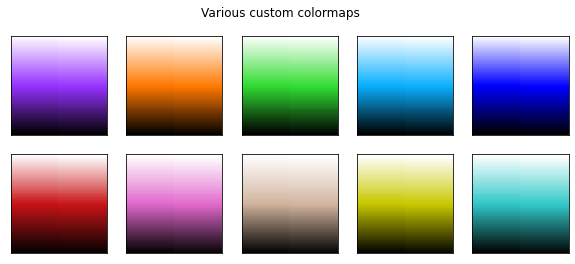

In [277]:
#@title Functions

def normalize(arr):
  normed = (arr - np.min(arr))/np.ptp(arr)
  return normed

size = 512
def gauss2d_atom(x,y,sigma,amp=1,xlen=size,ylen=size,numpix=size):
    xx = np.linspace(0,xlen,numpix)
    yy = np.linspace(0,ylen,numpix)
    mx, my = np.meshgrid(xx,yy)
    return amp*np.exp(-((mx-x)**2+(my-y)**2)/sigma)

def extract_subimages(imgdata, com, d, **kwargs):
    '''Function for cropping images around adatoms'''
    icut = kwargs.get('n')
    if icut == None:
        icut = len(com)
    img_cr_all = np.empty((0, int(d*2), int(d*2)))
    com_ = np.empty((0, 2))
    for i, c in enumerate(com):
        cx = int(np.around(c[0]))
        cy = int(np.around(c[1]))
        img_cr = np.copy(
            imgdata[cx-d:cx+d, cy-d:cy+d])
        if img_cr.shape == (int(d*2), int(d*2)):
            img_cr_all = np.append(img_cr_all, [img_cr], axis=0)
            com_ = np.append(com_, [c], axis=0)
        if i > icut:
            return img_cr_all, com_
    return img_cr_all, com_

def perform_FFT(image):
  "Performs 2D FFT on an image and returns the amplitude"
  FFT0 = fftpack.fft2(image)
  FFT0_shift = fftpack.fftshift(FFT0)
  FFT0_shift_amp_ = np.log(np.abs(FFT0_shift))
  FFT0_shift_amp = (FFT0_shift_amp_ - np.min(FFT0_shift_amp_))/np.ptp(FFT0_shift_amp_)
  return FFT0_shift_amp

def center_crop(image, coordinates, size):
  
  winx, winy = coordinates[1], coordinates[0]
  xlow, xhigh = int(round(winx-size/2)), int(round(winx+size/2))
  ylow, yhigh = int(round(winy-size/2)), int(round(winy+size/2))
  cropped = image[ylow:yhigh, xlow:xhigh]
  return cropped

def center_crop_pad(image, coordinates, size):
  # Pad it directly with same size as half window size 
  # so no matter what coordinate provided (even border coords), it will slice just fine.
  imagepad = np.pad(image, int(size/2)) 
  winx, winy = coordinates[1], coordinates[0]
  xlow, xhigh = int(round(winx)), int(round(winx+size))
  ylow, yhigh = int(round(winy)), int(round(winy+size))
  cropped = imagepad[ylow:yhigh, xlow:xhigh]
  return cropped
  
########################
### Set up colormaps ###
########################

from matplotlib.colors import LinearSegmentedColormap

data1 = np.linspace(0, 1, 2500).reshape((50, 50))

bPw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (150./255,50/255., 1.),(1,1,1)], N=100)
bOw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (1,120./255, 0),(1,1,1)], N=100)
bGw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (50./255,220./255, 50./255),(1,1,1)], N=100)
bBw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (10./255,175/255., 1.),(1,1,1)], N=100)
bDBw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (0/255,0./255, 255/255),(1,1,1)], N=100)
bRw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (200./255,20/255., 20/225.),(1,1,1)], N=100)
bPiw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (225./255,105/255., 180/225.),(1,1,1)], N=100)
bBrw= LinearSegmentedColormap.from_list('list', [(0, 0, 0), (210./255,180/255., 140/225.),(1,1,1)], N=100)
bYw= LinearSegmentedColormap.from_list('list', [(0, 0, 0), (200./255,200/255., 0/225.),(1,1,1)], N=100)
bLGw = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (50./255, 200/255, 200/255),(1,1,1)], N=100)

cmaps = [bPw,bOw,bGw,bBw,bDBw,bRw,bPiw,bBrw,bYw,bLGw]
Cmap_Blackbody = LinearSegmentedColormap.from_list('list', [(0, 0, 0.0), (0, 0.1, 0.75),(0.75,0,0.75),(1,0.75,0), (1,1,1)], N=100)
rows = int(np.ceil(float(len(cmaps))/5))
cols = int(np.ceil(float(len(cmaps))/rows))
gs1 = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (2*cols, 2*(1+rows//2)))
fig.suptitle('Various custom colormaps')
for i in range(len(cmaps)):
    ax1 = fig.add_subplot(gs1[i])
    ax1.pcolormesh(data1,cmap=cmaps.pop(0))
    plt.setp([ax1], xticks = [], yticks =[])

In [7]:
#@title Locate atoms class
class FindAtoms:
    '''
    Transforms pixel data from NN output into coordinate data
    '''
    def __init__(self, nn_output,
                 threshold=0.75, dist_edge=5,
                 dim_order='channel_first'):
        
        if nn_output.shape[-1] == 1: # Add background class for 1-channel data
            nn_output_b = 1 - nn_output
            nn_output = np.concatenate(
                (nn_output[:, :, :, None], nn_output[:, :, :, None]), axis=3)
        if dim_order == 'channel_first':  # make channel dim the last dim
            nn_output = np.transpose(nn_output, (0, 2, 3, 1))
        elif dim_order == 'channel_last':
            pass
        else:
            raise NotImplementedError(
                'For dim_order, use "channel_first" (e.g. pytorch)',
                 'or "channel_last" (e.g. tensorflow)')
        self.nn_output = nn_output
        self.threshold = threshold
        self.dist_edge = dist_edge
                       
    def get_all_coordinates(self):
        '''Extract all atomic coordinates in image
        via CoM method & store data as a dictionary
        (key: frame number)'''
        
        def find_com(image_data):
            '''Find atoms via center of mass methods'''
            labels, nlabels = ndimage.label(image_data)
            coordinates = np.array(
                ndimage.center_of_mass(
                    image_data, labels, np.arange(nlabels) + 1))
            coordinates = coordinates.reshape(coordinates.shape[0], 2)
            return coordinates

        d_coord = {}
        for i, decoded_img in enumerate(self.nn_output):
            coordinates = np.empty((0, 2))
            category = np.empty((0, 1))
            # we assume that class backgrpund is always the last one
            for ch in range(decoded_img.shape[2]-1):
                _, decoded_img_c = cv2.threshold(
                    decoded_img[:, :, ch], self.threshold, 1, cv2.THRESH_BINARY)
                coord = find_com(decoded_img_c)
                coord_ch = self.rem_edge_coord(coord)
                category_ch = np.zeros((coord_ch.shape[0], 1)) + ch
                coordinates = np.append(coordinates, coord_ch, axis=0)
                category = np.append(category, category_ch, axis=0)
            d_coord[i] = np.concatenate((coordinates, category), axis=1)
        return d_coord

    def rem_edge_coord(self, coordinates):
        '''Remove coordinates at the image edges'''

        def coord_edges(coordinates, w, h):
            return [coordinates[0] > w - self.dist_edge,
                    coordinates[0] < self.dist_edge,
                    coordinates[1] > h - self.dist_edge,
                    coordinates[1] < self.dist_edge]

        w, h = self.nn_output.shape[1:3]
        coord_to_rem = [
                        idx for idx, c in enumerate(coordinates) 
                        if any(coord_edges(c, w, h))
                        ]
        coord_to_rem = np.array(coord_to_rem, dtype=int)
        coordinates = np.delete(coordinates, coord_to_rem, axis=0)
        return coordinates

class atomnet(nn.Module):
    def __init__(self, nb_classes=3, nb_filters=25): 
        '''
        Builds  a fully convolutional neural network model
        (encoder-bottleneck-decoder type of architecture)
        Args:
            nb_classes: number of classes in the data
            nb_filters: number of filters in the first convolutional layer
        '''
        super(atomnet, self).__init__()
        self.pxac = 'softmax' if nb_classes > 1 else 'sigmoid'
        self.c1 = conv2dblock(1, 1, nb_filters)
        self.c2 = conv2dblock(1, nb_filters, nb_filters)
        self.c3 = conv2dblock(1, nb_filters, nb_filters)
        self.px = nn.Conv2d(nb_filters, nb_classes, 1, 1, 0)
               
    def forward(self, x):
        '''Forward path'''
        # Contracting path
        x = self.c3(self.c2(self.c1(x)))
        px = self.px(x)
        if self.pxac == 'sigmoid':
            out = torch.sigmoid(px)
        elif self.pxac == 'softmax':
            out = F.log_softmax(px, dim=1)
        return out

class conv2dblock(nn.Module):
    '''
    Creates a block consisting of convolutional
    layer, leaky relu and (optionally) dropout and
    batch normalization
    '''
    def __init__(self, nb_layers, input_channels, output_channels,
                 kernel_size=3, stride=1, padding=1, use_batchnorm=False,
                 lrelu_a=0.01, dropout_=0):
        '''Initializes module parameters'''
        super(conv2dblock, self).__init__()
        block = []
        for idx in range(nb_layers):
            input_channels = output_channels if idx > 0 else input_channels
            block.append(nn.Conv2d(input_channels,
                                   output_channels,
                                   kernel_size=kernel_size,
                                   stride=stride,
                                   padding=padding))
            if dropout_ > 0:
                block.append(nn.Dropout(dropout_))
            block.append(nn.LeakyReLU(negative_slope=lrelu_a))
            if use_batchnorm:
                block.append(nn.BatchNorm2d(output_channels))
        self.block = nn.Sequential(*block)

    def forward(self, x):
        '''Forward path'''
        output = self.block(x)
        return output


class upsample_block(nn.Module):
    '''
    Defines upsampling block performed using
    bilinear interpolation followed by 1-by-1
    convolution
    '''
    def __init__(self, input_channels, output_channels,
                 mode='interpolate', kernel_size=1,
                 stride=1, padding=0):
        '''Initalizes model parameters'''
        super(upsample_block, self).__init__()
        self.conv = nn.Conv2d(
            input_channels, output_channels,
            kernel_size=kernel_size,
            stride=stride, padding=padding)

    def forward(self, x):
        '''Defines a forward path'''
        x = F.interpolate(
            x, scale_factor=2,
            mode='bilinear', align_corners=False)
        return self.conv(x) 

In [ ]:
#@title Download all data
%%capture
# Experimental data
!wget https://www.dropbox.com/s/fd9pi9btv9tjku6/blobs_expdata.npz

# Checkpoint
!wget https://www.dropbox.com/s/5vzpw6xd7rx0lwj/PCA_classes.npz?
!wget https://www.dropbox.com/s/8fhnomfo30aw6dt/PCA_coordinates_v1.npz

# Theory calculations
!wget https://www.dropbox.com/s/mxqajyff3c37hf3/S_on_Co_surface_v1.xls
!wget https://www.dropbox.com/s/xseuijwg96zzqy4/Sn_on_Co_surface_v1.xls
!wget https://www.dropbox.com/s/ih2b64frjj51gvc/SnS_on_Co_surface.xls

# Trained neural network (for atom finding)
!wget https://www.dropbox.com/s/ohtis3pxk516aw0/model_weights.pt

In [15]:
rawdata = np.load("blobs_expdata.npz", allow_pickle=True)

exp_topo = rawdata['exp_topo']   # Topography
exp_cits = rawdata['exp_cits']   # dI/dV
z_axis = rawdata['z_axis']       # Calibration voltage axis
IV = rawdata['IV']               # I/V

# Atom finding

* Load trained neural network for atom finding (a simpler, more time-consuming approach is to use blob finder - e.g., laplacian of gaussian)

* loading the weights here

In [8]:
model = atomnet(nb_filters=16)
modelweights = torch.load("model_weights.pt", map_location = torch.device('cpu'))
model.load_state_dict(modelweights)

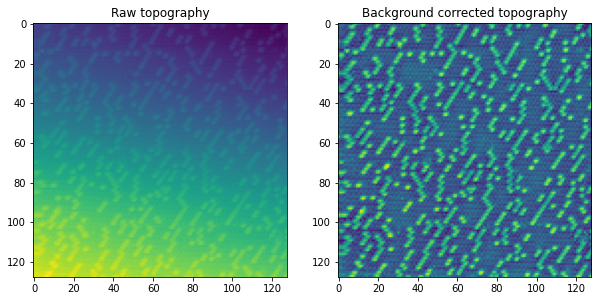

In [22]:
sigma = 3  

filtered = ndimage.gaussian_filter(exp_topo,sigma=sigma)
topo_f = exp_topo - filtered
topo_f_n = (topo_f - np.min(topo_f)) / np.ptp(topo_f)

plt.figure(figsize=(10,5))
gs = gridspec.GridSpec(1,2)
ax1,ax2 = plt.subplot(gs[0]), ax2 = plt.subplot(gs[1])
ax1.imshow(exp_topo)
ax2.imshow(topo_f_n)
ax1.set_title('Raw topography')
ax2.set_title('Background corrected topography');

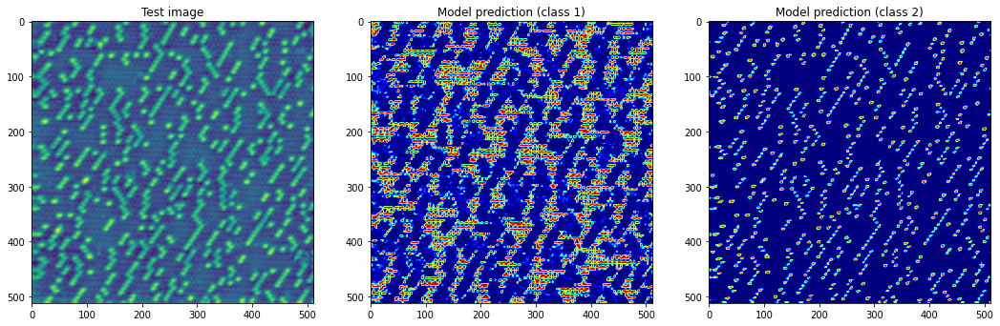

In [24]:
resized = 512

test_img0 = topo_f_n.reshape((1,topo_f_n.shape[0],topo_f_n.shape[1]))
test_img = resize(test_img0,(1,resized,resized))

# Convert to 4D tensor (required, even if it is a single image)
test_img = test_img[np.newaxis, ...]
# Convert to pytorch format
# test_img_ = torch.from_numpy(test_img).float().cuda()
test_img_ = torch.from_numpy(test_img).float()
# make a prediction
prediction = model.forward(test_img_)
prediction = torch.exp(prediction).cpu().detach().numpy() # that's because we used log_softmax
# plot results
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))
ax1.imshow(test_img[0,0])
ax2.imshow(prediction[0,0], cmap='jet')
ax3.imshow(prediction[0,1], cmap='jet')
ax1.set_title('Test image')
ax2.set_title('Model prediction (class 1)')
ax3.set_title('Model prediction (class 2)');

* We only care about adatoms here, so can be flexible with the thresholding

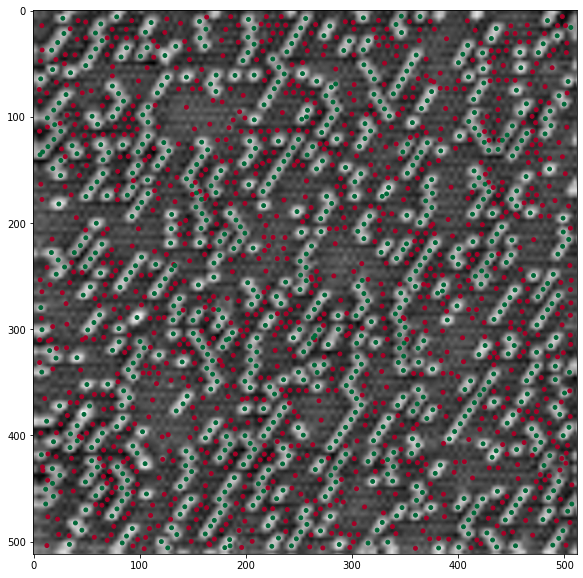

In [25]:
threshold = 0.5  # originally 0.5

# Idea, put this to ~ 0.75, it finds TOO MANY adatoms 
# BUT, just delete any atoms that are too close to one another (of course, LEAVE one of them)

coordinates_im = FindAtoms(prediction, threshold = threshold).get_all_coordinates()

y, x, c = coordinates_im[0].T
plt.figure(figsize=(10,10))
plt.imshow(test_img[0,0], cmap='gray')
plt.scatter(x, y, c=c, cmap='RdYlGn', s=15);

* Separate the labels, we only want the adatoms

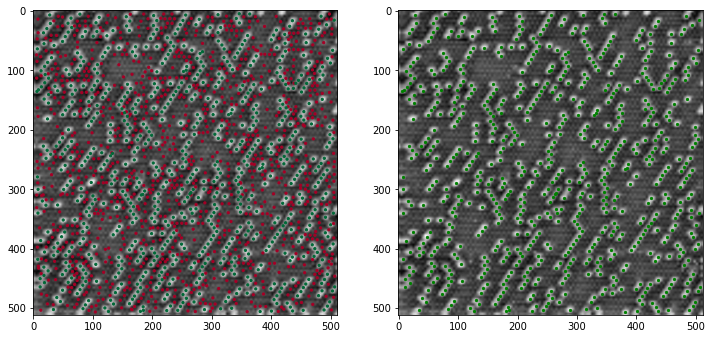

In [26]:
temp = np.where(coordinates_im[0][:,2]==1)

x_NEW_, y_NEW_ = x[temp], y[temp]

y_NEW = np.reshape(x_NEW_, (x_NEW_.shape[0],1))
x_NEW = np.reshape(y_NEW_, (y_NEW_.shape[0],1))

xycoords_NEW = np.concatenate((x_NEW,y_NEW), axis = 1)

f,a = plt.subplots(1,2,figsize=(12,6))
a[0].imshow(test_img[0,0], cmap='gray')
a[0].scatter(x, y, c=c, cmap='RdYlGn', s=5);

a[1].imshow(test_img[0,0], cmap='gray')
a[1].scatter(y_NEW, x_NEW, c='g', cmap='RdYlGn', s=5);

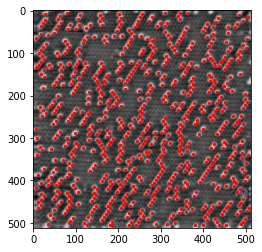

In [27]:
plt.figure()
plt.imshow(test_img[0,0], cmap='gray')
plt.scatter(xycoords_NEW[:,1], xycoords_NEW[:,0], c='r', s=5)

In [28]:
try:
  arrsize = resized  # The same size as the image above
except NameError:
  arrsize = 512

atomsize = 10
amplitude = 1

try: 
  bloblist = np.zeros(x_NEW.shape[0], dtype=object) 
  for ii in range(x_NEW.shape[0]):
      bloblist[ii] = (x_NEW[ii][0], y_NEW[ii][0])
except NameError:
  print('name error encountered, passing...')
  pass
     
adatoms = np.zeros((arrsize,arrsize))
for kk in range(len(bloblist)):
  adatoms += gauss2d_atom(bloblist[kk][1],bloblist[kk][0], amp = amplitude, sigma = atomsize, xlen = arrsize, ylen=arrsize, numpix = arrsize)

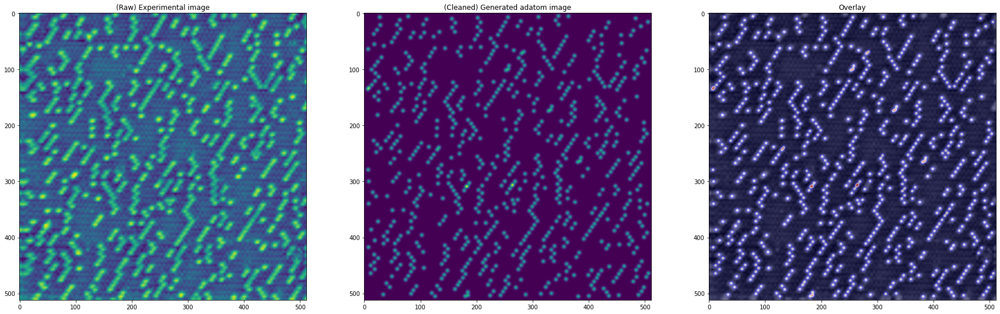

In [29]:
f,a = plt.subplots(1,3,figsize = (30,10))
a[0].imshow(test_img[0,0])
a[1].imshow(adatoms)
a[2].imshow(test_img[0,0], cmap = 'gray')
a[2].imshow(adatoms, alpha = 0.5, cmap = 'seismic')

a[0].set_title('(Raw) Experimental image')
a[1].set_title('(Cleaned) Generated adatom image')
a[2].set_title('Overlay');

# Structural classification

* Crop image into segments to classify.

In [53]:
crs = 11 # size of image to crop

topo_f_n_resized = resize(topo_f_n, (resized,resized))
imgstack_, com = extract_subimages(adatoms, xycoords_NEW, crs)

for ii in range(imgstack_.shape[0]):
  imgstack[ii] = normalize(imgstack_[ii])
imgstack.shape

(717, 22, 22)

254

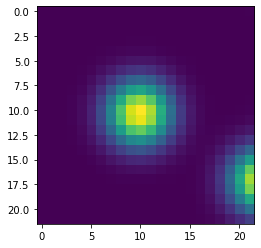

In [54]:
ii = np.random.randint(0,imgstack.shape[0])
plt.imshow(imgstack[ii])

ii

Viewing the stack

(-0.05, 1.05, -0.05, 1.05)

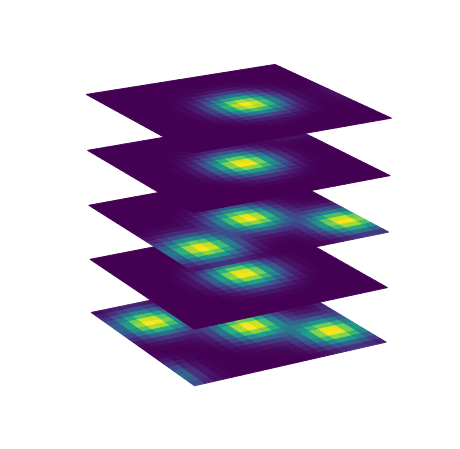

In [57]:
# Create mesh.
X, Y = np.meshgrid(np.linspace(0,1,22), np.linspace(0,1,22))

data1 = imgstack[52] # 35
data2 = imgstack[26]
data3 = imgstack[2]
data4 = imgstack[26]
data5 = imgstack[35]

# Create flat surface.
Z = np.zeros_like(X);

# Plot
fig = plt.figure(figsize = (8,8));
ax = fig.gca(projection='3d');
ax.plot_surface(X, Y, Z, rstride=1, cstride=1, facecolors = plt.cm.viridis(data1), shade=False);
ax.plot_surface(X, Y, Z+10, rstride=1, cstride=1, facecolors = plt.cm.viridis(data2), shade=False);
ax.plot_surface(X, Y, Z+20, rstride=1, cstride=1, facecolors = plt.cm.viridis(data3), shade=False);
ax.plot_surface(X, Y, Z+30, rstride=1, cstride=1, facecolors = plt.cm.viridis(data4), shade=False);
ax.plot_surface(X, Y, Z+40, rstride=1, cstride=1, facecolors = plt.cm.viridis(data5), shade=False);


ax.view_init(elev = 20, azim = -30)
ax.axis('off')

* PCA decomposition....

In [58]:
d0, d1, d2 = imgstack.shape
X_vec = imgstack.reshape(d0, d1*d2)  # flatten for pca
X_vec.shape

(717, 484)

(-1.0, 20.0)

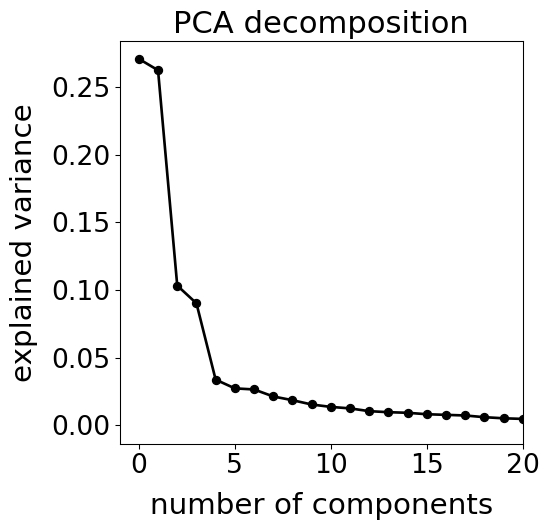

In [61]:
pca = decomposition.PCA()
pca.fit(X_vec)
plt.figure(1, figsize=(6, 6), dpi = 96)
plt.clf()
plt.axes([.2, .2, .7, .7])
plt.plot(pca.explained_variance_ratio_,'o-', linewidth=2, c = 'black' )
# plt.axis('tight')
plt.xlabel('number of components', fontsize = 22, labelpad = 10)
plt.ylabel('explained variance', fontsize = 22, labelpad = 10)
plt.tick_params(axis='both', labelsize = 20)
plt.title("PCA decomposition", fontsize = 23)
plt.xlim(-1, 20)

In [62]:
nc = 5

clf = mixture.GaussianMixture(n_components=nc, covariance_type='diag', random_state = 8000).fit(X_vec)
classes = clf.predict(X_vec) + 1

In [63]:
class1 = np.where(classes==1)[0]
class2 = np.where(classes==2)[0]
class3 = np.where(classes==3)[0]
class4 = np.where(classes==4)[0]
class5 = np.where(classes==5)[0]
classes

array([4, 4, 5, 4, 2, 3, 4, 2, 2, 4, 3, 5, 3, 4, 3, 5, 5, 3, 2, 4, 4, 3,
       2, 3, 4, 4, 4, 2, 4, 4, 3, 3, 3, 3, 3, 4, 3, 3, 4, 5, 4, 3, 3, 3,
       3, 1, 3, 3, 3, 1, 3, 4, 1, 4, 4, 3, 4, 1, 2, 4, 4, 4, 4, 4, 4, 4,
       2, 3, 4, 3, 4, 5, 1, 3, 4, 3, 3, 3, 2, 4, 4, 3, 3, 3, 4, 1, 1, 1,
       5, 3, 3, 2, 3, 1, 1, 2, 3, 4, 3, 4, 1, 3, 3, 3, 4, 2, 4, 4, 3, 1,
       5, 2, 3, 3, 5, 1, 4, 5, 5, 2, 4, 5, 1, 1, 2, 3, 4, 2, 1, 2, 3, 2,
       4, 3, 4, 1, 3, 4, 4, 4, 3, 3, 1, 4, 3, 1, 1, 4, 1, 3, 1, 4, 4, 1,
       3, 4, 3, 3, 2, 3, 3, 2, 1, 5, 2, 4, 2, 2, 3, 5, 3, 3, 3, 3, 3, 3,
       3, 3, 4, 5, 3, 4, 3, 4, 3, 3, 3, 4, 4, 5, 3, 3, 4, 1, 3, 4, 3, 4,
       3, 2, 4, 3, 5, 3, 2, 4, 4, 3, 3, 4, 3, 1, 1, 5, 5, 4, 4, 5, 3, 4,
       2, 5, 2, 4, 1, 2, 4, 3, 3, 3, 1, 4, 5, 3, 2, 5, 5, 4, 3, 2, 4, 2,
       3, 5, 2, 3, 4, 3, 4, 1, 1, 3, 4, 4, 1, 3, 3, 4, 4, 3, 2, 1, 4, 5,
       3, 1, 4, 4, 3, 4, 4, 5, 1, 2, 4, 3, 4, 2, 4, 4, 3, 3, 4, 3, 4, 4,
       4, 4, 4, 3, 4, 4, 3, 3, 4, 3, 3, 1, 3, 3, 3,

* View classes by their "representative" image (which is an *average* of all images within a class)

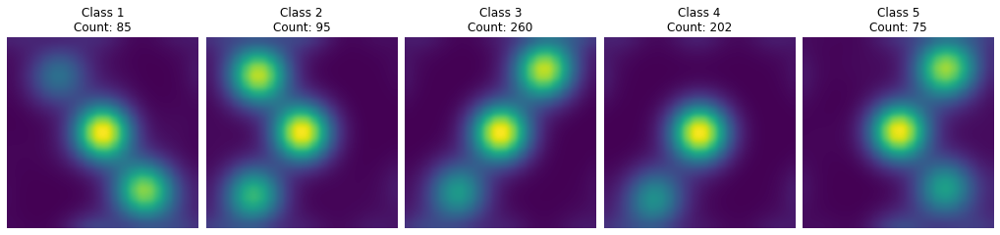

In [64]:
cla = np.ndarray(shape=(np.amax(classes), int(crs*2), int(crs*2)))
fig = plt.figure(figsize=(18, 10))

rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(np.amax(classes))/rows))

gs1 = gridspec.GridSpec(rows, cols)

for i in range(np.amax(classes)):
    cl = imgstack[classes == i + 1]
    cla[i] = np.mean(cl, axis=0)
    cla_en = np.copy(cla[i])
    ax = fig.add_subplot(gs1[i])
    ax.imshow(cla_en, Interpolation = 'Gaussian')
    
    ax.axis('off')
    ax.set_title('Class ' + str(i + 1) + '\nCount: ' + str(len(cl)))

plt.subplots_adjust(hspace=0.06, wspace=0.04)

This does not capture the desired effects. Namely:
* Some of the classes are overlapping one another, due simply to different rotations counting as different classes
* Even within a class, it is clear there is a bit of variability - note the different relative intensities between atoms

<font size = 6>`GMM does not perform well for our needs here`</font>

<font size = 6>`supervised learning`</font>
* We posit that we must <u>clearly define</u> what we want each class to be

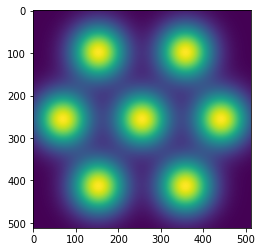

In [66]:
# Generate a synthetic unit cell for choosing classes
# We define atom positions relative to the center of the image (where the atom0 resides)
# sigma essentially adjusts the size of the atoms

sigma = 4000 # Default is 3000

centerx, centery = arrsize/2, arrsize/2
atom0 = gauss2d_atom(centerx,centery, sigma = sigma)
atom1 = gauss2d_atom(centerx - arrsize/5,centery - arrsize/3.25, sigma = sigma)
atom2 = gauss2d_atom(centerx + arrsize/5,centery - arrsize/3.25, sigma = sigma)
atom3 = gauss2d_atom(centerx + arrsize/2.75,centery, sigma = sigma)
atom4 = gauss2d_atom(centerx + arrsize/5,centery + arrsize/3.25, sigma = sigma)
atom5 = gauss2d_atom(centerx - arrsize/5,centery + arrsize/3.25, sigma = sigma)
atom6 = gauss2d_atom(centerx - arrsize/2.75,centery, sigma = sigma)

plt.imshow(atom0+atom1+atom2+atom3+atom4+atom5+atom6)

* Here is what we *want (expect)* as the categorized classes:

In [67]:
class1_dict = {1 : atom0}

class2_dict = {1 : atom0+atom1,
               2 : atom0+atom2,
               3 : atom0+atom3,
               4 : atom0+atom4,
               5 : atom0+atom5,
               6 : atom0+atom6}

class3_dict = {1 : atom0+atom1+atom2,
               2 : atom0+atom2+atom3,
               3 : atom0+atom3+atom4,
               4 : atom0+atom4+atom5,
               5 : atom0+atom5+atom6,
               6 : atom0+atom6+atom1}

class4_dict = {1 : atom0+atom1+atom3,
               2 : atom0+atom2+atom4,
               3 : atom0+atom3+atom5,
               4 : atom0+atom4+atom6,
               5 : atom0+atom5+atom1,
               6 : atom0+atom6+atom2}

class5_dict = {1 : atom0+atom1+atom4,
               2 : atom0+atom2+atom5,
               3 : atom0+atom3+atom6}
               
# For referencing later
classes_all = {1:class1_dict, 
               2:class2_dict,
               3:class3_dict,
               4:class4_dict,
               5:class5_dict}

[]

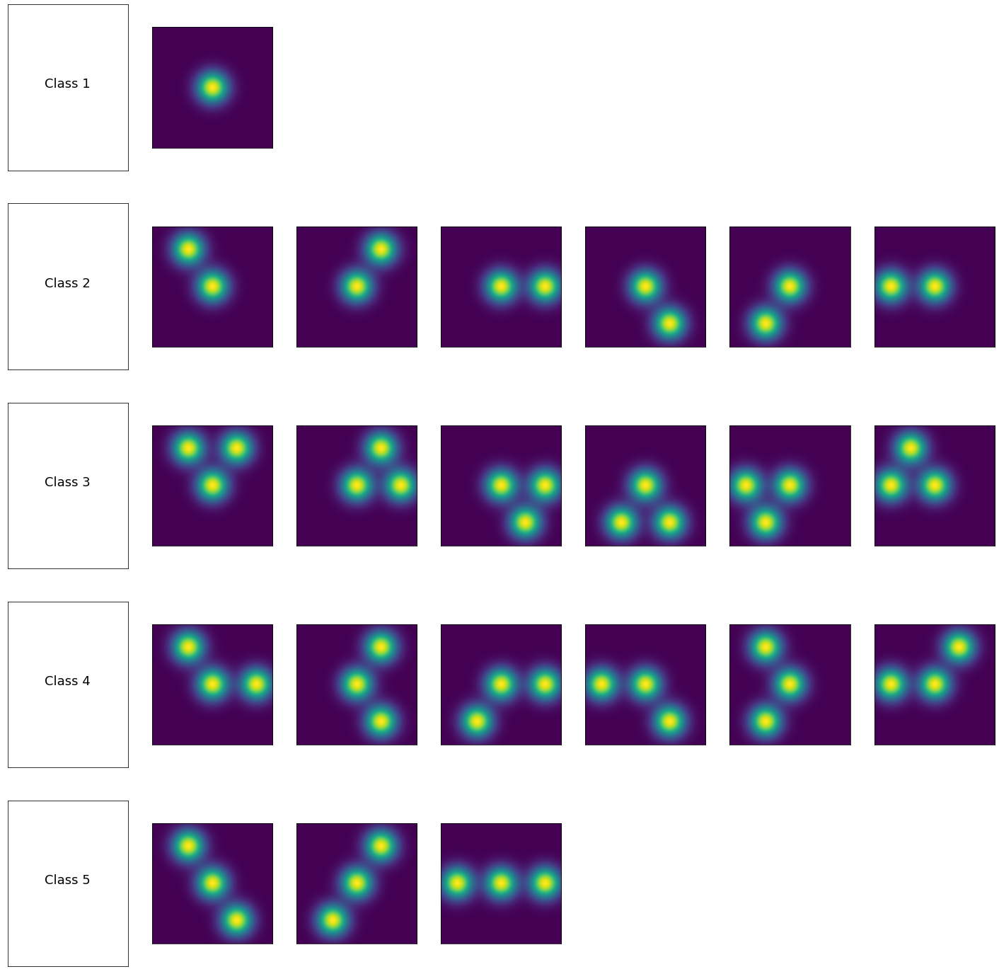

In [68]:
plt.figure(figsize=(25,25))
gs = gridspec.GridSpec(5,7)
ax10, ax11 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
ax20, ax21, ax22 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[1,2])
ax23, ax24, ax25, ax26 = plt.subplot(gs[1,3]), plt.subplot(gs[1,4]), plt.subplot(gs[1,5]), plt.subplot(gs[1,6])
ax30, ax31, ax32 = plt.subplot(gs[2,0]), plt.subplot(gs[2,1]), plt.subplot(gs[2,2])
ax33, ax34, ax35, ax36 = plt.subplot(gs[2,3]), plt.subplot(gs[2,4]), plt.subplot(gs[2,5]), plt.subplot(gs[2,6])
ax40, ax41, ax42 = plt.subplot(gs[3,0]), plt.subplot(gs[3,1]), plt.subplot(gs[3,2])
ax43, ax44, ax45, ax46 = plt.subplot(gs[3,3]), plt.subplot(gs[3,4]), plt.subplot(gs[3,5]), plt.subplot(gs[3,6])
ax50, ax51, ax52, ax53 = plt.subplot(gs[4,0]), plt.subplot(gs[4,1]), plt.subplot(gs[4,2]), plt.subplot(gs[4,3])

#class 1
ax11.imshow(class1_dict[1])

#class 2
ax21.imshow(class2_dict[1])
ax22.imshow(class2_dict[2])
ax23.imshow(class2_dict[3])
ax24.imshow(class2_dict[4])
ax25.imshow(class2_dict[5])
ax26.imshow(class2_dict[6])

#class 3
ax31.imshow(class3_dict[1])
ax32.imshow(class3_dict[2])
ax33.imshow(class3_dict[3])
ax34.imshow(class3_dict[4])
ax35.imshow(class3_dict[5])
ax36.imshow(class3_dict[6])

#class 4
ax41.imshow(class4_dict[1])
ax42.imshow(class4_dict[2])
ax43.imshow(class4_dict[3])
ax44.imshow(class4_dict[4])
ax45.imshow(class4_dict[5])
ax46.imshow(class4_dict[6])

#class 5
ax51.imshow(class5_dict[1])
ax52.imshow(class5_dict[2])
ax53.imshow(class5_dict[3])

ax10.text(0.5,0.5, 'Class 1', ha='center', fontsize = 18)
ax20.text(0.5,0.5, 'Class 2', ha='center', fontsize = 18)
ax30.text(0.5,0.5, 'Class 3', ha='center', fontsize = 18)
ax40.text(0.5,0.5, 'Class 4', ha='center', fontsize = 18)
ax50.text(0.5,0.5, 'Class 5', ha='center', fontsize = 18)

plt.setp([ax10,ax11,ax20,ax21,ax22,ax23,ax24,ax25,ax26,ax30,ax31,
          ax32,ax33,ax34,ax35,ax36,ax40,ax41,ax42,ax43,ax44,ax45,
          ax46,ax50,ax51,ax52,ax53],xticks=[],yticks=[])

Notice that the various rotations of atomic configurations are chosen to be part of the same class. This is one aspect GMM could not reconcile

<font size=6>` Enumerate neighbors ("one hot encoding")`</font>

* Let's take a look at a handful of random subimages of adatoms and their neighbors:

[]

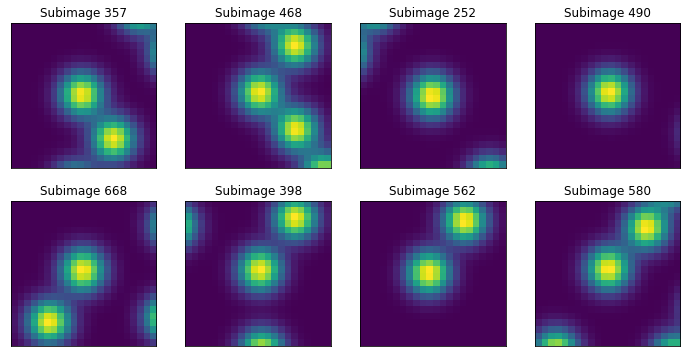

In [69]:
plt.figure(figsize = (12,6))
gs = gridspec.GridSpec(2,4)
ax00 = plt.subplot(gs[0,0])
ax01 = plt.subplot(gs[0,1])
ax02 = plt.subplot(gs[0,2])
ax03 = plt.subplot(gs[0,3])
ax10 = plt.subplot(gs[1,0])
ax11 = plt.subplot(gs[1,1])
ax12 = plt.subplot(gs[1,2])
ax13 = plt.subplot(gs[1,3])

axdict = {1:ax00, 2:ax01, 3:ax02, 4:ax03, 5:ax10, 6:ax11, 7:ax12, 8:ax13}
for ii in range(1,len(axdict)+1):
  jj = np.random.randint(0,imgstack.shape[0])
  axdict[ii].imshow(imgstack[jj])
  axdict[ii].set_title('Subimage {}'.format(jj))

plt.setp([ax00,ax01,ax02,ax03,ax10,ax11,ax12,ax13], xticks=[], yticks=[])

* Note the adatoms are **centered** in each subimage, so we consider all images 'aligned'
* Additionally, each image has the *same number of pixels*, and each atom is defined by a gaussian (coded above) with the *same size/amplitude*.   We can use this information to our benefit:
* We designate particular regions in the image to be the possible atom positions, and if the intensity total in that region reaches a user specified threshold, then an atom is said to be present.

* 6 regions (ignore center, that's the atom in question, of course it's there)
* if pixels in the region sum to some THRESHOLD, then there is an atom in that position

R1:  14.176427189040835
R2:  0.15775847087086495
R3:  0.1810750272514274
R4:  0.8504299490438584
R5:  1.5576608053125154
R6:  0.4916006358528232
center:  15.097483855908468


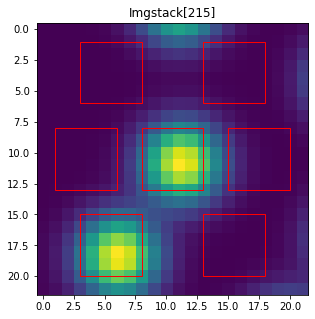

In [70]:
ii = np.random.randint(0,imgstack.shape[0])

#####################
### region coords ###
#####################
length = 5         # side length of square ROI
r1coords = (3,15)  #
r2coords = (1,8)   #
r3coords = (3,1)   #
r4coords = (13,1)  # 
r5coords = (15,8)  #
r6coords = (13,15) #
r0coords = (8,8)   # center atom

plt.figure(figsize = (10,5))
gs = gridspec.GridSpec(1,1)
ax = plt.subplot(gs[0])
ax.imshow(imgstack[ii])

roidict = {0:r0coords, 1:r1coords, 2:r2coords, 
           3:r3coords, 4:r4coords, 5:r5coords, 6:r6coords}
roilist = [0, 1, 2, 3, 4, 5, 6]
for jj in range(0, len(roidict)):
  roilist[jj] = Rectangle(roidict[jj], length, length, fill = False, color = 'r')
  ax.add_patch(roilist[jj])

ax.set_title('Imgstack[{}]'.format(ii));

print('R1: ', np.sum(imgstack[ii,r1coords[1]:r1coords[1]+length,r1coords[0]:r1coords[0]+length]))
print('R2: ', np.sum(imgstack[ii,r2coords[1]:r2coords[1]+length,r2coords[0]:r2coords[0]+length]))
print('R3: ', np.sum(imgstack[ii,r3coords[1]:r3coords[1]+length,r3coords[0]:r3coords[0]+length]))
print('R4: ', np.sum(imgstack[ii,r4coords[1]:r4coords[1]+length,r4coords[0]:r4coords[0]+length]))
print('R5: ', np.sum(imgstack[ii,r5coords[1]:r5coords[1]+length,r5coords[0]:r5coords[0]+length]))
print('R6: ', np.sum(imgstack[ii,r6coords[1]:r6coords[1]+length,r6coords[0]:r6coords[0]+length]))
print('center: ', np.sum(imgstack[ii,r0coords[1]:r0coords[1]+length,r0coords[0]:r0coords[0]+length]))

* After iterating above a few times, looks like the "THRESHOLD" that should be used is: <font color = 'crimson'> **7** </font>
* Threshold is based on the ATOM SIZE and the size of the ROI. 
  * It should have a relation to these. 
* i.e., if the sum of what's in these ROIs is >= 7, then an atom is deemed to be present in that location

In [71]:
thresh = 7   # Adjust as needed, 7 seems about right for the given 2D gaussian size and ROI size

####### Note, this threshold value is not unique to each dataset. It simply needs to be "calibrated"
####### for particular gaussian size and ROI size. For what has been chosen, threshold of 7 appears to be reasonable

r1 = np.zeros((imgstack.shape[0]))
r2 = np.zeros((imgstack.shape[0]))
r3 = np.zeros((imgstack.shape[0]))
r4 = np.zeros((imgstack.shape[0]))
r5 = np.zeros((imgstack.shape[0]))
r6 = np.zeros((imgstack.shape[0]))

r1sum = np.zeros((imgstack.shape[0]))
r2sum = np.zeros((imgstack.shape[0]))
r3sum = np.zeros((imgstack.shape[0])) 
r4sum = np.zeros((imgstack.shape[0])) 
r5sum = np.zeros((imgstack.shape[0])) 
r6sum = np.zeros((imgstack.shape[0]))

classified = np.zeros((imgstack.shape[0]))

for ii in range(imgstack.shape[0]):
  r1sum[ii] = np.sum(imgstack[ii,r1coords[1]:r1coords[1]+length,r1coords[0]:r1coords[0]+length])
  r2sum[ii] = np.sum(imgstack[ii,r2coords[1]:r2coords[1]+length,r2coords[0]:r2coords[0]+length])
  r3sum[ii] = np.sum(imgstack[ii,r3coords[1]:r3coords[1]+length,r3coords[0]:r3coords[0]+length])
  r4sum[ii] = np.sum(imgstack[ii,r4coords[1]:r4coords[1]+length,r4coords[0]:r4coords[0]+length])
  r5sum[ii] = np.sum(imgstack[ii,r5coords[1]:r5coords[1]+length,r5coords[0]:r5coords[0]+length])
  r6sum[ii] = np.sum(imgstack[ii,r6coords[1]:r6coords[1]+length,r6coords[0]:r6coords[0]+length])

  if r1sum[ii]>=thresh:
    r1[ii] = 1
  else:
    r1[ii] = 0
  if r2sum[ii]>=thresh:
    r2[ii] = 1
  else:
    r2[ii] = 0
  if r3sum[ii]>=thresh:
    r3[ii] = 1
  else:
    r3[ii] = 0
  if r4sum[ii]>=thresh:
    r4[ii] = 1
  else:
    r4[ii] = 0
  if r5sum[ii]>=thresh:
    r5[ii] = 1
  else:
    r5[ii] = 0
  if r6sum[ii]>=thresh:
    r6[ii] = 1
  else:
    r6[ii] = 0

###############################
### Logic for atom presence ###
###############################

  if  r1[ii] + r2[ii] + r3[ii] + r4[ii] + r5[ii] + r6[ii] == 0:
    classified[ii] = 1
  elif r1[ii] and r2[ii] or r2[ii] and r3[ii] or r3[ii] and r4[ii] or r4[ii] and r5[ii] or r5[ii] and r6[ii] or r6[ii] and r1[ii]:
    classified[ii] = 3
  elif r1[ii] and r3[ii] or r2[ii] and r4[ii] or r3[ii] and r5[ii] or r4[ii] and r6[ii] or r5[ii] and r1[ii] or r6[ii] and r2[ii]:
    classified[ii] = 4
  elif r1[ii] and r4[ii] or r2[ii] and r5[ii] or r3[ii] and r6[ii]:
    classified[ii] = 5
  elif r1[ii] or r2[ii] or r3[ii] or r4[ii] or r5[ii] or r6[ii]:
    classified[ii] = 2
  else:
    classified[ii] = 0

* Let's evaluate how this has performed:

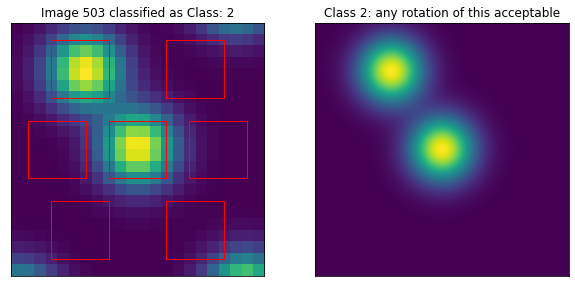

In [72]:
ii = np.random.randint(0,imgstack.shape[0])
classdetected = int(classified[ii])
whichclass = classes_all[classdetected][1] # select the first subclass rotation, [1], as visual identifier

f,ax = plt.subplots(1,2, figsize = (10,5))
for jj in range(0, len(roidict)):
  roilist[jj] = Rectangle(roidict[jj], length, length, fill = False, color = 'r')
  ax[0].add_patch(roilist[jj])
ax[0].imshow(imgstack[ii])
ax[0].set_title('Image {} classified as Class: {}'.format(ii, classdetected))

ax[1].imshow(whichclass)
ax[1].set_title("Class {}: any rotation of this acceptable".format(classdetected))

# print('Image # {}/{}'.format(ii,imgstack.shape[0]))
# print('Class: {}'.format(classdetected))

plt.setp([ax[0],ax[1]],xticks=[], yticks=[]);

* Recall that this previous classification is based on the "adatom filtered" image. It is not the original data! There:
* Check the REAL (experimental) image with same statistics

In [73]:
topo_f_n.shape, topo_f_n_resized.shape, xycoords_NEW.shape

((128, 128), (512, 512), (752, 2))

In [74]:
imgstack_exp, com_exp = extract_subimages(topo_f_n_resized, xycoords_NEW, crs)
imgstack_exp_old, com_exp_old = extract_subimages(topo_f_n, xycoords_NEW/4, 3)
imgstack_exp.shape, imgstack_exp_old.shape

((717, 22, 22), (718, 6, 6))

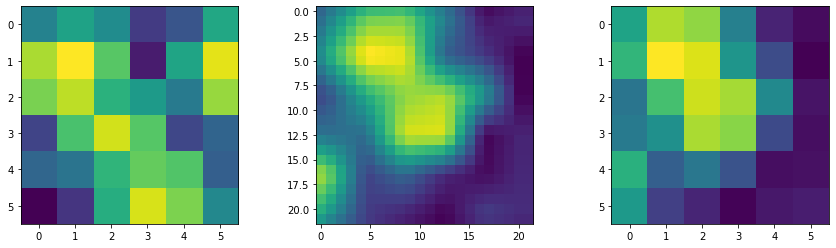

In [75]:
k=95

fig,ax = plt.subplots(1,3,figsize=(15,4))
ax[0].imshow(imgstack_exp_old[k])
ax[1].imshow(imgstack_exp[k])
ax[2].imshow(resize(imgstack_exp[k], (6,6)))

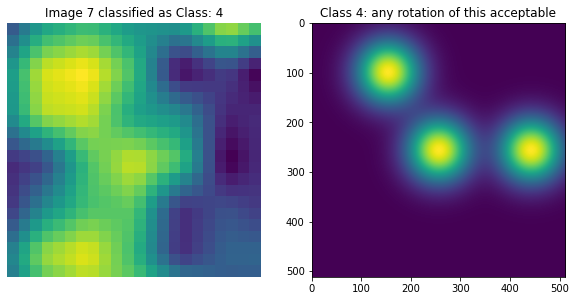

In [80]:
ii = np.random.randint(0,imgstack.shape[0])
classdetected = int(classified[ii])
whichclass = classes_all[classdetected][1]

r_1 = Rectangle(r1coords, length, length, fill = False, color = 'r')
r_2 = Rectangle(r2coords, length, length, fill = False, color = 'r')
r_3 = Rectangle(r3coords, length, length, fill = False, color = 'r')
r_4 = Rectangle(r4coords, length, length, fill = False, color = 'r')
r_5 = Rectangle(r5coords, length, length, fill = False, color = 'r')
r_6 = Rectangle(r6coords, length, length, fill = False, color = 'r')
r_0 = Rectangle(r0coords, length, length, fill = False, color = 'r')

f,ax = plt.subplots(1,2, figsize = (10,5))
ax[0].imshow(imgstack_exp[ii])

ax[0].set_title('Image {} classified as Class: {}'.format(ii, int(classified[ii])))

ax[1].imshow(whichclass)
ax[1].set_title("Class {}: any rotation of this acceptable".format(classdetected))

ax[0].axis('off');

You may re-run the previous cell a few times to check individual classification

* Note, we classified based on the adatom filtered image which is derived directly from the original data. Thus the classification heavily depends on how well the filtered step was done (which was done via atom finding with NN). 
* In other words none of these steps can fail

* Group all classified adatoms into class variables:

In [81]:
blobclass1 = np.asarray(np.where(classified == 1))[0]
blobclass2 = np.asarray(np.where(classified == 2))[0]
blobclass3 = np.asarray(np.where(classified == 3))[0]
blobclass4 = np.asarray(np.where(classified == 4))[0]
blobclass5 = np.asarray(np.where(classified == 5))[0]
blobclassNONE = np.asarray(np.where(classified == 0))[0]

blobclasses = {1: blobclass1,
               2: blobclass2,
               3: blobclass3,
               4: blobclass4,
               5: blobclass5}

In [82]:
print('Class 1 adatoms found: {}'.format(blobclass1.shape[0]))
print('Class 2 adatoms found: {}'.format(blobclass2.shape[0]))
print('Class 3 adatoms found: {}'.format(blobclass3.shape[0]))
print('Class 4 adatoms found: {}'.format(blobclass4.shape[0]))
print('Class 5 adatoms found: {}\n'.format(blobclass5.shape[0]))
print('Unclassified: {}'.format(blobclassNONE.shape[0]))

Class 1 adatoms found: 99
Class 2 adatoms found: 319
Class 3 adatoms found: 13
Class 4 adatoms found: 109
Class 5 adatoms found: 177

Unclassified: 0


* Show the location of each of these identified classes on the **original pixel density** topography

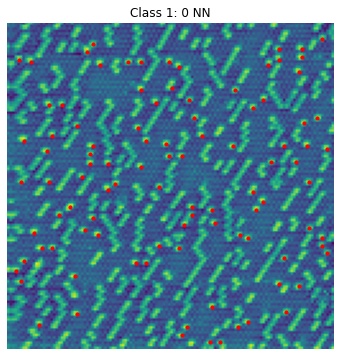

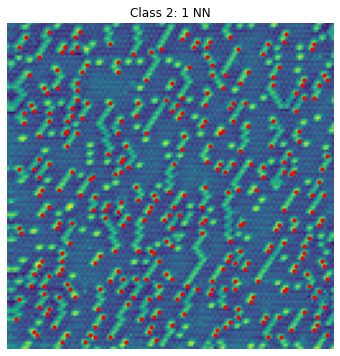

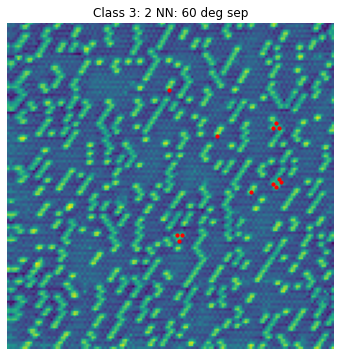

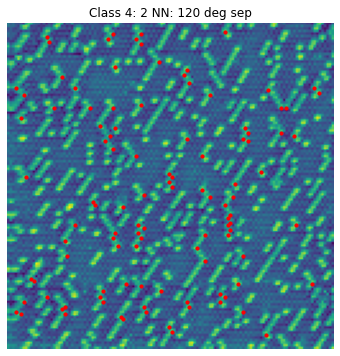

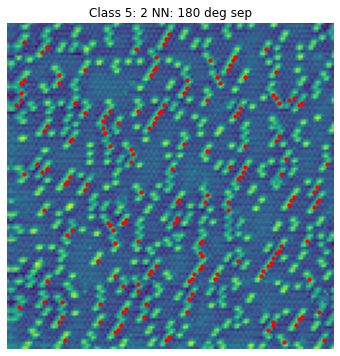

In [84]:
# topo_f

plt.figure(figsize=(6,6))
plt.imshow(topo_f_n)
for ii in range(blobclass1.shape[0]):
  plt.scatter(int(round(com[blobclass1[ii],1]/4)), int(round(com[blobclass1[ii],0]/4)), color = 'r', s = 10)
plt.title('Class 1: 0 NN')
plt.axis('off');

plt.figure(figsize=(6,6))
plt.imshow(topo_f_n)
for ii in range(blobclass2.shape[0]):
  plt.scatter(int(round(com[blobclass2[ii],1]/4)), int(round(com[blobclass2[ii],0]/4)), color = 'r', s = 10)
plt.title('Class 2: 1 NN')
plt.axis('off');

plt.figure(figsize=(6,6))
plt.imshow(topo_f_n)
for ii in range(blobclass3.shape[0]):
  plt.scatter(int(round(com[blobclass3[ii],1]/4)), int(round(com[blobclass3[ii],0]/4)), color = 'r', s = 10)
plt.title('Class 3: 2 NN: 60 deg sep')
plt.axis('off');

plt.figure(figsize=(6,6))
plt.imshow(topo_f_n)
for ii in range(blobclass4.shape[0]):
  plt.scatter(int(round(com[blobclass4[ii],1]/4)), int(round(com[blobclass4[ii],0]/4)), color = 'r', s = 10)
plt.title('Class 4: 2 NN: 120 deg sep')
plt.axis('off');

plt.figure(figsize=(6,6))
plt.imshow(topo_f_n)
for ii in range(blobclass5.shape[0]):
  plt.scatter(int(round(com[blobclass5[ii],1]/4)), int(round(com[blobclass5[ii],0]/4)), color = 'r', s = 10)
plt.title('Class 5: 2 NN: 180 deg sep')
plt.axis('off');

Text(0, 0.5, 'dI/dV')

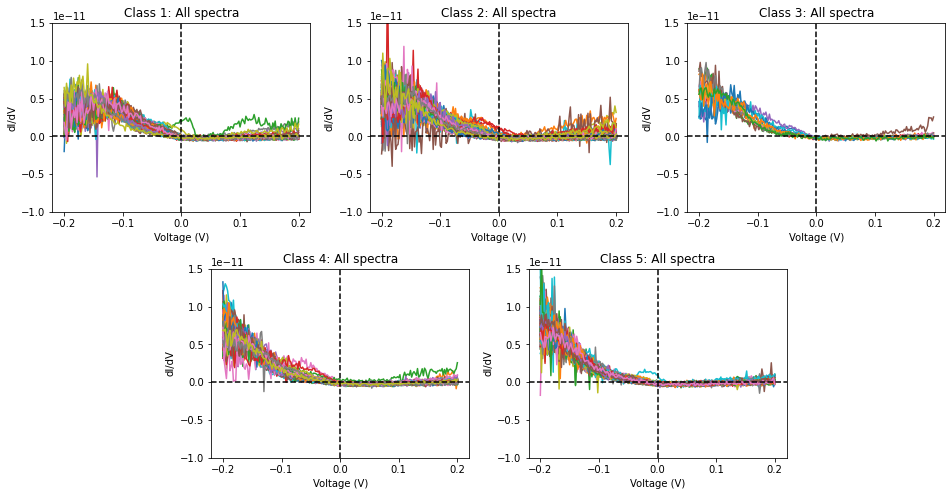

In [88]:
scalefactor = 4  # to go from 512 to 128 pixels

plt.figure(figsize = (16,8))

gs = gridspec.GridSpec(2,6, hspace = 0.3, wspace = 0.6)
ax1 = plt.subplot(gs[0,0:2])
ax2 = plt.subplot(gs[0,2:4])
ax3 = plt.subplot(gs[0,4:6])
ax4 = plt.subplot(gs[1,1:3])
ax5 = plt.subplot(gs[1,3:5])

for ii in range(blobclass1.shape[0]):
  ax1.plot(z_axis,exp_cits[int(round(com[blobclass1[ii],0]/scalefactor)),int(round(com[blobclass1[ii],1]/scalefactor)),:])
ax1.set_ylim(-1E-11,1.5E-11)
ax1.axvline(0,c='k',ls='--')
ax1.axhline(0,c='k',ls='--')
ax1.set_title("Class 1: All spectra")
ax1.set_xlabel('Voltage (V)')
ax1.set_ylabel('dI/dV')

for ii in range(blobclass2.shape[0]):
  ax2.plot(z_axis,exp_cits[int(round(com[blobclass2[ii],0]/scalefactor)),int(round(com[blobclass2[ii],1]/scalefactor)),:])
ax2.set_ylim(-1E-11,1.5E-11)
ax2.axvline(0,c='k',ls='--')
ax2.axhline(0,c='k',ls='--')
ax2.set_title("Class 2: All spectra")
ax2.set_xlabel('Voltage (V)')
ax2.set_ylabel('dI/dV')

for ii in range(blobclass3.shape[0]):
  ax3.plot(z_axis,exp_cits[int(round(com[blobclass3[ii],0]/scalefactor)),int(round(com[blobclass3[ii],1]/scalefactor)),:])
ax3.set_ylim(-1E-11,1.5E-11)
ax3.axvline(0,c='k',ls='--')
ax3.axhline(0,c='k',ls='--')
ax3.set_title("Class 3: All spectra")
ax3.set_xlabel('Voltage (V)')
ax3.set_ylabel('dI/dV')

for ii in range(blobclass4.shape[0]):
  ax4.plot(z_axis,exp_cits[int(round(com[blobclass4[ii],0]/scalefactor)),int(round(com[blobclass4[ii],1]/scalefactor)),:])
ax4.set_ylim(-1E-11,1.5E-11)
ax4.axvline(0,c='k',ls='--')
ax4.axhline(0,c='k',ls='--')
ax4.set_title("Class 4: All spectra")
ax4.set_xlabel('Voltage (V)')
ax4.set_ylabel('dI/dV')

for ii in range(blobclass5.shape[0]):
  ax5.plot(z_axis,exp_cits[int(round(com[blobclass5[ii],0]/scalefactor)),int(round(com[blobclass5[ii],1]/scalefactor)),:])
ax5.set_ylim(-1E-11,1.5E-11)
ax5.axvline(0,c='k',ls='--')
ax5.axhline(0,c='k',ls='--')
ax5.set_title("Class 5: All spectra");
ax5.set_xlabel('Voltage (V)')
ax5.set_ylabel('dI/dV')

In [89]:
class1all = np.zeros((blobclass1.shape[0],exp_cits.shape[2]))
for ii in range(blobclass1.shape[0]):
  class1all[ii] = exp_cits[int(round(com[blobclass1[ii],0]/scalefactor)),int(round(com[blobclass1[ii],1]/scalefactor)),:]
class1_mean = np.mean(class1all,axis=0)

class2all = np.zeros((blobclass2.shape[0],exp_cits.shape[2]))
for ii in range(blobclass2.shape[0]):
  class2all[ii] = exp_cits[int(round(com[blobclass2[ii],0]/scalefactor)),int(round(com[blobclass2[ii],1]/scalefactor)),:]
class2_mean = np.mean(class2all,axis=0)

class3all = np.zeros((blobclass3.shape[0],exp_cits.shape[2]))
for ii in range(blobclass3.shape[0]):
  class3all[ii] = exp_cits[int(round(com[blobclass3[ii],0]/scalefactor)),int(round(com[blobclass3[ii],1]/scalefactor)),:]
class3_mean = np.mean(class3all,axis=0)

class4all = np.zeros((blobclass4.shape[0],exp_cits.shape[2]))
for ii in range(blobclass4.shape[0]):
  class4all[ii] = exp_cits[int(round(com[blobclass4[ii],0]/scalefactor)),int(round(com[blobclass4[ii],1]/scalefactor)),:]
class4_mean = np.mean(class4all,axis=0)

class5all = np.zeros((blobclass5.shape[0],exp_cits.shape[2]))
for ii in range(blobclass5.shape[0]):
  class5all[ii] = exp_cits[int(round(com[blobclass5[ii],0]/scalefactor)),int(round(com[blobclass5[ii],1]/scalefactor)),:]
class5_mean = np.mean(class5all,axis=0)

In [91]:
class_mean1 = np.zeros((5,201))
class_mean1[0] = class1_mean
class_mean1[1] = class2_mean
class_mean1[2] = class3_mean
class_mean1[3] = class4_mean
class_mean1[4] = class5_mean

class1_stdev = np.std(class1all,axis=0)
class2_stdev = np.std(class2all,axis=0)
class3_stdev = np.std(class3all,axis=0)
class4_stdev = np.std(class4all,axis=0)
class5_stdev = np.std(class5all,axis=0)

class1_err = class1_stdev/(blobclass1.shape[0]**0.5)
class2_err = class2_stdev/(blobclass2.shape[0]**0.5)
class3_err = class3_stdev/(blobclass3.shape[0]**0.5)
class4_err = class4_stdev/(blobclass4.shape[0]**0.5)
class5_err = class5_stdev/(blobclass5.shape[0]**0.5)

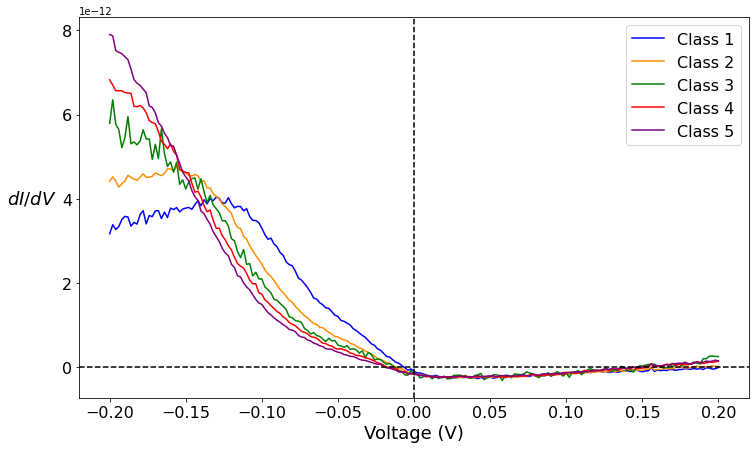

In [93]:
plt.figure(figsize=(12,7))
plt.plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
plt.plot(z_axis,class2_mean, label = "Class 2", color = 'darkorange')
plt.plot(z_axis,class3_mean, label = "Class 3", color = 'green')
plt.plot(z_axis,class4_mean, label = "Class 4", color = 'red')
plt.plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')


plt.legend(fontsize = 16)
plt.xlabel('Voltage (V)', size = 18);
plt.ylabel('$dI/dV$', size = 18, rotation = 0, labelpad = 30);
plt.tick_params(labelsize = 16)

[]

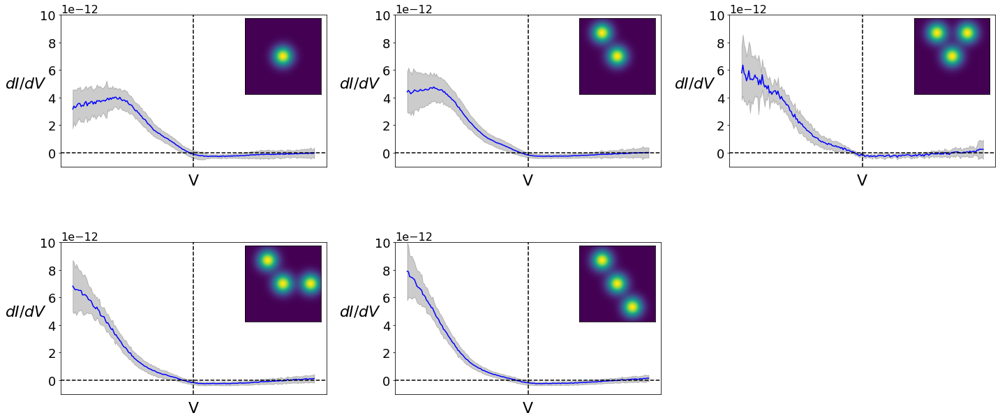

In [95]:
plt.figure(figsize = (24,10))
gs = gridspec.GridSpec(2,6,hspace = 0.5, wspace = 0.7)
ax1 = plt.subplot(gs[0,0:2])
ax2 = plt.subplot(gs[0,2:4])
ax3 = plt.subplot(gs[0,4:6])
ax4 = plt.subplot(gs[1,0:2])
ax5 = plt.subplot(gs[1,2:4])

ax1.plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
ax1.fill_between(z_axis, class1_mean-class1_stdev, class1_mean+class1_stdev, color = 'k', alpha = 0.2)
ax2.plot(z_axis,class2_mean, label = "Class 2", color = 'blue')
ax2.fill_between(z_axis, class2_mean-class2_stdev, class2_mean+class2_stdev, color = 'k', alpha = 0.2)
ax3.plot(z_axis,class3_mean, label = "Class 3", color = 'blue')
ax3.fill_between(z_axis, class3_mean-class3_stdev, class3_mean+class3_stdev, color = 'k', alpha = 0.2)
ax4.plot(z_axis,class4_mean, label = "Class 4", color = 'blue')
ax4.fill_between(z_axis, class4_mean-class4_stdev, class4_mean+class4_stdev, color = 'k', alpha = 0.2)
ax5.plot(z_axis,class5_mean, label = "Class 5", color = 'blue')
ax5.fill_between(z_axis, class5_mean-class5_stdev, class5_mean+class5_stdev, color = 'k', alpha = 0.2)

axs = [ax1,ax2,ax3,ax4,ax5]
ylim1, ylim2 = -0.1E-11,1E-11
for ii in range(len(axs)):
  axs[ii].set_xlabel('V', size = 22, labelpad = 10)
  axs[ii].set_ylabel('$dI/dV$', size = 22, rotation = 0, labelpad = 20)
  axs[ii].axhline(0, ls = '--', c='k')
  axs[ii].axvline(0, ls = '--', c='k')
  axs[ii].set_ylim(ylim1, ylim2)
  axs[ii].tick_params(labelsize = 18)
  axs[ii].yaxis.get_offset_text().set(size=16)


inset1 = inset_axes(ax1, width ='50%', height = '50%', bbox_to_anchor = (0.1, 0, 1, 1), bbox_transform = ax1.transAxes)
inset2 = inset_axes(ax2, width ='50%', height = '50%', bbox_to_anchor = (0.1, 0, 1, 1), bbox_transform = ax2.transAxes)
inset3 = inset_axes(ax3, width ='50%', height = '50%', bbox_to_anchor = (0.1, 0, 1, 1), bbox_transform = ax3.transAxes)
inset4 = inset_axes(ax4, width ='50%', height = '50%', bbox_to_anchor = (0.1, 0, 1, 1), bbox_transform = ax4.transAxes)
inset5 = inset_axes(ax5, width ='50%', height = '50%', bbox_to_anchor = (0.1, 0, 1, 1), bbox_transform = ax5.transAxes)

try:
  inset1.imshow(atom0)
  inset2.imshow(atom0 + atom1)
  inset3.imshow(atom0 + atom1 + atom2)
  inset4.imshow(atom0 + atom1 + atom3)
  inset5.imshow(atom0 + atom1 + atom4)
except NameError:
  inset1.imshow(class1_dict[1])
  inset2.imshow(class2_dict[1])
  inset3.imshow(class3_dict[1])
  inset4.imshow(class4_dict[1])
  inset5.imshow(class5_dict[1])
  
plt.setp([inset1, inset2, inset3, inset4, inset5],xticks=[],yticks=[])


plt.setp([axs], xticks=[])

# Spectral Classification
* **Further** subclassify
* additional analysis that surpasses our initial expectations regarding the existence of 5 distinct classes. 
* It appears there is more to the story within some classes. 
* Let's check this out, starting with class 1 (there seems to be the most variability there)

      --- Process ---
        1. Mask all classes but the one of interest (i.e., set all pixels to   
           zero except those belonging to the class we are deconvolving)
        2. Carry the masking to the spectral (3rd) dimension.
        3. Perform PCA on the <u>masked</u> hyperspectral data, such that we
           only decompose one structural class at a time

## Class 1

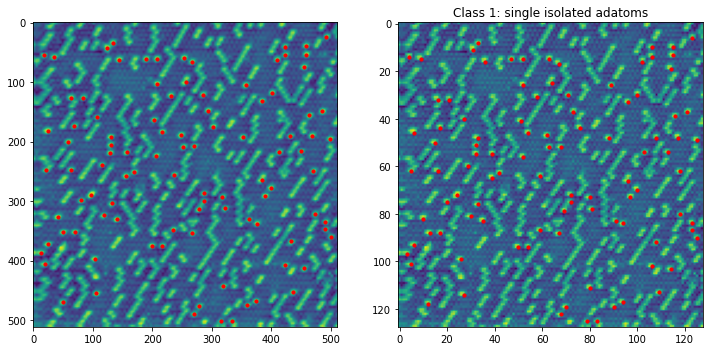

In [96]:
# get the coordinates from the center of masses for a class. Class 1 first:
class1positions = []

for ii in range(blobclass1.shape[0]):
  class1positions.append((int(round(com[blobclass1[ii],1])),int(round(com[blobclass1[ii],0]))))

# Plot to make sure correct
f,a = plt.subplots(1,2,figsize=(12,6))

for ii in range(len(class1positions)):
  a[0].scatter(class1positions[ii][0], class1positions[ii][1], color = 'r', s = 10)
a[0].imshow(resize(topo_f_n,(512,512)))

a[1].imshow(topo_f_n)
for ii in range(blobclass1.shape[0]):
  a[1].scatter(int(round(com[blobclass1[ii],1]/4)), int(round(com[blobclass1[ii],0]/4)), color = 'r', s = 10)
a[1].set_title('Class 1: single isolated adatoms');

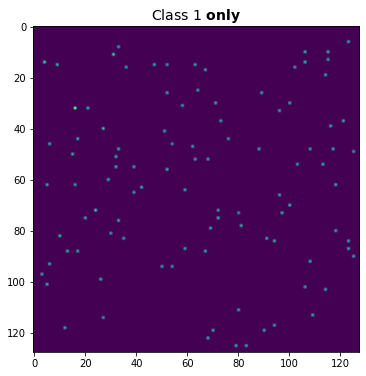

In [97]:
## Generate array from the (x,y) pairs
Mask1 = np.zeros_like(topo_f_n)
for ii in range(len(class1positions)):
    # Mask1[int(class1positions[ii][0]),int(class1positions[ii][1])] = 1
    Mask1[int(round(com[blobclass1[ii],0]/4)),int(round(com[blobclass1[ii],1]/4))] = 1

## Make sure mask array is correct
# f,a = plt.subplots(1,2,figsize=(14,7))
# a[0].imshow(Mask1,alpha=0.8,cmap='gray_r')
# a[0].imshow(topo_f_n,alpha=0.5)
# a[1].imshow(topo_f_n)

## Mask the SPECTRAL data using the Mask1 array
test1 = np.tile(Mask1, (201,1,1))
test1_ = np.swapaxes(np.swapaxes(test1,0,1), 1,2)
# test1_.shape
class1_masked = test1_*exp_cits

# Flatten this to feed to PCA 
XY = class1_masked.shape[:2]
class1_masked_flat=class1_masked.reshape((np.prod(XY),class1_masked.shape[2]))
# class1_masked_flat.shape

# Show it
plt.figure(figsize=(6,6))
plt.imshow(np.mean(class1_masked[:,:,:],axis=2))
plt.title(r'Class 1 $\bfonly$',fontsize=14);

(128, 128, 201)


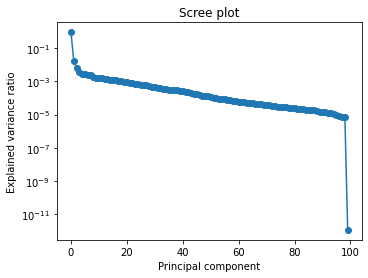

In [98]:
# Apply PCA to class 1

fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()
pca.fit(class1_masked_flat)
explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

print(class1_masked.shape)
w, h, n = class1_masked.shape

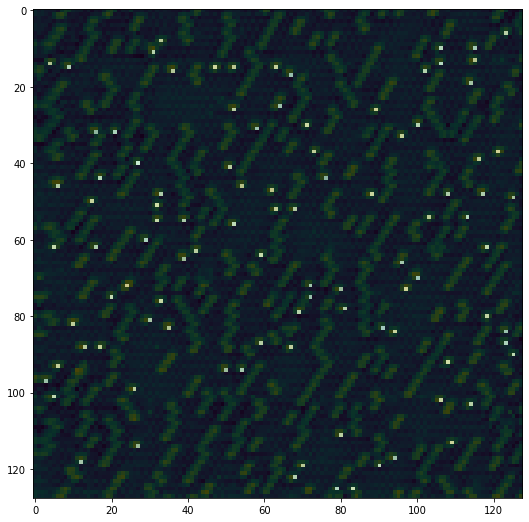

In [101]:
nc = 2
clf = PCA(n_components=nc)
X_vec_t = clf.fit_transform(class1_masked_flat)
components = clf.components_
X_vec_t = X_vec_t.reshape(w, h, nc)

plt.figure(figsize=(9,9))
plt.imshow(topo_f_n)
plt.imshow(X_vec_t[:,:,0], cmap = 'gray', alpha = 0.7)

<font size = 6>`Use second PCA component as secondary class (the thresholding component):`</font>

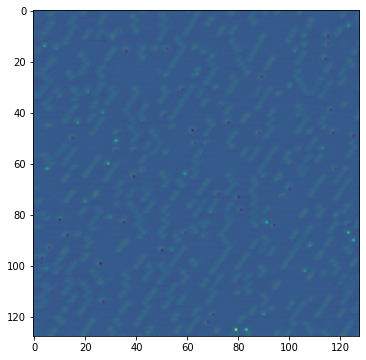

In [102]:
Class1_PCA0 = X_vec_t[:,:,0]
Class1_PCA1 = X_vec_t[:,:,1]

#normalize [0,1]
Class1_PCA0_n = (Class1_PCA0 - np.min(Class1_PCA0))/np.ptp(Class1_PCA0)
Class1_PCA1_n = (Class1_PCA1 - np.min(Class1_PCA1))/np.ptp(Class1_PCA1)

plt.figure(figsize=(6,6))
plt.imshow(topo_f_n)
plt.imshow(Class1_PCA1_n, vmin = 0, alpha = 0.9)

(0.0, 1.0)

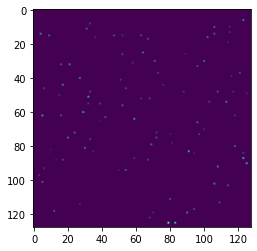

In [103]:
Class1_PCA1_n_masked = Mask1*Class1_PCA1_n

plt.figure(figsize=(4,4))
plt.imshow(Class1_PCA1_n_masked)
np.min(Class1_PCA1_n_masked), np.max(Class1_PCA1_n_masked)

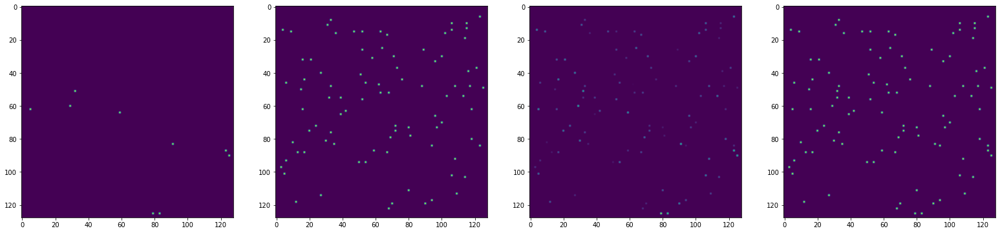

In [104]:
thresh1 = 0.5
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class1_PCA1_n_c = np.copy(Class1_PCA1_n_masked)
Class1_PCA1_n_c[np.where(Class1_PCA1_n_c >= thresh1)] = 1
Class1_PCA1_n_c[np.where(Class1_PCA1_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class1_PCA1_b = Class1_PCA1_n_masked - Class1_PCA1_n_c
Class1_PCA1_b[np.where(Class1_PCA1_b >= thresh2)] = 1
Class1_PCA1_b[np.where(Class1_PCA1_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class1_PCA1_n_c)
a[1].imshow(Class1_PCA1_b)
a[2].imshow(Class1_PCA1_n_masked)
a[3].imshow(Class1_PCA1_n_c + Class1_PCA1_b)

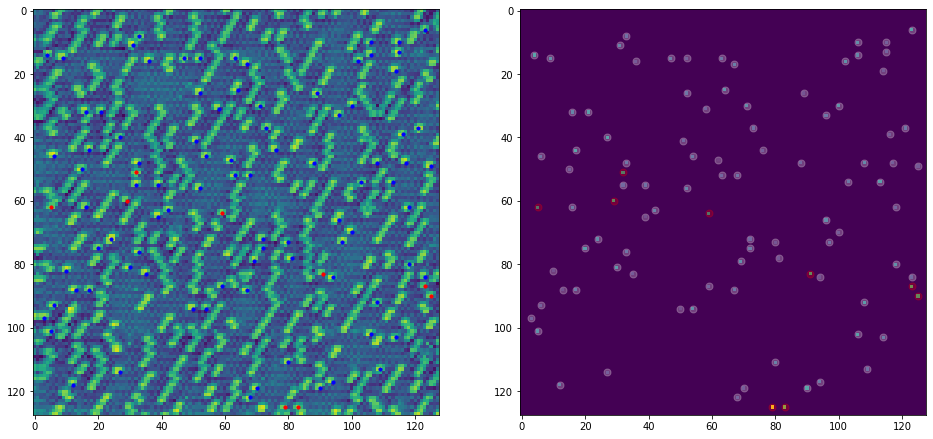

In [105]:
# Separated Class 1 into two categories: strong PCA1 above 50% intensity in that component (a), and the rest (b)

Class1_PCA1_coords_a = np.argwhere(Class1_PCA1_n_c == 1)
Class1_PCA1_coords_b = np.argwhere(Class1_PCA1_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class1_PCA1_coords_a.shape[0]):
  a[0].scatter(Class1_PCA1_coords_a[ii][1], Class1_PCA1_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class1_PCA1_coords_b.shape[0]): 
  a[0].scatter(Class1_PCA1_coords_b[ii][1], Class1_PCA1_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class1_PCA1_n_masked)
for ii in range(Class1_PCA1_coords_a.shape[0]):
  a[1].scatter(Class1_PCA1_coords_a[ii][1], Class1_PCA1_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class1_PCA1_coords_b.shape[0]): 
  a[1].scatter(Class1_PCA1_coords_b[ii][1], Class1_PCA1_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

In [106]:
Class1_PCA1_coords_a.shape, Class1_PCA1_coords_b.shape

((9, 2), (89, 2))

In [ ]:
# thresh1 = 0.5

# Class1_PCA1_n_c = np.copy(Class1_PCA1_n_masked)
# Class1_PCA1_n_c[np.where(Class1_PCA1_n_c >= thresh1)] = 1
# Class1_PCA1_n_c[np.where(Class1_PCA1_n_c < thresh1)] = 0

# f,a = plt.subplots(2,2,figsize=(14,14))
# a[0,0].imshow(Class1_PCA1_n_c)
# a[0,1].imshow(Class1_PCA1_n_masked)
# a[1,0].imshow(topo_f_n)
# a[1,1].imshow(topo_f_n,alpha = 0.00001)

# for ii in range(blobclass1.shape[0]):
#   a[1,0].scatter(int(round(com[blobclass1[ii],1]/4)), int(round(com[blobclass1[ii],0]/4)), color = 'r', s = 10, alpha = 1)
#   a[1,1].scatter(int(round(com[blobclass1[ii],1]/4)), int(round(com[blobclass1[ii],0]/4)), color = 'r', s = 10, alpha = 1)
# # a[1,0].imshow(Class1_PCA1_n_c, alpha = 0.6, cmap = 'seismic')

# for ii in range(Class1_PCA1_coords.shape[0]):
#   a[1,1].scatter(Class1_PCA1_coords[ii][1], Class1_PCA1_coords[ii][0], color = 'g', s = 50, alpha = 0.5)


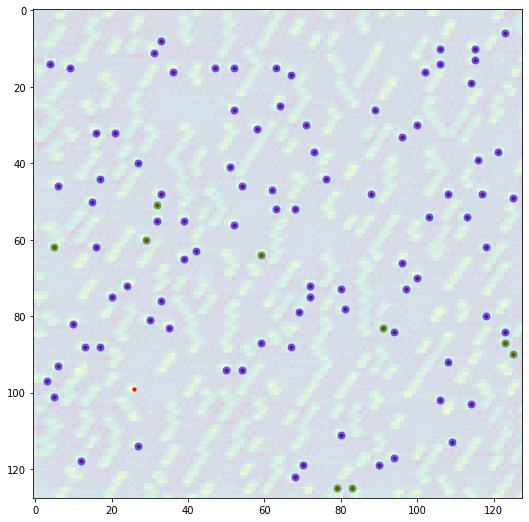

In [107]:
plt.figure(figsize=(9,9))
plt.imshow(topo_f_n,alpha = 0.2)
for ii in range(blobclass1.shape[0]):
 plt.scatter(int(round(com[blobclass1[ii],1]/4)), int(round(com[blobclass1[ii],0]/4)), color = 'r', s = 10, alpha = 1)

for ii in range(Class1_PCA1_coords_a.shape[0]):
  plt.scatter(Class1_PCA1_coords_a[ii][1], Class1_PCA1_coords_a[ii][0], color = 'g', s = 50, alpha = 0.5)

  
for ii in range(Class1_PCA1_coords_b.shape[0]):
  plt.scatter(Class1_PCA1_coords_b[ii][1], Class1_PCA1_coords_b[ii][0], color = 'b', s = 50, alpha = 0.5)

In [ ]:
### Get the positions of these

# I think the blob detection is WRONG here, because it may (and it does) detect different pixels than 
# were originally within class 1.

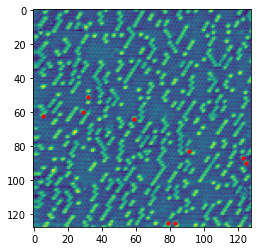

In [108]:
Class1_PCA1_coords = np.argwhere(Class1_PCA1_n_c == 1)

plt.imshow(topo_f_n)
for ii in range(Class1_PCA1_coords.shape[0]):
  plt.scatter(Class1_PCA1_coords[ii][1], Class1_PCA1_coords[ii][0], color = 'r', s = 10)

In [109]:
scalefactor = 1

class1_pca1 = np.zeros((Class1_PCA1_coords.shape[0],exp_cits.shape[2]))
for ii in range(Class1_PCA1_coords.shape[0]):
  class1_pca1[ii] = exp_cits[int(Class1_PCA1_coords[ii][0]/scalefactor),int(Class1_PCA1_coords[ii][1]/scalefactor),:]
class1_pca1_mean = np.mean(class1_pca1,axis=0)

In [110]:
thresh2 = 0.001

Class1_PCA0_n_masked = Mask1*Class1_PCA0_n

Class1_PCA0_b = Class1_PCA0_n_masked - Class1_PCA0_n_c
Class1_PCA0_b[np.where(Class1_PCA1_b >= thresh2)] = 1
Class1_PCA0_b[np.where(Class1_PCA1_b < thresh2)] = 0

Class1_PCA0_coords_a = np.argwhere(Class1_PCA0_n_c == 1)
Class1_PCA0_coords_b = np.argwhere(Class1_PCA0_b == 1)

NameError: ignored

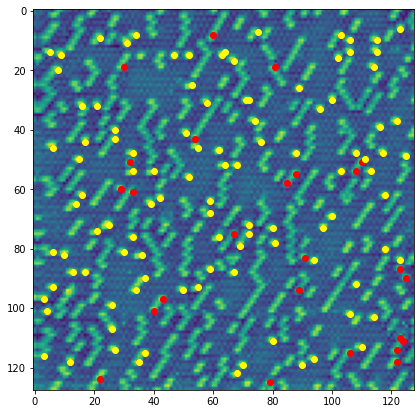

In [ ]:
plt.figure(figsize=(7,7))
plt.imshow(topo_f_n)
plt.scatter(Class1_PCA0_coords_a[:,1], Class1_PCA0_coords_a[:,0], c='r')
plt.scatter(Class1_PCA0_coords_b[:,1], Class1_PCA0_coords_b[:,0], c='yellow')

In [ ]:
Class1_PCA0_coords = np.argwhere(Class1_PCA0_n_c == 1)
class1_pca0 = np.zeros((Class1_PCA0_coords.shape[0],exp_cits.shape[2]))
for ii in range(Class1_PCA0_coords.shape[0]):
  class1_pca0[ii] = exp_cits[int(Class1_PCA0_coords[ii][0]/scalefactor),int(Class1_PCA0_coords[ii][1]/scalefactor),:]
class1_pca0_mean = np.mean(class1_pca0,axis=0)


# into a and b

class1_pca0_a = np.zeros((Class1_PCA0_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class1_PCA0_coords_a.shape[0]):
  class1_pca0_a[ii] = exp_cits[int(Class1_PCA0_coords_a[ii][0]/scalefactor),int(Class1_PCA0_coords_a[ii][1]/scalefactor),:]
class1_pca0_a_mean = np.mean(class1_pca0_a,axis=0)

class1_pca0_b = np.zeros((Class1_PCA0_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class1_PCA0_coords_b.shape[0]):
  class1_pca0_b[ii] = exp_cits[int(Class1_PCA0_coords_b[ii][0]/scalefactor),int(Class1_PCA0_coords_b[ii][1]/scalefactor),:]
class1_pca0_b_mean = np.mean(class1_pca0_b,axis=0)

In [111]:
scalefactor = 1

class1_pca1_a = np.zeros((Class1_PCA1_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class1_PCA1_coords_a.shape[0]):
  class1_pca1_a[ii] = exp_cits[int(Class1_PCA1_coords_a[ii][0]/scalefactor),int(Class1_PCA1_coords_a[ii][1]/scalefactor),:]
class1_pca1_a_mean = np.mean(class1_pca1_a,axis=0)

class1_pca1_b = np.zeros((Class1_PCA1_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class1_PCA1_coords_b.shape[0]):
  class1_pca1_b[ii] = exp_cits[int(Class1_PCA1_coords_b[ii][0]/scalefactor),int(Class1_PCA1_coords_b[ii][1]/scalefactor),:]
class1_pca1_b_mean = np.mean(class1_pca1_b,axis=0)

* Get the standard deviation for a kind of error bar measurement

In [112]:
class1_pca1_a_stdev = np.std(class1_pca1_a,axis=0)
class1_pca1_b_stdev = np.std(class1_pca1_b,axis=0)

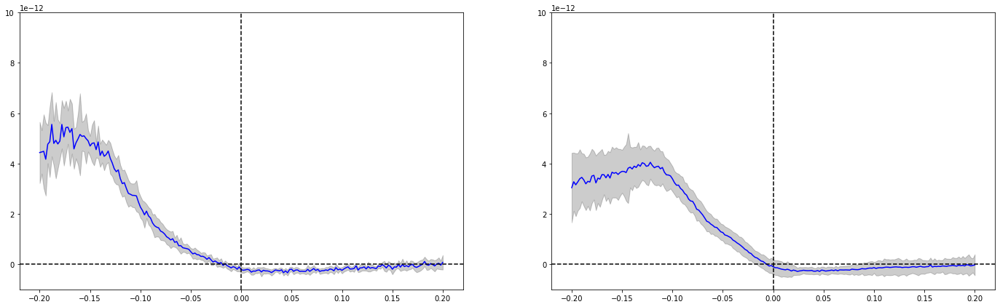

In [113]:
f,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis, class1_pca1_a_mean, color = 'blue')
# plt.errorbar(z_axis, class1_pca1_mean, yerr = class1_pca1_stdev, ecolor = 'k', errorevery = 20, capsize = 5)
a[0].fill_between(z_axis, class1_pca1_a_mean - class1_pca1_a_stdev, class1_pca1_a_mean+class1_pca1_a_stdev, alpha = 0.2, color = 'k')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].set_ylim(-0.1E-11,1E-11);

a[1].plot(z_axis, class1_pca1_b_mean, color = 'blue')
a[1].fill_between(z_axis, class1_pca1_b_mean - class1_pca1_b_stdev, class1_pca1_b_mean+class1_pca1_b_stdev, alpha = 0.2, color = 'k')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')
a[1].set_ylim(-0.1E-11,1E-11);

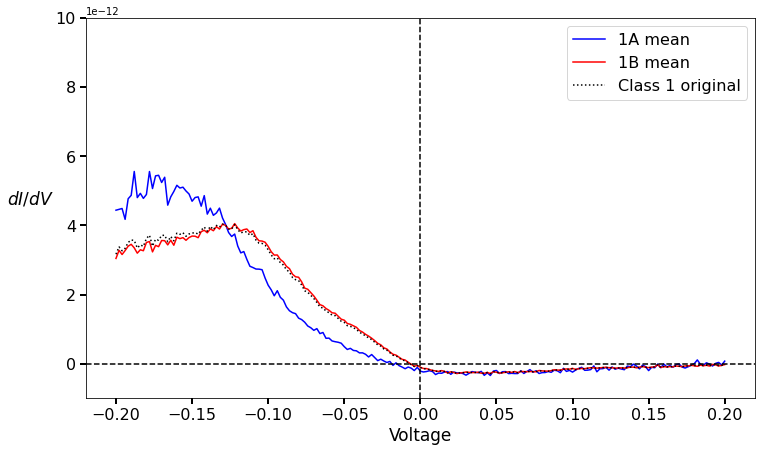

In [114]:
plt.figure(figsize=(12,7))
plt.plot(z_axis, class1_pca1_a_mean, color = 'blue', label = '1A mean')
plt.plot(z_axis, class1_pca1_b_mean, color = 'r', label = '1B mean')
plt.plot(z_axis, class1_mean, color = 'k', ls = ':', label = 'Class 1 original')
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')

plt.ylim(-0.1E-11,1E-11);

plt.tick_params(labelsize = 16, width = 2, length = 6)
plt.xlabel('Voltage', fontsize = 17)
plt.ylabel('$dI/dV$', fontsize = 17, rotation = 0, labelpad = 25)

plt.legend(fontsize = 16)

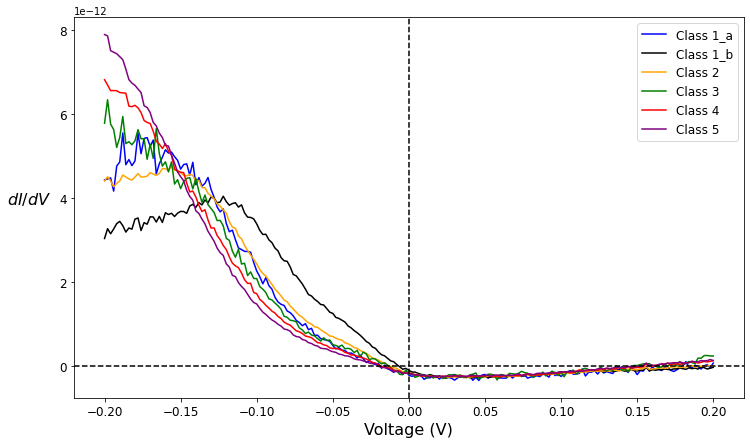

In [115]:
plt.figure(figsize=(12,7))
plt.plot(z_axis,class1_pca1_a_mean, label = "Class 1_a", color = 'blue')
plt.plot(z_axis,class1_pca1_b_mean, label = "Class 1_b", color = 'k')
plt.plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
plt.plot(z_axis,class3_mean, label = "Class 3", color = 'green')
plt.plot(z_axis,class4_mean, label = "Class 4", color = 'red')
plt.plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')
plt.legend(fontsize = 12)

plt.xlabel('Voltage (V)', size = 16);
plt.ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
plt.tick_params(axis='both', labelsize = 12)

# plt.fill_between(z_axis, class1_mean-class1_stdev, class1_mean+class1_stdev, color = 'blue', alpha = 0.2)
# plt.fill_between(z_axis, class2_mean-class2_stdev, class2_mean+class2_stdev, color = 'orange', alpha = 0.2)
# plt.fill_between(z_axis, class3_mean-class3_stdev, class3_mean+class3_stdev, color = 'green', alpha = 0.2)
# plt.fill_between(z_axis, class4_mean-class4_stdev, class4_mean+class4_stdev, color = 'red', alpha = 0.2)
# plt.fill_between(z_axis, class5_mean-class5_stdev, class5_mean+class5_stdev, color = 'purple', alpha = 0.2)

* Are they structurally different? Let's look in real space:

In [118]:
crs = 6 # size of image to crop
imgstack_2a, com2a = extract_subimages(topo_f_n, Class1_PCA1_coords_a, crs)
imgstack_2b, com2b = extract_subimages(topo_f_n, Class1_PCA1_coords_b, crs)

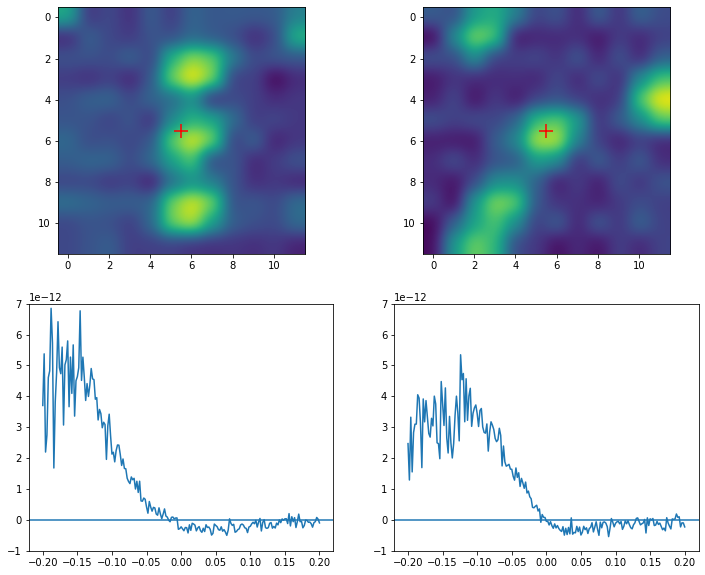

In [129]:
k1 = 0 # 14
k2 = 25

f,a = plt.subplots(2,2,figsize=(12,10))
a[0,0].imshow(imgstack_2a[k1], interpolation = 'gaussian')
a[0,1].imshow(imgstack_2b[k2], interpolation = 'gaussian')
a[0,0].scatter(int(imgstack_2a.shape[2]/2)-0.5, int(imgstack_2a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)
a[0,1].scatter(int(imgstack_2a.shape[2]/2)-0.5, int(imgstack_2a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)

a[1,0].plot(z_axis,exp_cits[int(round(com2a[k1,0])), int(round(com2a[k1,1])), :])
a[1,1].plot(z_axis,exp_cits[int(round(com2b[k2,0])), int(round(com2b[k2,1])), :])

a[1,0].set_ylim(-1E-12, 7E-12)
a[1,1].set_ylim(-1E-12, 7E-12)

a[1,0].axhline(0)
a[1,1].axhline(0)

Yes, it looks like Class 1a is actually NOT single isolated atoms. So misclassified. 
* Class 1b DOES appear OK

## Class 2

In [130]:
print("The greatest number of atoms exist in class 2: {}".format(blobclass2.shape[0]))
print("Let's see if there is any further classification to be done on the largest class")

The greatest number of atoms exist in class 2: 319
Let's see if there is any further classification to be done on the largest class


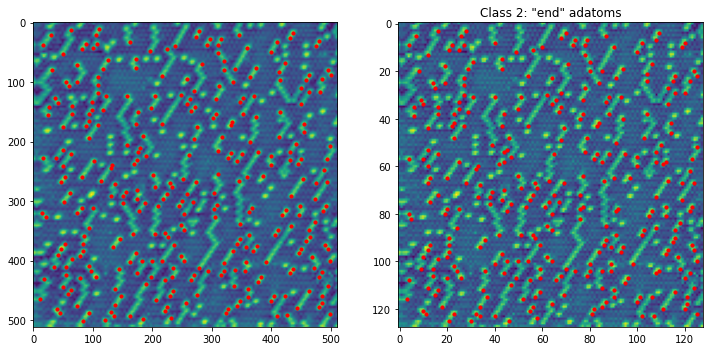

In [131]:
class2positions = []

for ii in range(blobclass2.shape[0]):
  class2positions.append((int(round(com[blobclass2[ii],1])),int(round(com[blobclass2[ii],0]))))


f,a = plt.subplots(1,2,figsize=(12,6))

for ii in range(len(class2positions)):
  a[0].scatter(class2positions[ii][0], class2positions[ii][1], color = 'r', s = 10)
a[0].imshow(resize(topo_f_n,(512,512)))

a[1].imshow(topo_f_n)
for ii in range(blobclass2.shape[0]):
  a[1].scatter(int(round(com[blobclass2[ii],1]/4)), int(round(com[blobclass2[ii],0]/4)), color = 'r', s = 10)
a[1].set_title('Class 2: "end" adatoms');

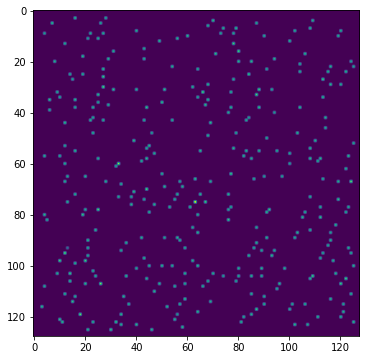

In [132]:
## Generate array from the (x,y) pairs
Mask2 = np.zeros_like(topo_f_n)
for ii in range(len(class2positions)):
    # Mask1[int(class1positions[ii][0]),int(class1positions[ii][1])] = 1
    Mask2[int(round(com[blobclass2[ii],0]/4)),int(round(com[blobclass2[ii],1]/4))] = 1

## Mask the SPECTRAL data using the Mask1 array
test2 = np.tile(Mask2, (201,1,1))
test2_ = np.swapaxes(np.swapaxes(test2,0,1), 1,2)
test2_.shape
class2_masked = test2_*exp_cits

# Flatten for PCA
XY2 = class2_masked.shape[:2]
class2_masked_flat=class2_masked.reshape((np.prod(XY2),class2_masked.shape[2]))

# Show
plt.figure(figsize=(6,6))
plt.imshow(np.mean(class2_masked[:,:,:],axis=2))

(128, 128, 201)


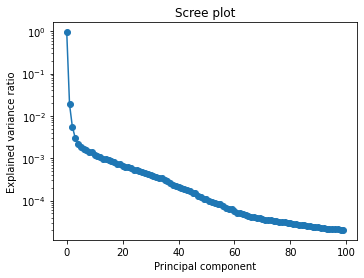

In [133]:
# PCA on class 2:

fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()
pca.fit(class2_masked_flat)
explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

print(class2_masked.shape)
w, h, n = class2_masked.shape

In [134]:
nc = 3
clf = PCA(n_components=nc)
X_vec_t = clf.fit_transform(class2_masked_flat)
components = clf.components_
X_vec_t = X_vec_t.reshape(w, h, nc)

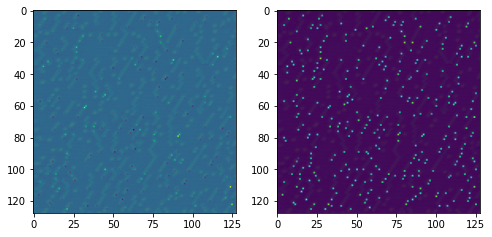

In [135]:
Class2_PCA0 = X_vec_t[:,:,0]
Class2_PCA1 = X_vec_t[:,:,1]

# normalize [0,1]
Class2_PCA0_n = (Class2_PCA0 - np.min(Class2_PCA0))/np.ptp(Class2_PCA0)
Class2_PCA1_n = (Class2_PCA1 - np.min(Class2_PCA1))/np.ptp(Class2_PCA1)

# plot
f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow(topo_f_n)
a[0].imshow(Class2_PCA1_n, vmin = 0, alpha = 0.9)

a[1].imshow(topo_f_n)
a[1].imshow(Class2_PCA0_n, vmin = 0, alpha = 0.9)

In [136]:
# The background should be zero (why is it not?? How can the PCA extrapolate? Seems like just some kind of offset to the background..)
# So, let's multiply these by the mask we generated earlier

(0.0, 1.0)

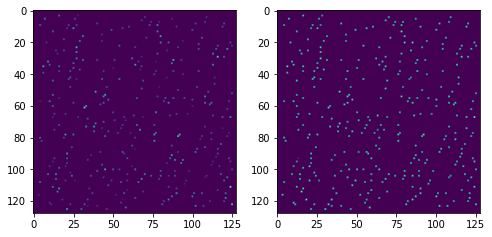

In [137]:
Class2_PCA1_n_masked = Mask2*Class2_PCA1_n
Class2_PCA0_n_masked = Class2_PCA0_n

f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow(Class2_PCA1_n_masked)
a[1].imshow(Class2_PCA0_n_masked)
np.min(Class2_PCA1_n_masked), np.max(Class2_PCA1_n_masked)

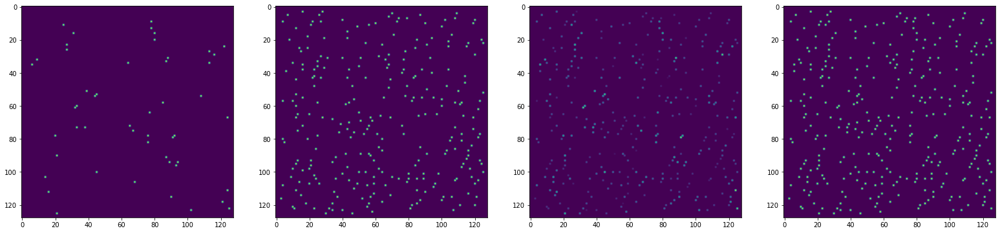

In [138]:
thresh1 = 0.5
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class2_PCA1_n_c = np.copy(Class2_PCA1_n_masked)
Class2_PCA1_n_c[np.where(Class2_PCA1_n_c >= thresh1)] = 1
Class2_PCA1_n_c[np.where(Class2_PCA1_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class2_PCA1_b = Class2_PCA1_n_masked - Class2_PCA1_n_c
Class2_PCA1_b[np.where(Class2_PCA1_b >= thresh2)] = 1
Class2_PCA1_b[np.where(Class2_PCA1_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class2_PCA1_n_c)
a[1].imshow(Class2_PCA1_b)
a[2].imshow(Class2_PCA1_n_masked)
a[3].imshow(Class2_PCA1_n_c + Class2_PCA1_b)

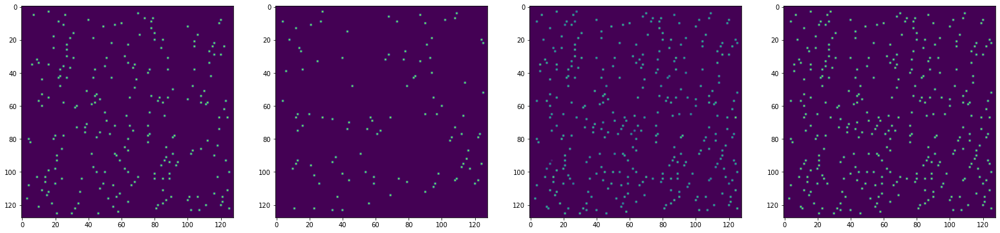

In [139]:
thresh1 = 0.75
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class2_PCA0_n_c = np.copy(Class2_PCA0_n_masked)
Class2_PCA0_n_c[np.where(Class2_PCA0_n_c >= thresh1)] = 1
Class2_PCA0_n_c[np.where(Class2_PCA0_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class2_PCA0_b = Class2_PCA0_n_masked - Class2_PCA0_n_c
Class2_PCA0_b[np.where(Class2_PCA0_b >= thresh2)] = 1
Class2_PCA0_b[np.where(Class2_PCA0_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class2_PCA0_n_c)
a[1].imshow(Class2_PCA0_b)
a[2].imshow(Class2_PCA0_n_masked)
a[3].imshow(Class2_PCA0_n_c + Class2_PCA0_b)

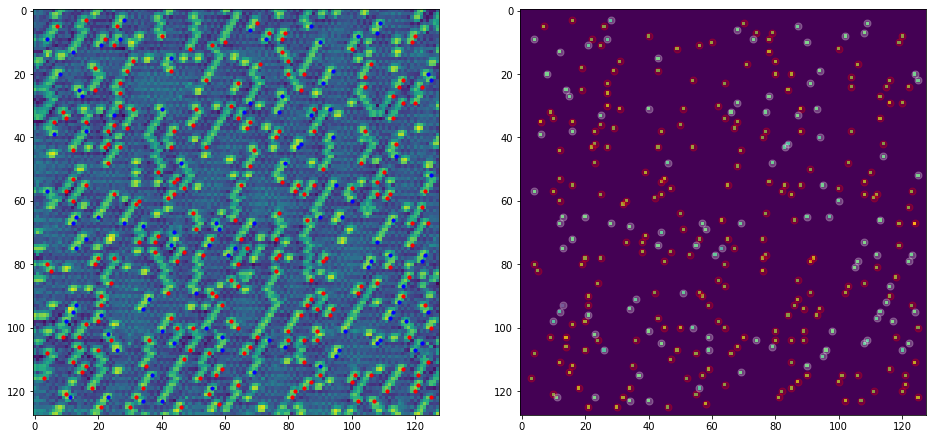

In [140]:
# Separated Class 2 into two categories: strong PCA0 above 75% intensity in that component (a), and the rest (b)

Class2_PCA0_coords_a = np.argwhere(Class2_PCA0_n_c == 1)
Class2_PCA0_coords_b = np.argwhere(Class2_PCA0_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class2_PCA0_coords_a.shape[0]):
  a[0].scatter(Class2_PCA0_coords_a[ii][1], Class2_PCA0_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class2_PCA0_coords_b.shape[0]): 
  a[0].scatter(Class2_PCA0_coords_b[ii][1], Class2_PCA0_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class2_PCA0_n_masked)
for ii in range(Class2_PCA0_coords_a.shape[0]):
  a[1].scatter(Class2_PCA0_coords_a[ii][1], Class2_PCA0_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class2_PCA0_coords_b.shape[0]): 
  a[1].scatter(Class2_PCA0_coords_b[ii][1], Class2_PCA0_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

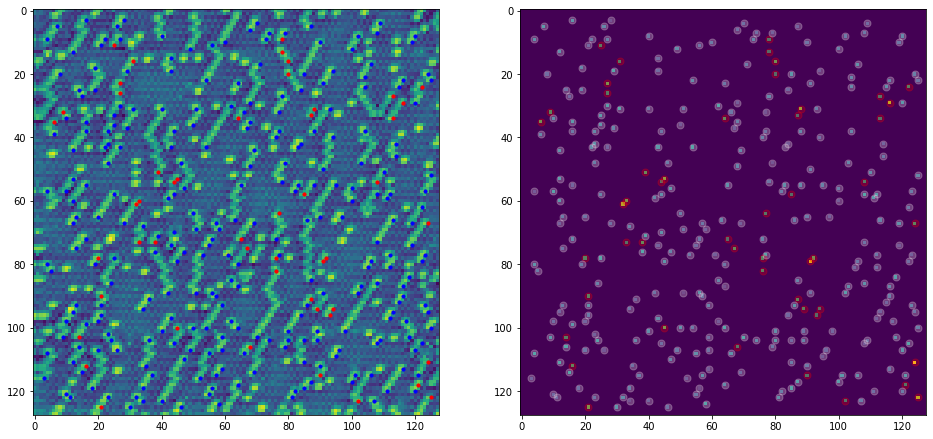

In [141]:
# Separated Class 2 into two categories: strong PCA1 above 50% intensity in that component (a), and the rest (b)

Class2_PCA1_coords_a = np.argwhere(Class2_PCA1_n_c == 1)
Class2_PCA1_coords_b = np.argwhere(Class2_PCA1_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class2_PCA1_coords_a.shape[0]):
  a[0].scatter(Class2_PCA1_coords_a[ii][1], Class2_PCA1_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class2_PCA1_coords_b.shape[0]): 
  a[0].scatter(Class2_PCA1_coords_b[ii][1], Class2_PCA1_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class2_PCA1_n_masked)
for ii in range(Class2_PCA1_coords_a.shape[0]):
  a[1].scatter(Class2_PCA1_coords_a[ii][1], Class2_PCA1_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class2_PCA1_coords_b.shape[0]): 
  a[1].scatter(Class2_PCA1_coords_b[ii][1], Class2_PCA1_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

In [142]:
print(Class2_PCA0_coords_a.shape, Class2_PCA0_coords_b.shape)  #75% threshold for PCA 0
print(Class2_PCA1_coords_a.shape, Class2_PCA1_coords_b.shape)  #50% threshold for PCA 1

(218, 2) (101, 2)
(50, 2) (268, 2)


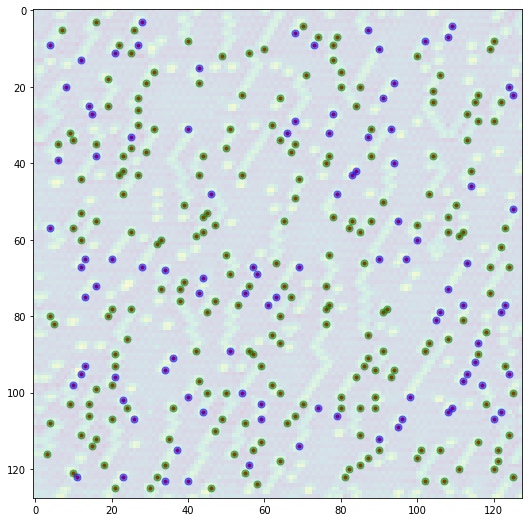

In [143]:
plt.figure(figsize=(9,9))
plt.imshow(topo_f_n,alpha = 0.2)
for ii in range(blobclass2.shape[0]):
 plt.scatter(int(round(com[blobclass2[ii],1]/4)), int(round(com[blobclass2[ii],0]/4)), color = 'r', s = 10, alpha = 1)

for ii in range(Class2_PCA0_coords_a.shape[0]):
  plt.scatter(Class2_PCA0_coords_a[ii][1], Class2_PCA0_coords_a[ii][0], color = 'g', s = 50, alpha = 0.5)

  
for ii in range(Class2_PCA0_coords_b.shape[0]):
  plt.scatter(Class2_PCA0_coords_b[ii][1], Class2_PCA0_coords_b[ii][0], color = 'b', s = 50, alpha = 0.5)

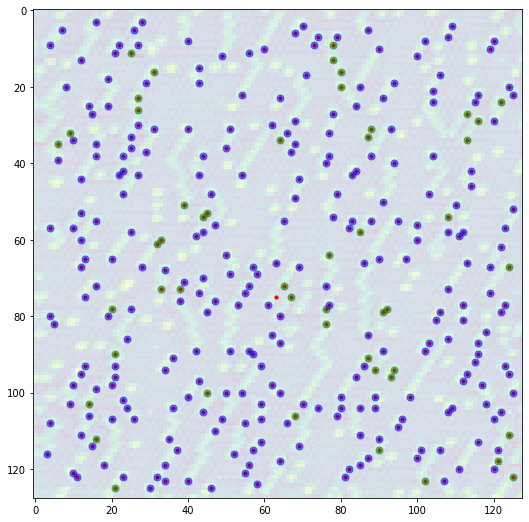

In [144]:
plt.figure(figsize=(9,9))
plt.imshow(topo_f_n,alpha = 0.2)
for ii in range(blobclass2.shape[0]):
 plt.scatter(int(round(com[blobclass2[ii],1]/4)), int(round(com[blobclass2[ii],0]/4)), color = 'r', s = 10, alpha = 1)

for ii in range(Class2_PCA1_coords_a.shape[0]):
  plt.scatter(Class2_PCA1_coords_a[ii][1], Class2_PCA1_coords_a[ii][0], color = 'g', s = 50, alpha = 0.5)

  
for ii in range(Class2_PCA1_coords_b.shape[0]):
  plt.scatter(Class2_PCA1_coords_b[ii][1], Class2_PCA1_coords_b[ii][0], color = 'b', s = 50, alpha = 0.5)

In [145]:
scalefactor = 1


## separated PCA 0

class2_pca0_a = np.zeros((Class2_PCA0_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class2_PCA0_coords_a.shape[0]):
  class2_pca0_a[ii] = exp_cits[int(Class2_PCA0_coords_a[ii][0]/scalefactor),int(Class2_PCA0_coords_a[ii][1]/scalefactor),:]
class2_pca0_a_mean = np.mean(class2_pca0_a,axis=0)

class2_pca0_b = np.zeros((Class2_PCA0_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class2_PCA0_coords_b.shape[0]):
  class2_pca0_b[ii] = exp_cits[int(Class2_PCA0_coords_b[ii][0]/scalefactor),int(Class2_PCA0_coords_b[ii][1]/scalefactor),:]
class2_pca0_b_mean = np.mean(class2_pca0_b,axis=0)

## separated PCA 1

class2_pca1_a = np.zeros((Class2_PCA1_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class2_PCA1_coords_a.shape[0]):
  class2_pca1_a[ii] = exp_cits[int(Class2_PCA1_coords_a[ii][0]/scalefactor),int(Class2_PCA1_coords_a[ii][1]/scalefactor),:]
class2_pca1_a_mean = np.mean(class2_pca1_a,axis=0)

class2_pca1_b = np.zeros((Class2_PCA1_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class2_PCA1_coords_b.shape[0]):
  class2_pca1_b[ii] = exp_cits[int(Class2_PCA1_coords_b[ii][0]/scalefactor),int(Class2_PCA1_coords_b[ii][1]/scalefactor),:]
class2_pca1_b_mean = np.mean(class2_pca1_b,axis=0)

* Get the standard deviation for a kind of error bar measurement

In [147]:
class2_pca0_a_stdev = np.std(class2_pca0_a,axis=0)
class2_pca0_b_stdev = np.std(class2_pca0_b,axis=0)

class2_pca1_a_stdev = np.std(class2_pca1_a,axis=0)
class2_pca1_b_stdev = np.std(class2_pca1_b,axis=0)

In [148]:
class2_pca0_b.shape

(101, 201)

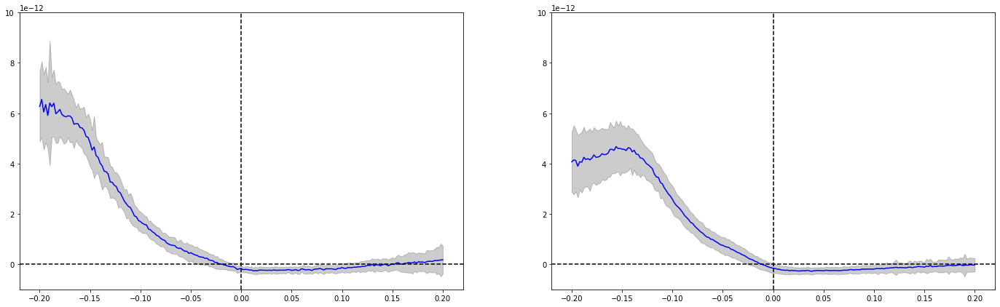

In [150]:
f,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis, class2_pca1_a_mean, color = 'blue')
a[0].fill_between(z_axis, class2_pca1_a_mean - class2_pca1_a_stdev, class2_pca1_a_mean+class2_pca1_a_stdev, alpha = 0.2, color = 'k')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].set_ylim(-0.1E-11,1E-11);

a[1].plot(z_axis, class2_pca1_b_mean, color = 'blue')
a[1].fill_between(z_axis, class2_pca1_b_mean - class2_pca1_b_stdev, class2_pca1_b_mean+class2_pca1_b_stdev, alpha = 0.2, color = 'k')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')
a[1].set_ylim(-0.1E-11,1E-11);

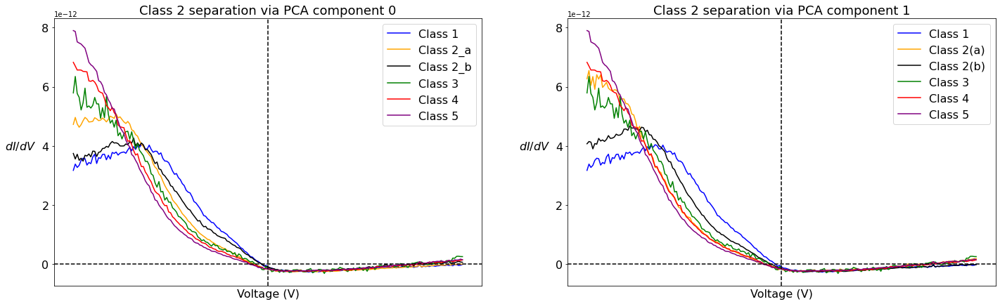

In [151]:
f,a = plt.subplots(1,2,figsize=(24,7))

a[0].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[0].plot(z_axis,class2_pca0_a_mean, label = "Class 2_a", color = 'orange')
a[0].plot(z_axis,class2_pca0_b_mean, label = "Class 2_b", color = 'k')
# plt.plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[0].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[0].plot(z_axis,class4_mean, label = "Class 4", color = 'red')
a[0].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].legend(fontsize = 12)

a[0].set_xlabel('Voltage (V)', size = 16);
a[0].set_ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
a[0].tick_params(axis='both', labelsize = 12)

a[1].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[1].plot(z_axis,class2_pca1_a_mean, label = "Class 2(a)", color = 'orange')
a[1].plot(z_axis,class2_pca1_b_mean, label = "Class 2(b)", color = 'k')
# plt.plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[1].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[1].plot(z_axis,class4_mean, label = "Class 4", color = 'red')
a[1].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')

a[0].legend(fontsize = 16)
a[1].legend(fontsize = 16)

a[1].set_xlabel('Voltage (V)', size = 16);
a[1].set_ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
a[1].tick_params(axis='both', labelsize = 12)

a[0].set_title("Class 2 separation via PCA component 0", fontsize = 18)
a[1].set_title("Class 2 separation via PCA component 1", fontsize = 18);

a[0].tick_params(labelsize=16)
a[1].tick_params(labelsize=16)

plt.setp([a[0],a[1]], xticks=[]);

* Separation using PCA component 0 seems to just shuffle potentially misclassified (structurally) misclassified atoms into already existing class.
* Note that in this plot (left), there are still essentially 5 spectra
* However, separation via PCA component 1 appears to show a new spectral feature, shown in black curve (Right)

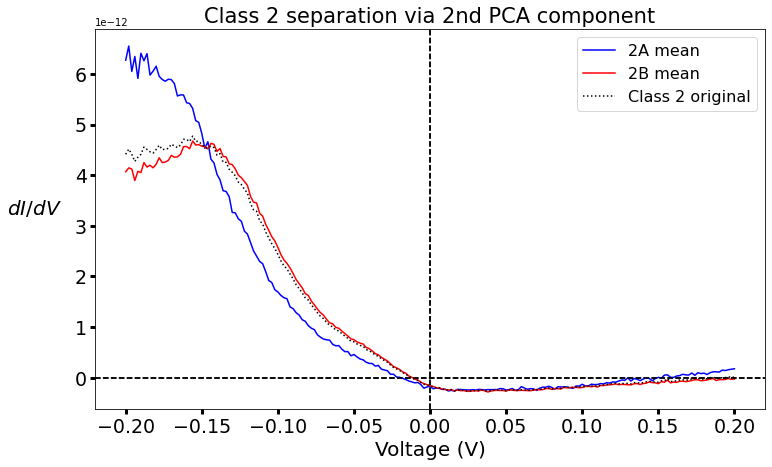

In [153]:
plt.figure(figsize=(12,7))
# plt.plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
# plt.plot(z_axis,class2_mean, label = "Class 2", color = 'darkorange')
# plt.plot(z_axis,class3_mean, label = "Class 3", color = 'green')
# plt.plot(z_axis,class4_mean, label = "Class 4", color = 'red')
# plt.plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')


plt.tick_params(labelsize = 16)

# plt.plot(z_axis,class1_mean, label = "Class 1", color = 'blue')

plt.plot(z_axis,class2_pca1_a_mean, label = "2A mean", color = 'blue')
plt.plot(z_axis,class2_pca1_b_mean, label = "2B mean", color = 'r')
plt.plot(z_axis,class2_mean, color = 'k', ls = ':', label = 'Class 2 original')

# plt.plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
# plt.plot(z_axis,class3_mean, label = "Class 3", color = 'green')
# plt.plot(z_axis,class4_mean, label = "Class 4", color = 'red')
# plt.plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')

plt.legend(fontsize = 16)
plt.legend(fontsize = 16)

plt.xlabel('Voltage (V)', size = 20);
plt.ylabel('$dI/dV$', size = 20, rotation = 0, labelpad = 40);
# plt.tick_params(axis='both', labelsize = 16)

plt.title("Class 2 separation via 2nd PCA component", fontsize = 21);

plt.tick_params(labelsize=19, width = 3, size = 5)
plt.tick_params(labelsize=19, width = 3, size = 5)


In [154]:
crs = 6 # size of image to crop

imgstack_2a, com2a = extract_subimages(topo_f_n, Class2_PCA1_coords_a, crs)

imgstack_2b, com2b = extract_subimages(topo_f_n, Class2_PCA1_coords_b, crs)

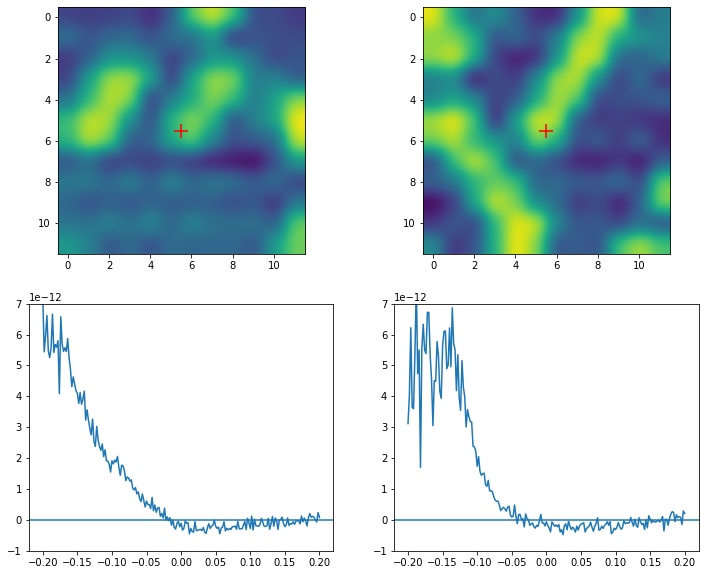

In [156]:
k1 = 1
k2 = 26

f,a = plt.subplots(2,2,figsize=(12,10))
a[0,0].imshow(imgstack_2a[k1], interpolation = 'gaussian')
a[0,1].imshow(imgstack_2b[k2], interpolation = 'gaussian')
a[0,0].scatter(int(imgstack_2a.shape[2]/2)-0.5, int(imgstack_2a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)
a[0,1].scatter(int(imgstack_2a.shape[2]/2)-0.5, int(imgstack_2a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)

a[1,0].plot(z_axis,exp_cits[int(round(com2a[k1,0])), int(round(com2a[k1,1])), :])
a[1,1].plot(z_axis,exp_cits[int(round(com2b[k2,0])), int(round(com2b[k2,1])), :])

a[1,0].set_ylim(-1E-12, 7E-12)
a[1,1].set_ylim(-1E-12, 7E-12)

a[1,0].axhline(0)
a[1,1].axhline(0)

* Let's ZOOM out from here... is it neighbor effect?

In [157]:
crs = 6 # size of image to crop

imgstack_2a_adatoms, comadatoms2a = extract_subimages(adatoms, Class2_PCA1_coords_a*4, crs*4)
imgstack_2b_adatoms, comadatoms2b = extract_subimages(adatoms, Class2_PCA1_coords_b*4, crs*4)

imgstack_2a_rawimage, comraw2a = extract_subimages(topo_f_n, Class2_PCA1_coords_a, crs)
imgstack_2b_rawimage, comraw2b = extract_subimages(topo_f_n, Class2_PCA1_coords_b, crs)

[]

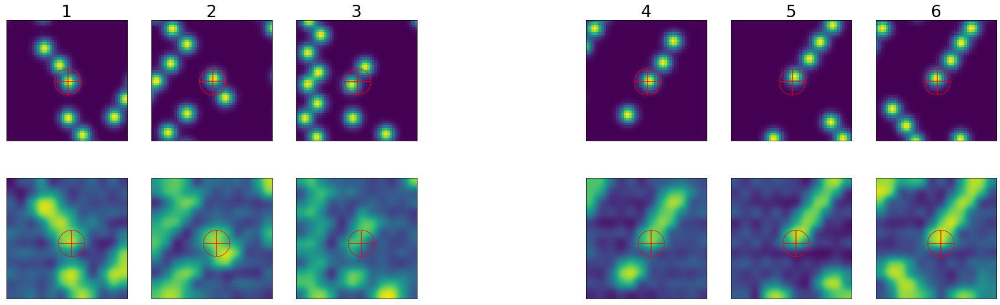

In [160]:
i1, i2, i3 = 4, 12, 32    ######### ORIGINALLY 7 was 28. But I like 7 better.
k1, k2, k3 = 31, 125, 233


plt.figure(figsize=(30,9))
gs = gridspec.GridSpec(2,7)
ax00 = plt.subplot(gs[0,0])
ax01 = plt.subplot(gs[0,1])
ax02 = plt.subplot(gs[0,2])
ax03 = plt.subplot(gs[0,4])
ax04 = plt.subplot(gs[0,5])
ax05 = plt.subplot(gs[0,6])
ax10 = plt.subplot(gs[1,0])
ax11 = plt.subplot(gs[1,1])
ax12 = plt.subplot(gs[1,2])
ax13 = plt.subplot(gs[1,4])
ax14 = plt.subplot(gs[1,5])
ax15 = plt.subplot(gs[1,6])

ax00.scatter(imgstack_2a_adatoms.shape[1]/2,imgstack_2a_adatoms.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax00.scatter(imgstack_2a_adatoms.shape[1]/2,imgstack_2a_adatoms.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax01.scatter(imgstack_2b_adatoms.shape[1]/2,imgstack_2b_adatoms.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax01.scatter(imgstack_2b_adatoms.shape[1]/2,imgstack_2b_adatoms.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax02.scatter(imgstack_2a_adatoms.shape[1]/2,imgstack_2a_adatoms.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax02.scatter(imgstack_2a_adatoms.shape[1]/2,imgstack_2a_adatoms.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax03.scatter(imgstack_2b_adatoms.shape[1]/2,imgstack_2b_adatoms.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax03.scatter(imgstack_2b_adatoms.shape[1]/2,imgstack_2b_adatoms.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax04.scatter(imgstack_2a_adatoms.shape[1]/2,imgstack_2a_adatoms.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax04.scatter(imgstack_2a_adatoms.shape[1]/2,imgstack_2a_adatoms.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax05.scatter(imgstack_2b_adatoms.shape[1]/2,imgstack_2b_adatoms.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax05.scatter(imgstack_2b_adatoms.shape[1]/2,imgstack_2b_adatoms.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax10.scatter(imgstack_2a_rawimage.shape[1]/2,imgstack_2a_rawimage.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax10.scatter(imgstack_2a_rawimage.shape[1]/2,imgstack_2a_rawimage.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax11.scatter(imgstack_2b_rawimage.shape[1]/2,imgstack_2b_rawimage.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax11.scatter(imgstack_2b_rawimage.shape[1]/2,imgstack_2b_rawimage.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax12.scatter(imgstack_2a_rawimage.shape[1]/2,imgstack_2a_rawimage.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax12.scatter(imgstack_2a_rawimage.shape[1]/2,imgstack_2a_rawimage.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax13.scatter(imgstack_2b_rawimage.shape[1]/2,imgstack_2b_rawimage.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax13.scatter(imgstack_2b_rawimage.shape[1]/2,imgstack_2b_rawimage.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax14.scatter(imgstack_2a_rawimage.shape[1]/2,imgstack_2a_rawimage.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax14.scatter(imgstack_2a_rawimage.shape[1]/2,imgstack_2a_rawimage.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')
ax15.scatter(imgstack_2b_rawimage.shape[1]/2,imgstack_2b_rawimage.shape[2]/2, marker = '+' ,color = 'r', s=2000, alpha = 0.9)
ax15.scatter(imgstack_2b_rawimage.shape[1]/2,imgstack_2b_rawimage.shape[2]/2 ,color = 'r', s=2000, alpha = 0.9, facecolors = 'none')

ax00.imshow(imgstack_2a_adatoms[i1])
ax01.imshow(imgstack_2a_adatoms[i2])
ax02.imshow(imgstack_2a_adatoms[i3])
ax03.imshow(imgstack_2b_adatoms[k1])
ax04.imshow(imgstack_2b_adatoms[k2])
ax05.imshow(imgstack_2b_adatoms[k3])
ax10.imshow(imgstack_2a_rawimage[i1], interpolation = 'gaussian')
ax11.imshow(imgstack_2a_rawimage[i2], interpolation = 'gaussian')
ax12.imshow(imgstack_2a_rawimage[i3], interpolation = 'gaussian')
ax13.imshow(imgstack_2b_rawimage[k1], interpolation = 'gaussian')
ax14.imshow(imgstack_2b_rawimage[k2], interpolation = 'gaussian')
ax15.imshow(imgstack_2b_rawimage[k3], interpolation = 'gaussian')

# ax00.set_title('2A: {}'.format(i1))
# ax01.set_title('2A:  {}'.format(i2))
# ax02.set_title('2A: {}'.format(i3))
# ax03.set_title('2B: {}'.format(k1))
# ax04.set_title('2B: Adatom {}'.format(k2))
# ax05.set_title('2B: Adatom {}'.format(k3))
# ax10.set_title('2A: Adatom {}'.format(i1))
# ax11.set_title('2A: Adatom {}'.format(i2))
# ax12.set_title('2A: Adatom {}'.format(i3))
# ax13.set_title('2B: Adatom {}'.format(k1))
# ax14.set_title('2B: Adatom {}'.format(k2))
# ax15.set_title('2B: Adatom {}'.format(k3));

ax00.set_title('1', fontsize = 28)
ax01.set_title('2', fontsize = 28)
ax02.set_title('3', fontsize = 28)
ax03.set_title('4', fontsize = 28)
ax04.set_title('5', fontsize = 28)
ax05.set_title('6', fontsize = 28)


plt.setp([ax00, ax01, ax02, ax03, ax04, ax05, ax10, ax11, ax12, ax13, ax14, ax15], xticks = [], yticks = [])

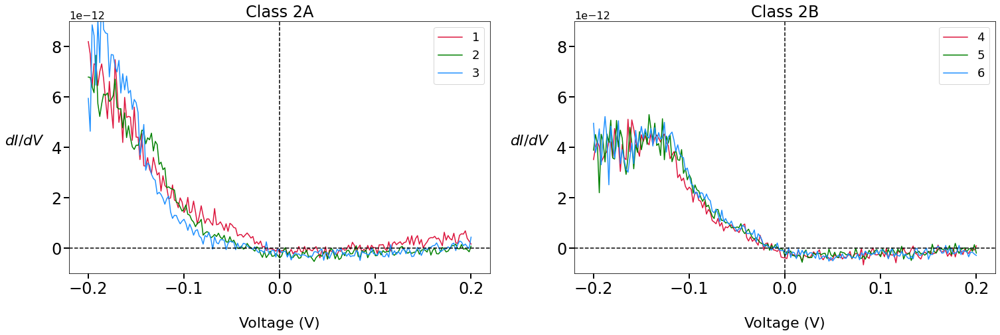

In [161]:
f,a = plt.subplots(1,2,figsize = (25,7))
# a[0].plot(z_axis, exp_cits[int(round(comraw2a[i1][0])), int(round(comraw2a[i1][1])),:], label = 'Adatom #{}'.format(i1))
a[0].plot(z_axis, exp_cits[int(round(comraw2a[i1][0])), int(round(comraw2a[i1][1])),:], label = '1', color = 'crimson')
a[0].plot(z_axis, exp_cits[int(round(comraw2a[i2][0])), int(round(comraw2a[i2][1])),:], label = '2', color = 'g')
a[0].plot(z_axis, exp_cits[int(round(comraw2a[i3][0])), int(round(comraw2a[i3][1])),:], label = '3', color = 'dodgerblue')
a[0].axhline(0, ls = '--', c = 'k')
a[0].axvline(0, ls = '--', c = 'k')

# a[1].plot(z_axis, exp_cits[int(round(comraw2b[k1][0])), int(round(comraw2b[k1][1])),:], label = 'Adatom #{}'.format(k1))
a[1].plot(z_axis, exp_cits[int(round(comraw2b[k1][0])), int(round(comraw2b[k1][1])),:], label = '4', color = 'crimson')
a[1].plot(z_axis, exp_cits[int(round(comraw2b[k2][0])), int(round(comraw2b[k2][1])),:], label = '5', color = 'g')
a[1].plot(z_axis, exp_cits[int(round(comraw2b[k3][0])), int(round(comraw2b[k3][1])),:], label = '6', color = 'dodgerblue')
a[1].axhline(0, ls = '--', c = 'k')
a[1].axvline(0, ls = '--', c = 'k')


a[0].legend(fontsize = 18)
a[1].legend(fontsize = 18)

a[0].set_ylim(-1E-12, 9E-12)
a[1].set_ylim(-1E-12, 9E-12)

a[0].set_xlabel('Voltage (V)', fontsize = 22, labelpad = 30)
a[1].set_xlabel('Voltage (V)', fontsize = 22, labelpad = 30)
a[0].set_ylabel('$dI/dV$', rotation = 0, fontsize = 22, labelpad = 40)
a[1].set_ylabel('$dI/dV$', rotation = 0, fontsize = 22, labelpad = 40)

a[0].set_title('Class 2A', fontsize = 24)
a[1].set_title('Class 2B', fontsize = 24);

a[0].tick_params(labelsize = 24, size = 8, width = 2)
a[1].tick_params(labelsize = 24, size = 8, width = 2)

a[0].yaxis.get_offset_text().set(size=16)
a[1].yaxis.get_offset_text().set(size=16)

## Class 4

In [162]:
print("Number of adatoms in class 4: {}".format(blobclass4.shape[0]))

Number of adatoms in class 4: 109


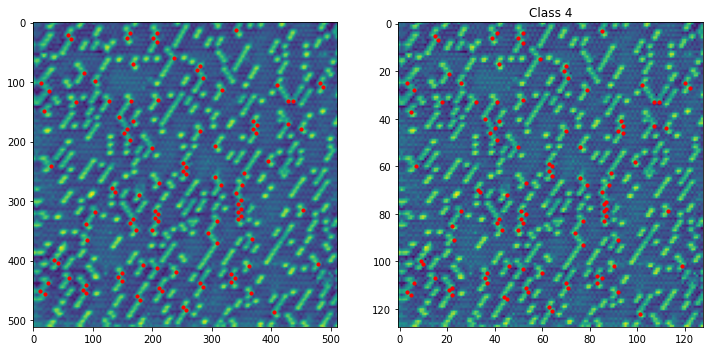

In [163]:
class4positions = []

for ii in range(blobclass4.shape[0]):
  class4positions.append((int(round(com[blobclass4[ii],1])),int(round(com[blobclass4[ii],0]))))

f,a = plt.subplots(1,2,figsize=(12,6))

for ii in range(len(class4positions)):
  a[0].scatter(class4positions[ii][0], class4positions[ii][1], color = 'r', s = 10)
a[0].imshow(resize(topo_f_n,(512,512)))

a[1].imshow(topo_f_n)
for ii in range(blobclass4.shape[0]):
  a[1].scatter(int(round(com[blobclass4[ii],1]/4)), int(round(com[blobclass4[ii],0]/4)), color = 'r', s = 10)
a[1].set_title('Class 4');

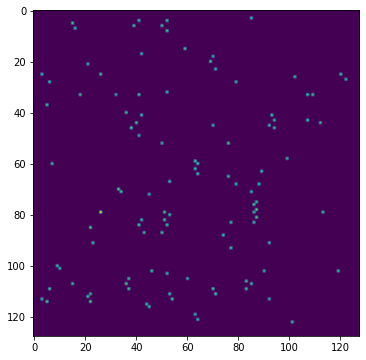

In [164]:
## Generate array from the (x,y) pairs
Mask4 = np.zeros_like(topo_f_n)
for ii in range(len(class4positions)):
    # Mask1[int(class1positions[ii][0]),int(class1positions[ii][1])] = 1
    Mask4[int(round(com[blobclass4[ii],0]/4)),int(round(com[blobclass4[ii],1]/4))] = 1

## Mask the SPECTRAL data using the Mask1 array
test4 = np.tile(Mask4, (201,1,1))
test4_ = np.swapaxes(np.swapaxes(test4,0,1), 1,2)
test4_.shape
class4_masked = test4_*exp_cits

# Flatten for PCA
XY4 = class4_masked.shape[:2]
class4_masked_flat=class4_masked.reshape((np.prod(XY4),class4_masked.shape[2]))

# Show
plt.figure(figsize=(6,6))
plt.imshow(np.mean(class4_masked[:,:,:],axis=2))

(128, 128, 201)


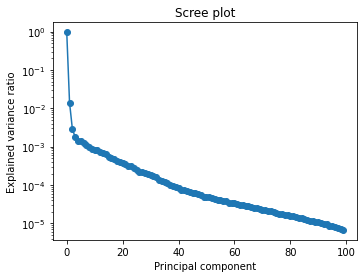

In [165]:
# PCA on class 4:

fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()
pca.fit(class4_masked_flat)
explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

print(class4_masked.shape)
w, h, n = class4_masked.shape

In [166]:
nc = 3
clf = PCA(n_components=nc)
X_vec_t = clf.fit_transform(class4_masked_flat)
components = clf.components_
X_vec_t = X_vec_t.reshape(w, h, nc)

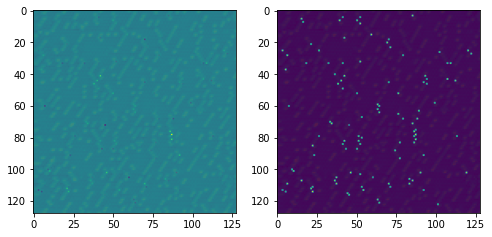

In [167]:
Class4_PCA0 = X_vec_t[:,:,0]
Class4_PCA1 = X_vec_t[:,:,1]

# normalize [0,1]
Class4_PCA0_n = (Class4_PCA0 - np.min(Class4_PCA0))/np.ptp(Class4_PCA0)
Class4_PCA1_n = (Class4_PCA1 - np.min(Class4_PCA1))/np.ptp(Class4_PCA1)

# plot
f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow(topo_f_n)
a[0].imshow(Class4_PCA1_n, vmin = 0, alpha = 0.9)

a[1].imshow(topo_f_n)
a[1].imshow(Class4_PCA0_n, vmin = 0, alpha = 0.9)

(0.0, 1.0)

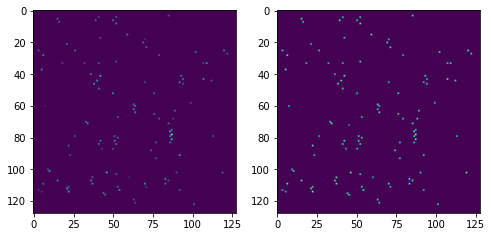

In [168]:
Class4_PCA1_n_masked = Mask4*Class4_PCA1_n
Class4_PCA0_n_masked = Class4_PCA0_n

f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow(Class4_PCA1_n_masked)
a[1].imshow(Class4_PCA0_n_masked)
np.min(Class4_PCA1_n_masked), np.max(Class4_PCA1_n_masked)

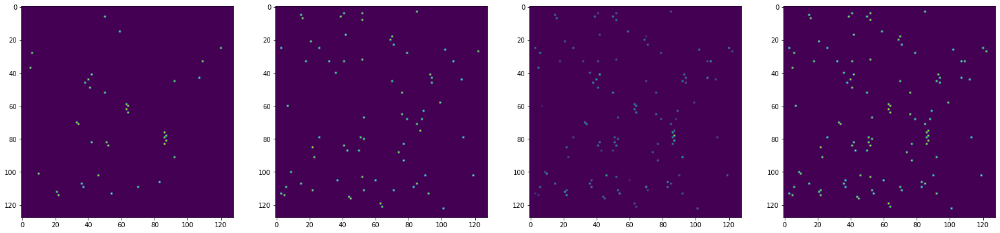

In [169]:
thresh1 = 0.5
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class4_PCA1_n_c = np.copy(Class4_PCA1_n_masked)
Class4_PCA1_n_c[np.where(Class4_PCA1_n_c >= thresh1)] = 1
Class4_PCA1_n_c[np.where(Class4_PCA1_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class4_PCA1_b = Class4_PCA1_n_masked - Class4_PCA1_n_c
Class4_PCA1_b[np.where(Class4_PCA1_b >= thresh2)] = 1
Class4_PCA1_b[np.where(Class4_PCA1_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class4_PCA1_n_c)
a[1].imshow(Class4_PCA1_b)
a[2].imshow(Class4_PCA1_n_masked)
a[3].imshow(Class4_PCA1_n_c + Class4_PCA1_b)

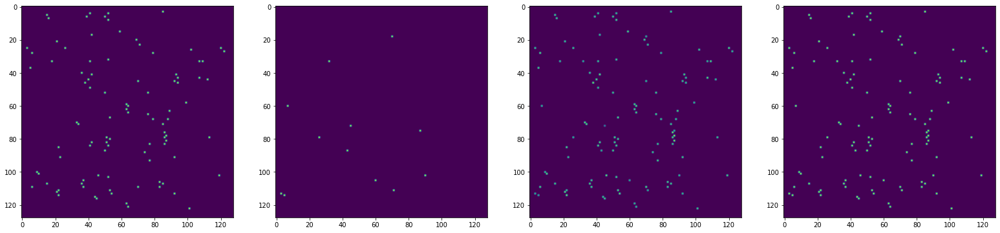

In [170]:
thresh1 = 0.75
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class4_PCA0_n_c = np.copy(Class4_PCA0_n_masked)
Class4_PCA0_n_c[np.where(Class4_PCA0_n_c >= thresh1)] = 1
Class4_PCA0_n_c[np.where(Class4_PCA0_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class4_PCA0_b = Class4_PCA0_n_masked - Class4_PCA0_n_c
Class4_PCA0_b[np.where(Class4_PCA0_b >= thresh2)] = 1
Class4_PCA0_b[np.where(Class4_PCA0_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class4_PCA0_n_c)
a[1].imshow(Class4_PCA0_b)
a[2].imshow(Class4_PCA0_n_masked)
a[3].imshow(Class4_PCA0_n_c + Class4_PCA0_b)

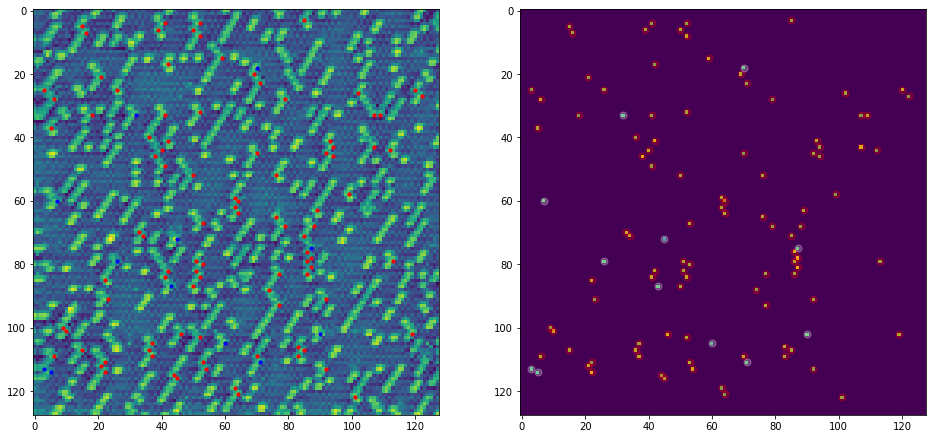

In [171]:
# Separated Class 2 into two categories: strong PCA0 above 75% intensity in that component (a), and the rest (b)

Class4_PCA0_coords_a = np.argwhere(Class4_PCA0_n_c == 1)
Class4_PCA0_coords_b = np.argwhere(Class4_PCA0_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class4_PCA0_coords_a.shape[0]):
  a[0].scatter(Class4_PCA0_coords_a[ii][1], Class4_PCA0_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class4_PCA0_coords_b.shape[0]): 
  a[0].scatter(Class4_PCA0_coords_b[ii][1], Class4_PCA0_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class4_PCA0_n_masked)
for ii in range(Class4_PCA0_coords_a.shape[0]):
  a[1].scatter(Class4_PCA0_coords_a[ii][1], Class4_PCA0_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class4_PCA0_coords_b.shape[0]): 
  a[1].scatter(Class4_PCA0_coords_b[ii][1], Class4_PCA0_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

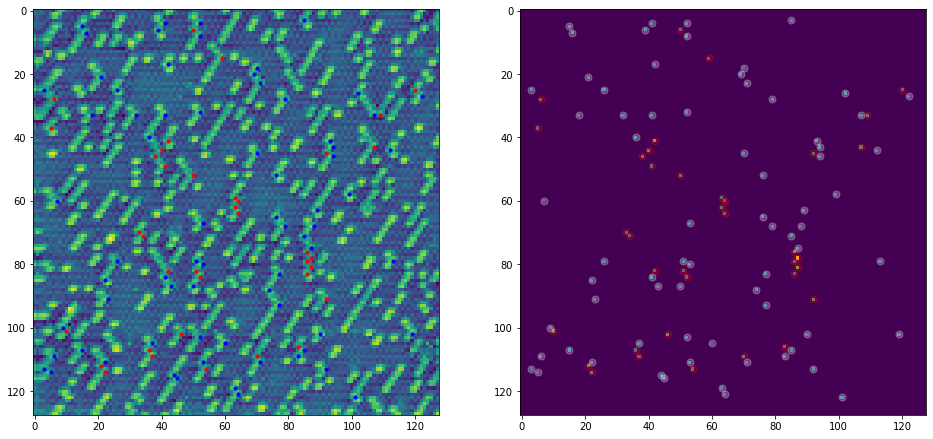

In [172]:
# Separated Class 2 into two categories: strong PCA1 above 50% intensity in that component (a), and the rest (b)

Class4_PCA1_coords_a = np.argwhere(Class4_PCA1_n_c == 1)
Class4_PCA1_coords_b = np.argwhere(Class4_PCA1_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class4_PCA1_coords_a.shape[0]):
  a[0].scatter(Class4_PCA1_coords_a[ii][1], Class4_PCA1_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class4_PCA1_coords_b.shape[0]): 
  a[0].scatter(Class4_PCA1_coords_b[ii][1], Class4_PCA1_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class4_PCA1_n_masked)
for ii in range(Class4_PCA1_coords_a.shape[0]):
  a[1].scatter(Class4_PCA1_coords_a[ii][1], Class4_PCA1_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class4_PCA1_coords_b.shape[0]): 
  a[1].scatter(Class4_PCA1_coords_b[ii][1], Class4_PCA1_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

In [173]:
print(Class4_PCA0_coords_a.shape, Class4_PCA0_coords_b.shape)  #75% threshold for PCA 0
print(Class4_PCA1_coords_a.shape, Class4_PCA1_coords_b.shape)  #50% threshold for PCA 1

(97, 2) (12, 2)
(37, 2) (71, 2)


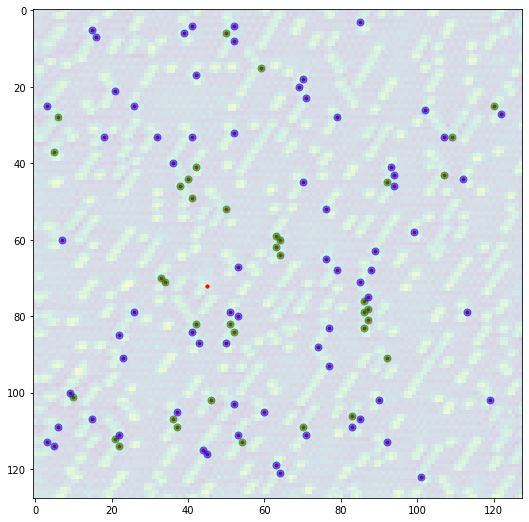

In [175]:
plt.figure(figsize=(9,9))
plt.imshow(topo_f_n,alpha = 0.2)
for ii in range(blobclass4.shape[0]):
 plt.scatter(int(round(com[blobclass4[ii],1]/4)), int(round(com[blobclass4[ii],0]/4)), color = 'r', s = 10, alpha = 1)

for ii in range(Class4_PCA1_coords_a.shape[0]):
  plt.scatter(Class4_PCA1_coords_a[ii][1], Class4_PCA1_coords_a[ii][0], color = 'g', s = 50, alpha = 0.5)

  
for ii in range(Class4_PCA1_coords_b.shape[0]):
  plt.scatter(Class4_PCA1_coords_b[ii][1], Class4_PCA1_coords_b[ii][0], color = 'b', s = 50, alpha = 0.5)

In [176]:
scalefactor = 1


## separated PCA 0

class4_pca0_a = np.zeros((Class4_PCA0_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class4_PCA0_coords_a.shape[0]):
  class4_pca0_a[ii] = exp_cits[int(Class4_PCA0_coords_a[ii][0]/scalefactor),int(Class4_PCA0_coords_a[ii][1]/scalefactor),:]
class4_pca0_a_mean = np.mean(class4_pca0_a,axis=0)

class4_pca0_b = np.zeros((Class4_PCA0_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class4_PCA0_coords_b.shape[0]):
  class4_pca0_b[ii] = exp_cits[int(Class4_PCA0_coords_b[ii][0]/scalefactor),int(Class4_PCA0_coords_b[ii][1]/scalefactor),:]
class4_pca0_b_mean = np.mean(class4_pca0_b,axis=0)

## separated PCA 1

class4_pca1_a = np.zeros((Class4_PCA1_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class4_PCA1_coords_a.shape[0]):
  class4_pca1_a[ii] = exp_cits[int(Class4_PCA1_coords_a[ii][0]/scalefactor),int(Class4_PCA1_coords_a[ii][1]/scalefactor),:]
class4_pca1_a_mean = np.mean(class4_pca1_a,axis=0)

class4_pca1_b = np.zeros((Class4_PCA1_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class4_PCA1_coords_b.shape[0]):
  class4_pca1_b[ii] = exp_cits[int(Class4_PCA1_coords_b[ii][0]/scalefactor),int(Class4_PCA1_coords_b[ii][1]/scalefactor),:]
class4_pca1_b_mean = np.mean(class4_pca1_b,axis=0)

* Get the standard deviation for a kind of error bar measurement

In [177]:
class4_pca0_a_stdev = np.std(class4_pca0_a,axis=0)
class4_pca0_b_stdev = np.std(class4_pca0_b,axis=0)

class4_pca1_a_stdev = np.std(class4_pca1_a,axis=0)
class4_pca1_b_stdev = np.std(class4_pca1_b,axis=0)

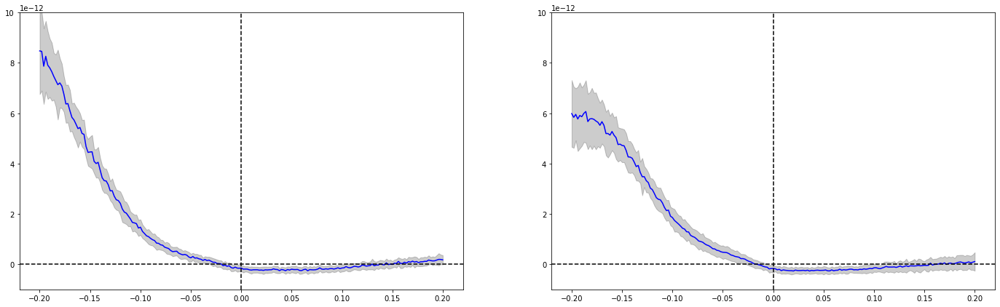

In [179]:
f,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis, class4_pca1_a_mean, color = 'blue')
a[0].fill_between(z_axis, class4_pca1_a_mean - class4_pca1_a_stdev, class4_pca1_a_mean+class4_pca1_a_stdev, alpha = 0.2, color = 'k')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].set_ylim(-0.1E-11,1E-11);

a[1].plot(z_axis, class4_pca1_b_mean, color = 'blue')
a[1].fill_between(z_axis, class4_pca1_b_mean - class4_pca1_b_stdev, class4_pca1_b_mean+class4_pca1_b_stdev, alpha = 0.2, color = 'k')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')
a[1].set_ylim(-0.1E-11,1E-11);

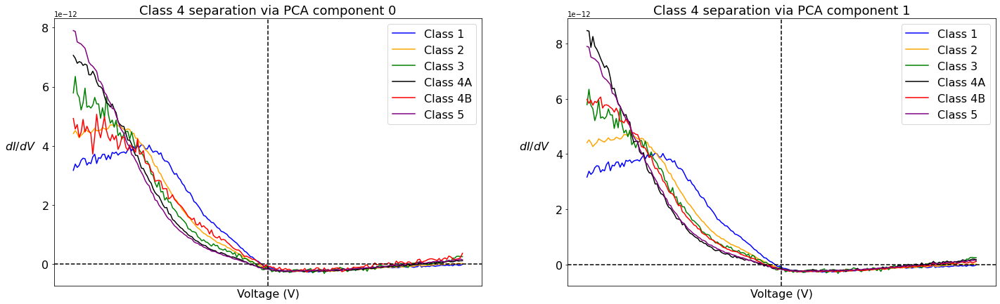

In [180]:
f,a = plt.subplots(1,2,figsize=(24,7))

a[0].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[0].plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[0].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[0].plot(z_axis,class4_pca0_a_mean, label = "Class 4A", color = 'k')
a[0].plot(z_axis,class4_pca0_b_mean, label = "Class 4B", color = 'red')
a[0].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].legend(fontsize = 12)

a[0].set_xlabel('Voltage (V)', size = 16);
a[0].set_ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
a[0].tick_params(axis='both', labelsize = 12)

a[1].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[1].plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[1].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[1].plot(z_axis,class4_pca1_a_mean, label = "Class 4A", color = 'k')
a[1].plot(z_axis,class4_pca1_b_mean, label = "Class 4B", color = 'red')
a[1].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')

a[0].legend(fontsize = 16)
a[1].legend(fontsize = 16)

a[1].set_xlabel('Voltage (V)', size = 16);
a[1].set_ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
a[1].tick_params(axis='both', labelsize = 12)

a[0].set_title("Class 4 separation via PCA component 0", fontsize = 18)
a[1].set_title("Class 4 separation via PCA component 1", fontsize = 18);

a[0].tick_params(labelsize=16)
a[1].tick_params(labelsize=16)

plt.setp([a[0],a[1]], xticks=[]);

* Separation using PCA component 0 seems to just shuffle potentially misclassified (structurally) misclassified atoms into already existing class.
* Note that in this plot (left), there are still essentially 5 spectra
* However, separation via PCA component 1 appears to show a new spectral feature, shown in black curve (Right)

Comparsion (before and after separation)

(-1e-12, 9e-12)

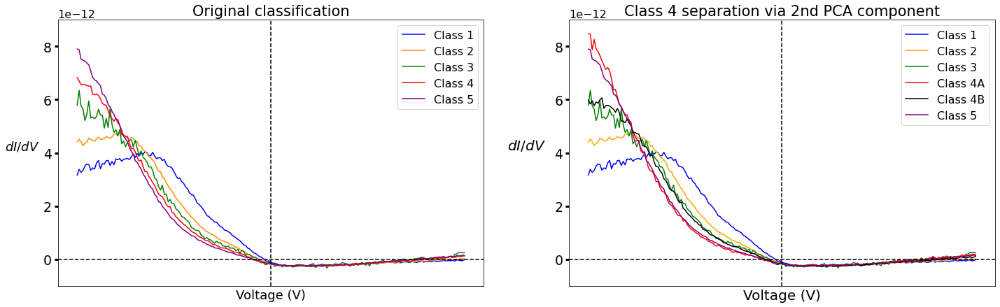

In [181]:
fig,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[0].plot(z_axis,class2_mean, label = "Class 2", color = 'darkorange')
a[0].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[0].plot(z_axis,class4_mean, label = "Class 4", color = 'red')
a[0].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')



a[0].set_xlabel('Voltage (V)', size = 18);
a[0].set_ylabel('$dI/dV$', size = 18, rotation = 0, labelpad = 30);
a[0].tick_params(labelsize = 16)

# plt.fill_between(z_axis, class1_mean-class1_stdev, class1_mean+class1_stdev, color = 'blue', alpha = 0.2)
# plt.fill_between(z_axis, class2_mean-class2_stdev, class2_mean+class2_stdev, color = 'orange', alpha = 0.2)
# plt.fill_between(z_axis, class3_mean-class3_stdev, class3_mean+class3_stdev, color = 'green', alpha = 0.2)
# plt.fill_between(z_axis, class4_mean-class4_stdev, class4_mean+class4_stdev, color = 'red', alpha = 0.2)
# plt.fill_between(z_axis, class5_mean-class5_stdev, class5_mean+class5_stdev, color = 'purple', alpha = 0.2)

a[1].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[1].plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[1].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[1].plot(z_axis,class4_pca1_a_mean, label = "Class 4A", color = 'red')
a[1].plot(z_axis,class4_pca1_b_mean, label = "Class 4B", color = 'k')
a[1].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')

a[0].legend(fontsize = 16)
a[1].legend(fontsize = 16)

a[1].set_xlabel('Voltage (V)', size = 20);
a[1].set_ylabel('$dI/dV$', size = 20, rotation = 0, labelpad = 40);
# a[1].tick_params(axis='both', labelsize = 16)

a[0].set_title("Original classification", fontsize = 21)
a[1].set_title("Class 4 separation via 2nd PCA component", fontsize = 21);

a[0].tick_params(labelsize=19, width = 3, size = 5)
a[1].tick_params(labelsize=19, width = 3, size = 5)

a[0].yaxis.get_offset_text().set(size=16)
a[1].yaxis.get_offset_text().set(size=16)

plt.setp([a[0],a[1]], xticks=[]);

a[0].set_ylim(-1E-12, 9E-12)
a[1].set_ylim(-1E-12, 9E-12)

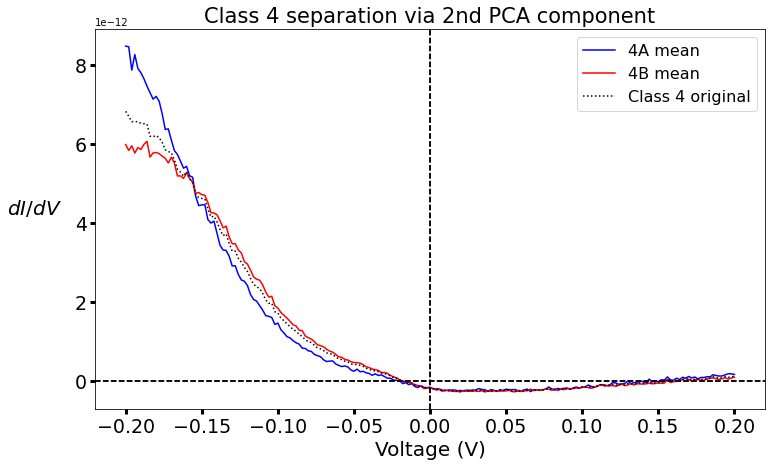

In [182]:
plt.figure(figsize=(12,7))
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')


plt.tick_params(labelsize = 16)

plt.plot(z_axis,class4_pca1_a_mean, label = "4A mean", color = 'blue')
plt.plot(z_axis,class4_pca1_b_mean, label = "4B mean", color = 'r')
plt.plot(z_axis,class4_mean, color = 'k', ls = ':', label = 'Class 4 original')

plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')

plt.legend(fontsize = 16)
plt.legend(fontsize = 16)

plt.xlabel('Voltage (V)', size = 20);
plt.ylabel('$dI/dV$', size = 20, rotation = 0, labelpad = 40);
# plt.tick_params(axis='both', labelsize = 16)

plt.title("Class 4 separation via 2nd PCA component", fontsize = 21);

plt.tick_params(labelsize=19, width = 3, size = 5)
plt.tick_params(labelsize=19, width = 3, size = 5)


In [183]:
crs = 6 # size of image to crop

imgstack_4a, com4a = extract_subimages(topo_f_n, Class4_PCA1_coords_a, crs)

imgstack_4b, com4b = extract_subimages(topo_f_n, Class4_PCA1_coords_b, crs)

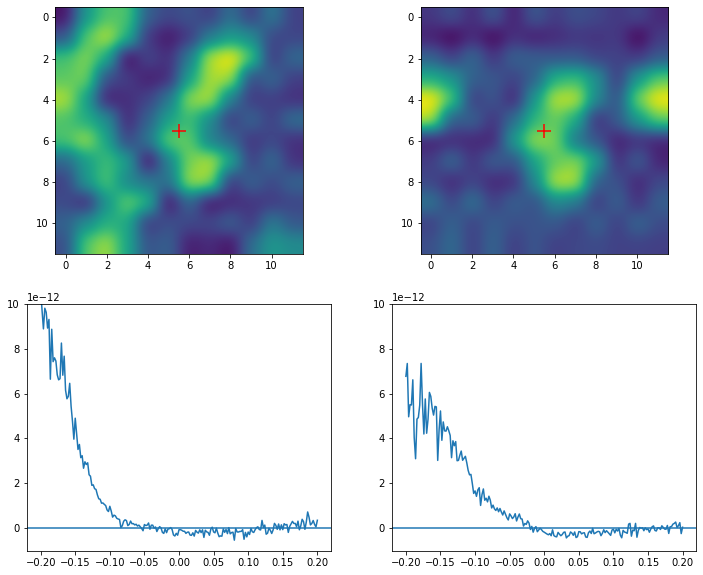

In [184]:
k1 = 5
k2 = 3

f,a = plt.subplots(2,2,figsize=(12,10))
a[0,0].imshow(imgstack_4a[k1], interpolation = 'gaussian')
a[0,1].imshow(imgstack_4b[k2], interpolation = 'gaussian')
a[0,0].scatter(int(imgstack_4a.shape[2]/2)-0.5, int(imgstack_4a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)
a[0,1].scatter(int(imgstack_4a.shape[2]/2)-0.5, int(imgstack_4a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)

a[1,0].plot(z_axis,exp_cits[int(round(com4a[k1,0])), int(round(com4a[k1,1])), :])
a[1,1].plot(z_axis,exp_cits[int(round(com4b[k2,0])), int(round(com4b[k2,1])), :])

a[1,0].set_ylim(-1E-12, 10E-12)
a[1,1].set_ylim(-1E-12, 10E-12)

a[1,0].axhline(0)
a[1,1].axhline(0)

## Class 5:

In [185]:
print("Number of adatoms in class 5: {}".format(blobclass5.shape[0]))

Number of adatoms in class 5: 177


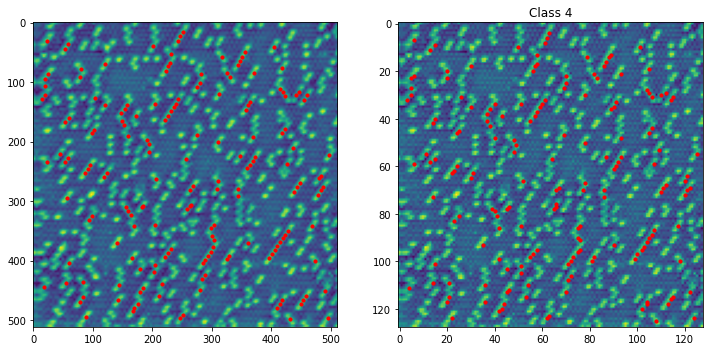

In [188]:
class5positions = []

for ii in range(blobclass5.shape[0]):
  class5positions.append((int(round(com[blobclass5[ii],1])),int(round(com[blobclass5[ii],0]))))

f,a = plt.subplots(1,2,figsize=(12,6))

for ii in range(len(class5positions)):
  a[0].scatter(class5positions[ii][0], class5positions[ii][1], color = 'r', s = 10)
a[0].imshow(resize(topo_f_n,(512,512)))

a[1].imshow(topo_f_n)
for ii in range(blobclass5.shape[0]):
  a[1].scatter(int(round(com[blobclass5[ii],1]/4)), int(round(com[blobclass5[ii],0]/4)), color = 'r', s = 10)
a[1].set_title('Class 4');

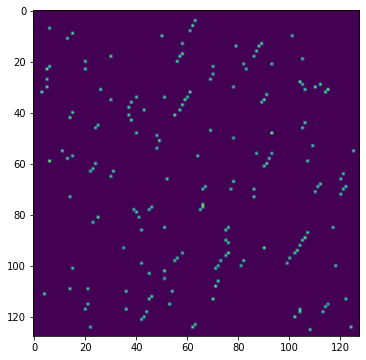

In [189]:
## Generate array from the (x,y) pairs
Mask5 = np.zeros_like(topo_f_n)
for ii in range(len(class5positions)):
    Mask5[int(round(com[blobclass5[ii],0]/4)),int(round(com[blobclass5[ii],1]/4))] = 1

## Mask the SPECTRAL data using the Mask1 array
test5 = np.tile(Mask5, (201,1,1))
test5_ = np.swapaxes(np.swapaxes(test5,0,1), 1,2)
test5_.shape
class5_masked = test5_*exp_cits

# Flatten for PCA
XY5 = class5_masked.shape[:2]
class5_masked_flat=class5_masked.reshape((np.prod(XY5),class5_masked.shape[2]))

# Show
plt.figure(figsize=(6,6))
plt.imshow(np.mean(class5_masked[:,:,:],axis=2))

(128, 128, 201)


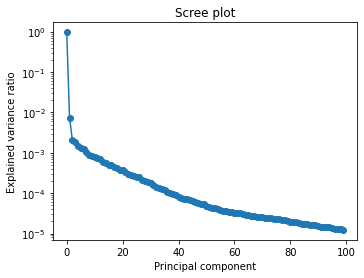

In [190]:
# PCA on class 5:

fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()
pca.fit(class5_masked_flat)
explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')

print(class5_masked.shape)
w, h, n = class5_masked.shape

In [191]:
nc = 3

clf = PCA(n_components=nc)
X_vec_t = clf.fit_transform(class5_masked_flat)
components = clf.components_
X_vec_t = X_vec_t.reshape(w, h, nc)

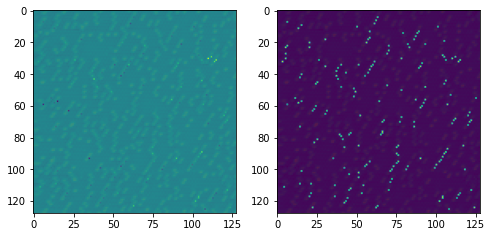

In [192]:
Class5_PCA0 = X_vec_t[:,:,0]
Class5_PCA1 = X_vec_t[:,:,1]

# normalize [0,1]
Class5_PCA0_n = (Class5_PCA0 - np.min(Class5_PCA0))/np.ptp(Class5_PCA0)
Class5_PCA1_n = (Class5_PCA1 - np.min(Class5_PCA1))/np.ptp(Class5_PCA1)

# plot
f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow(topo_f_n)
a[0].imshow(Class5_PCA1_n, vmin = 0, alpha = 0.9)

a[1].imshow(topo_f_n)
a[1].imshow(Class5_PCA0_n, vmin = 0, alpha = 0.9)

In [193]:
Class5_PCA1_n.min(), Class5_PCA1_n.max()

(0.0, 1.0)

In [ ]:
# The background should be zero (why is it not?? How can the PCA extrapolate? Seems like just some kind of offset to the background..)
# So, let's multiply these by the mask we generated earlier

(0.0, 1.0)

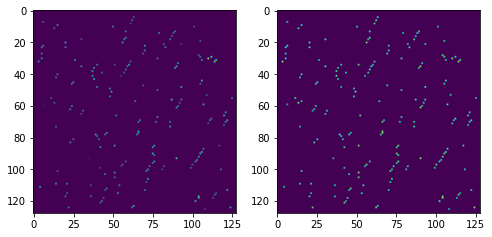

In [194]:
Class5_PCA1_n_masked = Mask5*Class5_PCA1_n
Class5_PCA0_n_masked = Class5_PCA0_n

f,a = plt.subplots(1,2,figsize=(8,4))
a[0].imshow(Class5_PCA1_n_masked)
a[1].imshow(Class5_PCA0_n_masked)
np.min(Class5_PCA1_n_masked), np.max(Class5_PCA1_n_masked)

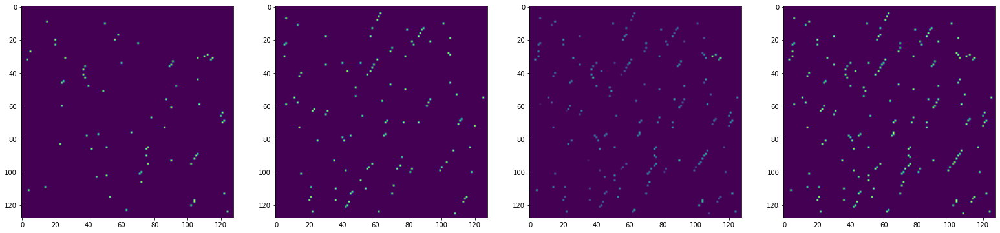

In [195]:
thresh1 = 0.5
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class5_PCA1_n_c = np.copy(Class5_PCA1_n_masked)
Class5_PCA1_n_c[np.where(Class5_PCA1_n_c >= thresh1)] = 1
Class5_PCA1_n_c[np.where(Class5_PCA1_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class5_PCA1_b = Class5_PCA1_n_masked - Class5_PCA1_n_c
Class5_PCA1_b[np.where(Class5_PCA1_b >= thresh2)] = 1
Class5_PCA1_b[np.where(Class5_PCA1_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class5_PCA1_n_c)
a[1].imshow(Class5_PCA1_b)
a[2].imshow(Class5_PCA1_n_masked)
a[3].imshow(Class5_PCA1_n_c + Class5_PCA1_b)

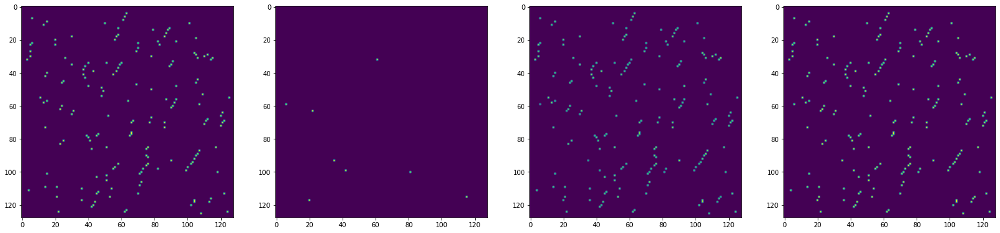

In [196]:
thresh1 = 0.75
thresh2 = 0.001

# separate the atoms by a threshold value 

# first step is to set all atoms above threshold to 1, and all others to zero.
# This generates a map of only the stronger adatoms (stronger in the PCA component sense)
Class5_PCA0_n_c = np.copy(Class5_PCA0_n_masked)
Class5_PCA0_n_c[np.where(Class5_PCA0_n_c >= thresh1)] = 1
Class5_PCA0_n_c[np.where(Class5_PCA0_n_c < thresh1)] = 0

# Then, to get the remaining atoms, we subtract the ones in previous step from the
# original. And with the original, 

Class5_PCA0_b = Class5_PCA0_n_masked - Class5_PCA0_n_c
Class5_PCA0_b[np.where(Class5_PCA0_b >= thresh2)] = 1
Class5_PCA0_b[np.where(Class5_PCA0_b < thresh2)] = 0


f,a = plt.subplots(1,4,figsize=(27,14))
a[0].imshow(Class5_PCA0_n_c)
a[1].imshow(Class5_PCA0_b)
a[2].imshow(Class5_PCA0_n_masked)
a[3].imshow(Class5_PCA0_n_c + Class5_PCA0_b)

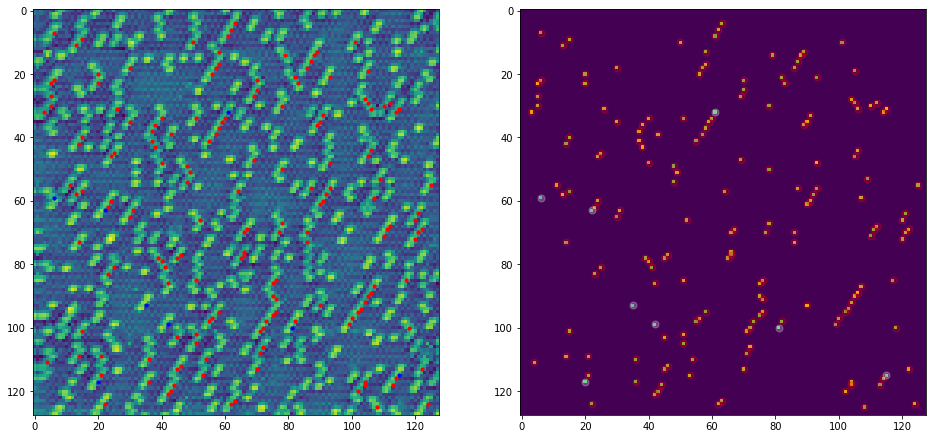

In [197]:
# Separated Class 2 into two categories: strong PCA0 above 75% intensity in that component (a), and the rest (b)

Class5_PCA0_coords_a = np.argwhere(Class5_PCA0_n_c == 1)
Class5_PCA0_coords_b = np.argwhere(Class5_PCA0_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class5_PCA0_coords_a.shape[0]):
  a[0].scatter(Class5_PCA0_coords_a[ii][1], Class5_PCA0_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class5_PCA0_coords_b.shape[0]): 
  a[0].scatter(Class5_PCA0_coords_b[ii][1], Class5_PCA0_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class5_PCA0_n_masked)
for ii in range(Class5_PCA0_coords_a.shape[0]):
  a[1].scatter(Class5_PCA0_coords_a[ii][1], Class5_PCA0_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class5_PCA0_coords_b.shape[0]): 
  a[1].scatter(Class5_PCA0_coords_b[ii][1], Class5_PCA0_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

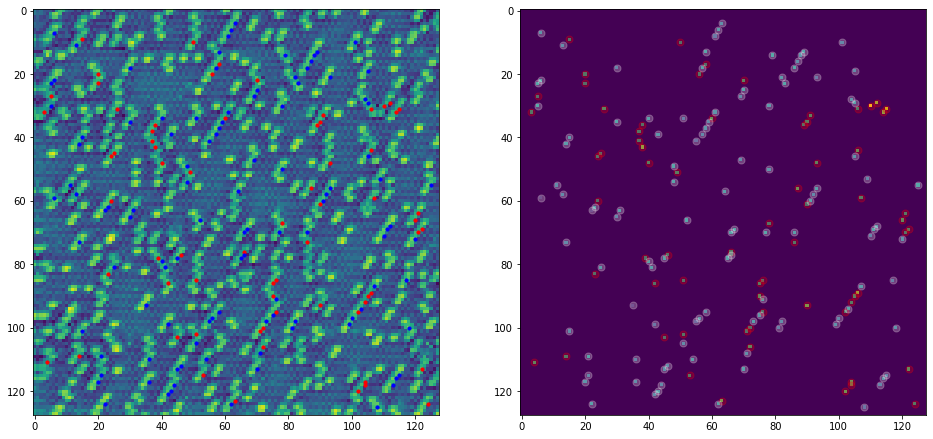

In [198]:
# Separated Class 5 into two categories: strong PCA1 above 50% intensity in that component (a), and the rest (b)

Class5_PCA1_coords_a = np.argwhere(Class5_PCA1_n_c == 1)
Class5_PCA1_coords_b = np.argwhere(Class5_PCA1_b == 1)

f,a = plt.subplots(1,2,figsize=(16,8))
a[0].imshow(topo_f_n)
for ii in range(Class5_PCA1_coords_a.shape[0]):
  a[0].scatter(Class5_PCA1_coords_a[ii][1], Class5_PCA1_coords_a[ii][0], color = 'r', s = 10)
for ii in range(Class5_PCA1_coords_b.shape[0]): 
  a[0].scatter(Class5_PCA1_coords_b[ii][1], Class5_PCA1_coords_b[ii][0], color = 'b', s = 10)

a[1].imshow(Class5_PCA1_n_masked)
for ii in range(Class5_PCA1_coords_a.shape[0]):
  a[1].scatter(Class5_PCA1_coords_a[ii][1], Class5_PCA1_coords_a[ii][0], color = 'r', s = 50, alpha = 0.25)
for ii in range(Class5_PCA1_coords_b.shape[0]): 
  a[1].scatter(Class5_PCA1_coords_b[ii][1], Class5_PCA1_coords_b[ii][0], color = 'w', s = 50, alpha = 0.25)

In [199]:
print(Class5_PCA0_coords_a.shape, Class5_PCA0_coords_b.shape)  #75% threshold for PCA 0
print(Class5_PCA1_coords_a.shape, Class5_PCA1_coords_b.shape)  #50% threshold for PCA 1

(169, 2) (8, 2)
(68, 2) (108, 2)


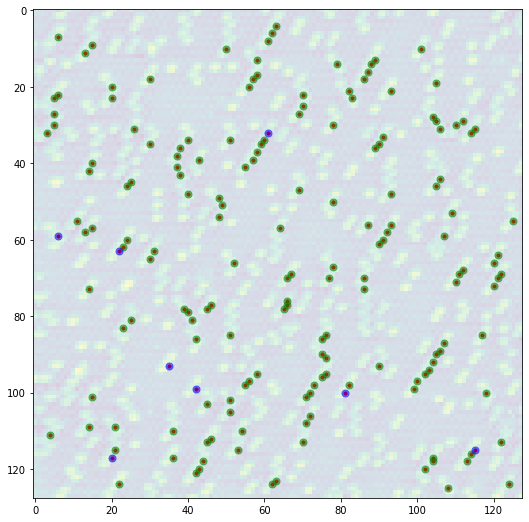

In [200]:
plt.figure(figsize=(9,9))
plt.imshow(topo_f_n,alpha = 0.2)
for ii in range(blobclass5.shape[0]):
 plt.scatter(int(round(com[blobclass5[ii],1]/4)), int(round(com[blobclass5[ii],0]/4)), color = 'r', s = 10, alpha = 1)

for ii in range(Class5_PCA0_coords_a.shape[0]):
  plt.scatter(Class5_PCA0_coords_a[ii][1], Class5_PCA0_coords_a[ii][0], color = 'g', s = 50, alpha = 0.5)

  
for ii in range(Class5_PCA0_coords_b.shape[0]):
  plt.scatter(Class5_PCA0_coords_b[ii][1], Class5_PCA0_coords_b[ii][0], color = 'b', s = 50, alpha = 0.5)

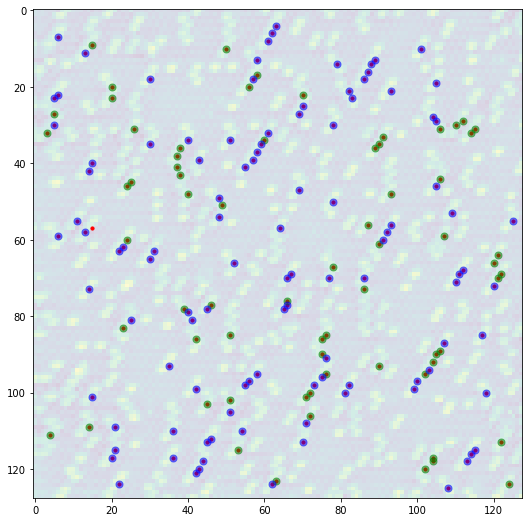

In [201]:
plt.figure(figsize=(9,9))
plt.imshow(topo_f_n,alpha = 0.2)
for ii in range(blobclass5.shape[0]):
 plt.scatter(int(round(com[blobclass5[ii],1]/4)), int(round(com[blobclass5[ii],0]/4)), color = 'r', s = 10, alpha = 1)

for ii in range(Class5_PCA1_coords_a.shape[0]):
  plt.scatter(Class5_PCA1_coords_a[ii][1], Class5_PCA1_coords_a[ii][0], color = 'g', s = 50, alpha = 0.5)

  
for ii in range(Class5_PCA1_coords_b.shape[0]):
  plt.scatter(Class5_PCA1_coords_b[ii][1], Class5_PCA1_coords_b[ii][0], color = 'b', s = 50, alpha = 0.5)

In [202]:
scalefactor = 1


## separated PCA 0

class5_pca0_a = np.zeros((Class5_PCA0_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class5_PCA0_coords_a.shape[0]):
  class5_pca0_a[ii] = exp_cits[int(Class5_PCA0_coords_a[ii][0]/scalefactor),int(Class5_PCA0_coords_a[ii][1]/scalefactor),:]
class5_pca0_a_mean = np.mean(class5_pca0_a,axis=0)

class5_pca0_b = np.zeros((Class5_PCA0_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class5_PCA0_coords_b.shape[0]):
  class5_pca0_b[ii] = exp_cits[int(Class5_PCA0_coords_b[ii][0]/scalefactor),int(Class5_PCA0_coords_b[ii][1]/scalefactor),:]
class5_pca0_b_mean = np.mean(class5_pca0_b,axis=0)

## separated PCA 1

class5_pca1_a = np.zeros((Class5_PCA1_coords_a.shape[0],exp_cits.shape[2]))
for ii in range(Class5_PCA1_coords_a.shape[0]):
  class5_pca1_a[ii] = exp_cits[int(Class5_PCA1_coords_a[ii][0]/scalefactor),int(Class5_PCA1_coords_a[ii][1]/scalefactor),:]
class5_pca1_a_mean = np.mean(class5_pca1_a,axis=0)

class5_pca1_b = np.zeros((Class5_PCA1_coords_b.shape[0],exp_cits.shape[2]))
for ii in range(Class5_PCA1_coords_b.shape[0]):
  class5_pca1_b[ii] = exp_cits[int(Class5_PCA1_coords_b[ii][0]/scalefactor),int(Class5_PCA1_coords_b[ii][1]/scalefactor),:]
class5_pca1_b_mean = np.mean(class5_pca1_b,axis=0)

* Get the standard deviation for a kind of error bar measurement

In [203]:
class5_pca0_a_stdev = np.std(class5_pca0_a,axis=0)
class5_pca0_b_stdev = np.std(class5_pca0_b,axis=0)

class5_pca1_a_stdev = np.std(class5_pca1_a,axis=0)
class5_pca1_b_stdev = np.std(class5_pca1_b,axis=0)

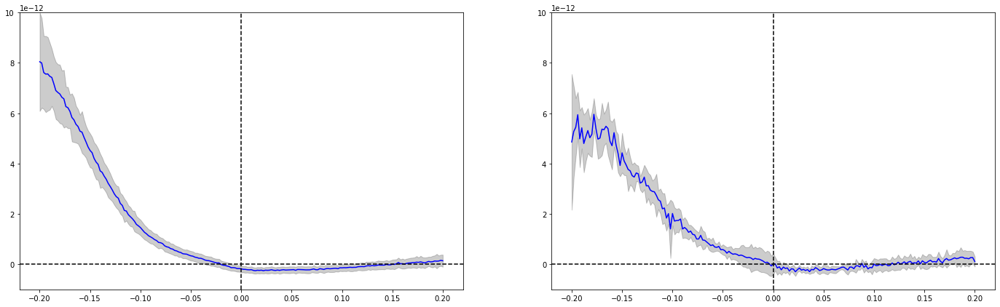

In [204]:
f,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis, class5_pca0_a_mean, color = 'blue')
a[0].fill_between(z_axis, class5_pca0_a_mean - class5_pca0_a_stdev, class5_pca0_a_mean+class5_pca0_a_stdev, alpha = 0.2, color = 'k')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].set_ylim(-0.1E-11,1E-11);

a[1].plot(z_axis, class5_pca0_b_mean, color = 'blue')
a[1].fill_between(z_axis, class5_pca0_b_mean - class5_pca0_b_stdev, class5_pca0_b_mean+class5_pca0_b_stdev, alpha = 0.2, color = 'k')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')
a[1].set_ylim(-0.1E-11,1E-11);

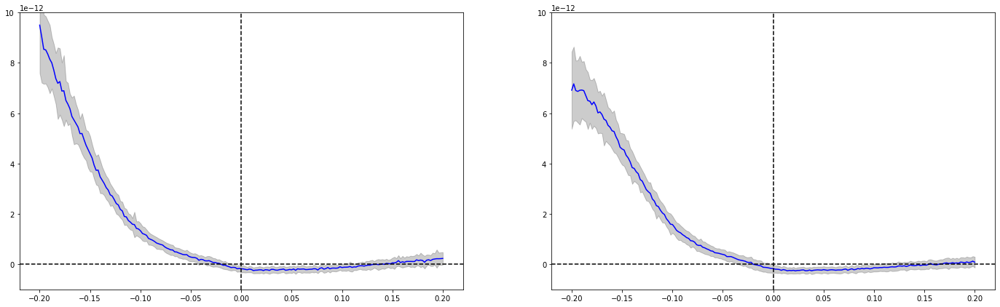

In [205]:
f,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis, class5_pca1_a_mean, color = 'blue')
a[0].fill_between(z_axis, class5_pca1_a_mean - class5_pca1_a_stdev, class5_pca1_a_mean+class5_pca1_a_stdev, alpha = 0.2, color = 'k')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].set_ylim(-0.1E-11,1E-11);

a[1].plot(z_axis, class5_pca1_b_mean, color = 'blue')
a[1].fill_between(z_axis, class5_pca1_b_mean - class5_pca1_b_stdev, class5_pca1_b_mean+class5_pca1_b_stdev, alpha = 0.2, color = 'k')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')
a[1].set_ylim(-0.1E-11,1E-11);

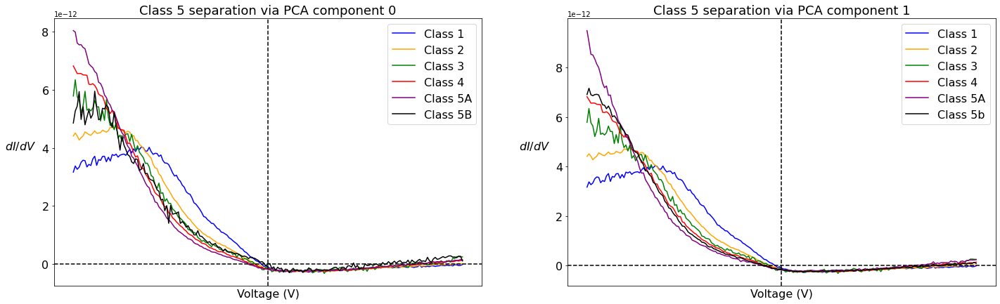

In [206]:
f,a = plt.subplots(1,2,figsize=(24,7))

a[0].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[0].plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[0].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[0].plot(z_axis,class4_mean, label = "Class 4", color = 'r')
a[0].plot(z_axis,class5_pca0_a_mean, label = "Class 5A", color = 'purple')
a[0].plot(z_axis,class5_pca0_b_mean, label = "Class 5B", color = 'k')

a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')
a[0].legend(fontsize = 12)

a[0].set_xlabel('Voltage (V)', size = 16);
a[0].set_ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
a[0].tick_params(axis='both', labelsize = 12)

a[1].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[1].plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[1].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[1].plot(z_axis,class4_mean, label = "Class 4", color = 'red')
a[1].plot(z_axis,class5_pca1_a_mean, label = "Class 5A", color = 'purple')
a[1].plot(z_axis,class5_pca1_b_mean, label = "Class 5b", color = 'k')

a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')

a[0].legend(fontsize = 16)
a[1].legend(fontsize = 16)

a[1].set_xlabel('Voltage (V)', size = 16);
a[1].set_ylabel('$dI/dV$', size = 16, rotation = 0, labelpad = 30);
a[1].tick_params(axis='both', labelsize = 12)

a[0].set_title("Class 5 separation via PCA component 0", fontsize = 18)
a[1].set_title("Class 5 separation via PCA component 1", fontsize = 18);

a[0].tick_params(labelsize=16)
a[1].tick_params(labelsize=16)

plt.setp([a[0],a[1]], xticks=[]);

* Separation using PCA component 0 seems to just shuffle potentially misclassified (structurally) misclassified atoms into already existing class.
* Note that in this plot (left), there are still essentially 5 spectra
* However, separation via PCA component 1 appears to show a new spectral feature, shown in black curve (Right)

Comparsion (before and after separation)

(-1e-12, 9e-12)

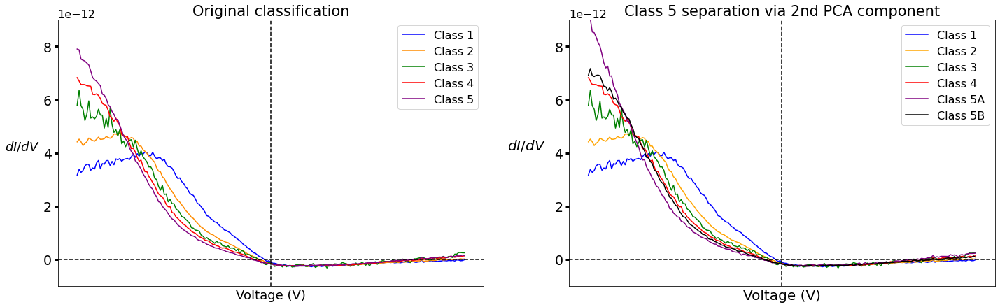

In [207]:
fig,a = plt.subplots(1,2,figsize=(24,7))
a[0].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[0].plot(z_axis,class2_mean, label = "Class 2", color = 'darkorange')
a[0].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[0].plot(z_axis,class4_mean, label = "Class 4", color = 'red')
a[0].plot(z_axis,class5_mean, label = "Class 5", color = 'purple')
a[0].axvline(0,c='k',ls='--')
a[0].axhline(0,c='k',ls='--')



a[0].set_xlabel('Voltage (V)', size = 18);
a[0].set_ylabel('$dI/dV$', size = 18, rotation = 0, labelpad = 30);
a[0].tick_params(labelsize = 16)

# plt.fill_between(z_axis, class1_mean-class1_stdev, class1_mean+class1_stdev, color = 'blue', alpha = 0.2)
# plt.fill_between(z_axis, class2_mean-class2_stdev, class2_mean+class2_stdev, color = 'orange', alpha = 0.2)
# plt.fill_between(z_axis, class3_mean-class3_stdev, class3_mean+class3_stdev, color = 'green', alpha = 0.2)
# plt.fill_between(z_axis, class4_mean-class4_stdev, class4_mean+class4_stdev, color = 'red', alpha = 0.2)
# plt.fill_between(z_axis, class5_mean-class5_stdev, class5_mean+class5_stdev, color = 'purple', alpha = 0.2)

a[1].plot(z_axis,class1_mean, label = "Class 1", color = 'blue')
a[1].plot(z_axis,class2_mean, label = "Class 2", color = 'orange')
a[1].plot(z_axis,class3_mean, label = "Class 3", color = 'green')
a[1].plot(z_axis,class4_mean, label = "Class 4", color = 'red')
a[1].plot(z_axis,class5_pca1_a_mean, label = "Class 5A", color = 'purple')
a[1].plot(z_axis,class5_pca1_b_mean, label = "Class 5B", color = 'k')
a[1].axvline(0,c='k',ls='--')
a[1].axhline(0,c='k',ls='--')

a[0].legend(fontsize = 16)
a[1].legend(fontsize = 16)

a[1].set_xlabel('Voltage (V)', size = 20);
a[1].set_ylabel('$dI/dV$', size = 20, rotation = 0, labelpad = 40);
# a[1].tick_params(axis='both', labelsize = 16)

a[0].set_title("Original classification", fontsize = 21)
a[1].set_title("Class 5 separation via 2nd PCA component", fontsize = 21);

a[0].tick_params(labelsize=19, width = 3, size = 5)
a[1].tick_params(labelsize=19, width = 3, size = 5)

a[0].yaxis.get_offset_text().set(size=16)
a[1].yaxis.get_offset_text().set(size=16)

plt.setp([a[0],a[1]], xticks=[]);

a[0].set_ylim(-1E-12, 9E-12)
a[1].set_ylim(-1E-12, 9E-12)

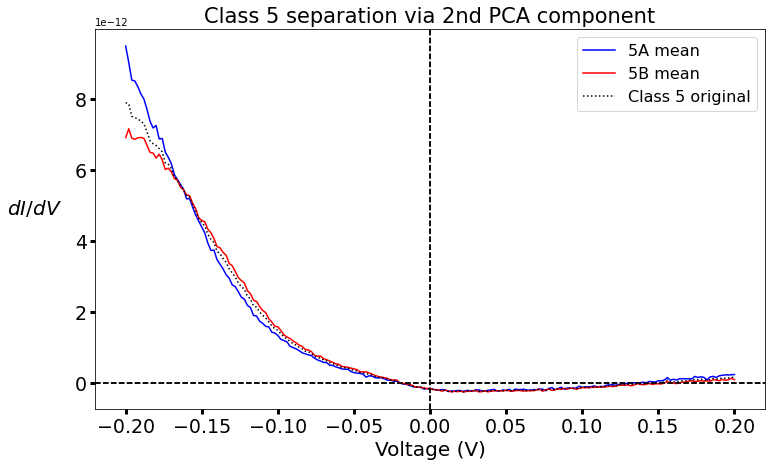

In [208]:
plt.figure(figsize=(12,7))
plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')


plt.tick_params(labelsize = 16)

plt.plot(z_axis,class5_pca1_a_mean, label = "5A mean", color = 'blue')
plt.plot(z_axis,class5_pca1_b_mean, label = "5B mean", color = 'r')
plt.plot(z_axis,class5_mean, color = 'k', ls = ':', label = 'Class 5 original')

plt.axvline(0,c='k',ls='--')
plt.axhline(0,c='k',ls='--')

plt.legend(fontsize = 16)
plt.legend(fontsize = 16)

plt.xlabel('Voltage (V)', size = 20);
plt.ylabel('$dI/dV$', size = 20, rotation = 0, labelpad = 40);
# plt.tick_params(axis='both', labelsize = 16)

plt.title("Class 5 separation via 2nd PCA component", fontsize = 21);

plt.tick_params(labelsize=19, width = 3, size = 5)
plt.tick_params(labelsize=19, width = 3, size = 5)


In [ ]:
crs = 6 # size of image to crop

imgstack_5a, com5a = extract_subimages(topo_f_n, Class5_PCA1_coords_a, crs)

imgstack_5b, com5b = extract_subimages(topo_f_n, Class5_PCA1_coords_b, crs)

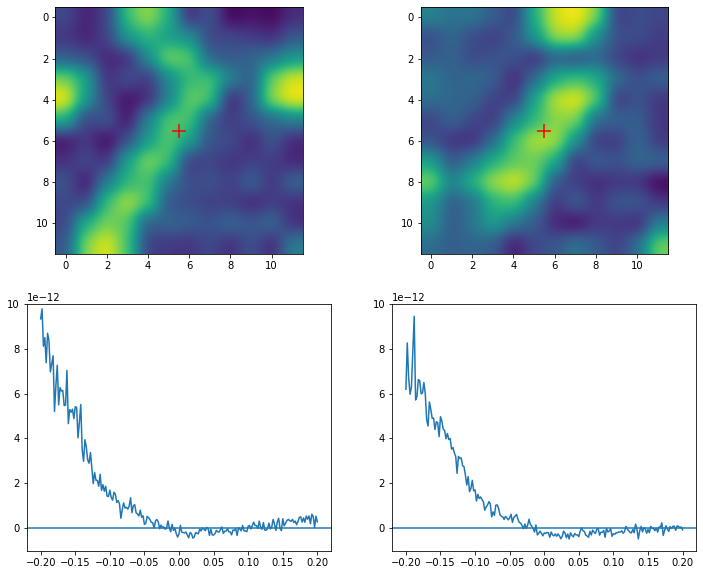

In [ ]:
k1 = 2 #  12
k2 = 1 # 6

f,a = plt.subplots(2,2,figsize=(12,10))
a[0,0].imshow(imgstack_5a[k1], interpolation = 'gaussian')
a[0,1].imshow(imgstack_5b[k2], interpolation = 'gaussian')
a[0,0].scatter(int(imgstack_5a.shape[2]/2)-0.5, int(imgstack_5a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)
a[0,1].scatter(int(imgstack_5a.shape[2]/2)-0.5, int(imgstack_5a.shape[1]/2)-0.5, marker = '+', c = 'r', s = 200)

a[1,0].plot(z_axis,exp_cits[int(round(com5a[k1,0])), int(round(com5a[k1,1])), :])
a[1,1].plot(z_axis,exp_cits[int(round(com5b[k2,0])), int(round(com5b[k2,1])), :])

a[1,0].set_ylim(-1E-12, 10E-12)
a[1,1].set_ylim(-1E-12, 10E-12)

a[1,0].axhline(0)
a[1,1].axhline(0)

## Collect classes

In [212]:
# Classes_by_PCA0 = [z_axis,
#                    class1_pca0_a_mean, class1_pca0_b_mean,
#                    class2_pca0_a_mean, class2_pca0_b_mean,
#                    class3_mean,
#                    class4_pca0_a_mean, class4_pca0_b_mean,
#                    class5_pca0_a_mean, class5_pca0_b_mean]

Classes_by_PCA1 = [z_axis,
                   class1_pca1_a_mean, class1_pca1_b_mean,
                   class2_pca1_a_mean, class2_pca1_b_mean,
                   class3_mean,
                   class4_pca1_a_mean, class4_pca1_b_mean,
                   class5_pca1_a_mean, class5_pca1_b_mean]


np.savez("PCA_classes",
         PCA1_Classes = Classes_by_PCA1,)  
                

And coordinates

In [ ]:
# Classes_Coords_PCA0 = [
#                        Class1_PCA0_coords_a, Class1_PCA0_coords_b,
#                        Class2_PCA0_coords_a, Class2_PCA0_coords_b,
#                        Class4_PCA0_coords_a, Class4_PCA0_coords_b,
#                        Class5_PCA0_coords_a, Class5_PCA0_coords_b
#                        ]

Classes_Coords_PCA1 = [
                       Class1_PCA1_coords_a, Class1_PCA1_coords_b,
                       Class2_PCA1_coords_a, Class2_PCA1_coords_b,
                       Class4_PCA1_coords_a, Class4_PCA1_coords_b,
                       Class5_PCA1_coords_a, Class5_PCA1_coords_b]


np.savez("PCA_coordinates",
         Classes_Coords_PCA1 = Classes_Coords_PCA1)  

# Compare to theoretical calculations

In [224]:
fname1 = "S_on_Co_surface_v1.xls"
fname2 = "Sn_on_Co_surface_v1.xls"
fname3 = "SnS_on_Co_surface.xls"

S_data = pd.read_excel(fname1, header = 1)
Sn_data = pd.read_excel(fname2, header = 1)
Sn_S_data = pd.read_excel(fname3, header = 2)

* Class 1- Isolated atoms: S or Sn

In [225]:
Class1_S_x, Class1_S_y = S_data['1S'], S_data['PDOS1']
Class1_Sn_x, Class1_Sn_y = Sn_data['1Sn'], Sn_data['PDOS1']

* Class 2- Dimers: S-S, Sn-Sn  
* (no combo calculations presently in calculation data)

In [226]:
Class2_S2_x, Class2_S2_y = S_data['2S'], S_data['PDOS2']
Class2_Sn2_x, Class2_Sn2_y = Sn_data['2Sn'], Sn_data['PDOS2']

* Class 3- 60 deg: S-S-S, Sn-Sn-Sn
* Other combos not present (this class is most unlikely anyway)

In [227]:
Class3_S3_x, Class3_S3_y = S_data['3S (triangular)'], S_data['PDOS5']
Class3_Sn3_x, Class3_Sn3_y = Sn_data['3Sn(triangular)'], Sn_data['PDOS5']

* Class 4 120 deg: combos only
* (??) There are no calculations for S3 or Sn3 @ 120 deg, only for line (180 deg) and triangle (60 deg)

In [228]:
Class4_conf1_S2Sn1_Sn_x, Class4_conf1_S2Sn1_Sn_y = Sn_S_data['str1_S2Sn1_Sn'], Sn_S_data['PDOS1']
Class4_conf1_S2Sn1_S_x,  Class4_conf1_S2Sn1_S_y = Sn_S_data['str1_S2Sn1_S'], Sn_S_data['PDOS2']
Class4_conf2_S2Sn1_Sn_x, Class4_conf2_S2Sn1_Sn_y = Sn_S_data['str2_S2Sn1_Sn'], Sn_S_data['PDOS3']
Class4_conf2_S2Sn1_S1_x, Class4_conf2_S2Sn1_S1_y = Sn_S_data['str2_S2Sn1_S1'], Sn_S_data['PDOS4']
Class4_conf2_S2Sn1_S2_x, Class4_conf2_S2Sn1_S2_y = Sn_S_data['str2_S2Sn1_S2'], Sn_S_data['PDOS5']


Class4_conf1_Sn2S1_Sn_x,  Class4_conf1_Sn2S1_Sn_y = Sn_S_data['str1_Sn2S1_Sn'], Sn_S_data['PDOS6']
Class4_conf1_Sn2S1_S_x,   Class4_conf1_Sn2S1_S_y = Sn_S_data['str1_Sn2S1_S'], Sn_S_data['PDOS7']
Class4_conf2_Sn2S1_S_x,   Class4_conf2_Sn2S1_S_y = Sn_S_data['str2_Sn2S1_S'], Sn_S_data['PDOS8']
Class4_conf2_Sn2S1_Sn1_x, Class4_conf2_Sn2S1_Sn1_y = Sn_S_data['str2_Sn2S1_Sn1'], Sn_S_data['PDOS9']
Class4_conf2_Sn2S1_Sn2_x, Class4_conf2_Sn2S1_Sn2_y = Sn_S_data['str2_Sn2S1_Sn2'], Sn_S_data['PDOS10']

* Class 5- 180 deg (line): S-S-S, Sn-Sn-Sn

In [229]:
Class5_S3_MID_x, CLass5_S3_MID_y = S_data['3S-middle(line)'], S_data['PDOS3']
Class5_S3_END_x, CLass5_S3_END_y = S_data['3S-edge(line)'], S_data['PDOS4']

Class5_Sn3_MID_x, CLass5_Sn3_MID_y = Sn_data['3Sn-middle(line)'], Sn_data['PDOS3']
Class5_Sn3_END_x, CLass5_Sn3_END_y = Sn_data['3Sn-edge(line)'], Sn_data['PDOS4']

In [ ]:
# Coords_PCA0_C1_a = Checkpointload['Class1_PCA0_coords_a']
# Coords_PCA0_C1_b = Checkpointload['Class1_PCA0_coords_b']
# Coords_PCA0_C2_a = Checkpointload['Class2_PCA0_coords_a']
# Coords_PCA0_C2_b = Checkpointload['Class2_PCA0_coords_b']
# Coords_PCA0_C4_a = Checkpointload['Class4_PCA0_coords_a']
# Coords_PCA0_C4_b = Checkpointload['Class4_PCA0_coords_b']
# Coords_PCA0_C5_a = Checkpointload['Class5_PCA0_coords_a']
# Coords_PCA0_C5_b = Checkpointload['Class5_PCA0_coords_b']

In [232]:
Coords_PCA1_C1_a = Class1_PCA1_coords_a
Coords_PCA1_C1_b = Class1_PCA1_coords_b
Coords_PCA1_C2_a = Class2_PCA1_coords_a
Coords_PCA1_C2_b = Class2_PCA1_coords_b
Coords_PCA1_C4_a = Class4_PCA1_coords_a
Coords_PCA1_C4_b = Class4_PCA1_coords_b
Coords_PCA1_C5_a = Class5_PCA1_coords_a
Coords_PCA1_C5_b = Class5_PCA1_coords_b

# Class1_PCA1_coords_a

In [ ]:



# PCA0_C1_A, PCA0_C1_B =  specload["PCA0_Classes"][1], specload["PCA0_Classes"][2]
# PCA0_C2_A, PCA0_C2_B =  specload["PCA0_Classes"][3], specload["PCA0_Classes"][4]
# PCA0_C3 =  specload["PCA0_Classes"][5]
# PCA0_C4_A, PCA0_C4_B =  specload["PCA0_Classes"][6], specload["PCA0_Classes"][7]
# PCA0_C5_A, PCA0_C5_B =  specload["PCA0_Classes"][8], specload["PCA0_Classes"][9]

In [235]:
Z = Classes_by_PCA1[0]

PCA1_C1_A, PCA1_C1_B =  Classes_by_PCA1[1], Classes_by_PCA1[2]
PCA1_C2_A, PCA1_C2_B =  Classes_by_PCA1[3], Classes_by_PCA1[4]
PCA1_C3 =  Classes_by_PCA1[5]
PCA1_C4_A, PCA1_C4_B =  Classes_by_PCA1[6], Classes_by_PCA1[7]
PCA1_C5_A, PCA1_C5_B =  Classes_by_PCA1[8], Classes_by_PCA1[9]

In [238]:
didv = np.copy(exp_cits)
iv = np.copy(IV)
exp_z_axis = np.copy(z_axis)

In [239]:
# check the coords work

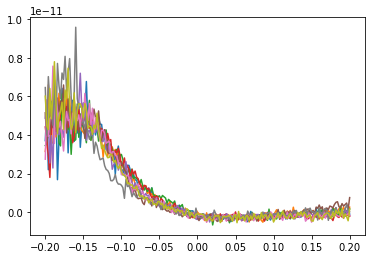

In [240]:
for k in range(len(Coords_PCA1_C1_a)):
  plt.plot(exp_z_axis, didv[Coords_PCA1_C1_a[k][0], Coords_PCA1_C1_a[k][1]])

## Convert experimental data to LDOS

* $DOS = (dI/dV) / (I/V)$

* We have the coordinates for each PCA component
* Use the (x,y) coordinate to get all the dI/dV AND current values for each component (there will be somewhere between 30 and 300 or so pairs)
* Average these to find the dI/dV and the I values to use.

In [241]:
def Get_avg_spectra(coords, v_axis, didv, iv):
  temp_didv = np.zeros((len(coords),len(v_axis)))
  temp_iv = np.zeros_like(temp_didv)
  for k in range(len(coords)):
    temp_didv[k] = didv[coords[k][0], coords[k][1]]
    temp_iv[k] = iv[coords[k][0], coords[k][1]]
  didv_avg = np.mean(temp_didv, axis = 0)
  iv_avg =  np.mean(temp_iv, axis = 0)

  return didv_avg, iv_avg

In [ ]:
# PCA0_C1a_didv, PCA0_C1a_iv = Get_avg_spectra(Coords_PCA0_C1_a, exp_z_axis, didv, iv)
# PCA0_C1b_didv, PCA0_C1b_iv = Get_avg_spectra(Coords_PCA0_C1_b, exp_z_axis, didv, iv)
# PCA0_C2a_didv, PCA0_C2a_iv = Get_avg_spectra(Coords_PCA0_C2_a, exp_z_axis, didv, iv)
# PCA0_C2b_didv, PCA0_C2b_iv = Get_avg_spectra(Coords_PCA0_C2_b, exp_z_axis, didv, iv)
# PCA0_C4a_didv, PCA0_C4a_iv = Get_avg_spectra(Coords_PCA0_C4_a, exp_z_axis, didv, iv)
# PCA0_C4b_didv, PCA0_C4b_iv = Get_avg_spectra(Coords_PCA0_C4_b, exp_z_axis, didv, iv)
# PCA0_C5a_didv, PCA0_C5a_iv = Get_avg_spectra(Coords_PCA0_C5_a, exp_z_axis, didv, iv)
# PCA0_C5b_didv, PCA0_C5b_iv = Get_avg_spectra(Coords_PCA0_C5_b, exp_z_axis, didv, iv)

In [242]:
PCA1_C1a_didv, PCA1_C1a_iv = Get_avg_spectra(Coords_PCA1_C1_a, exp_z_axis, didv, iv)
PCA1_C1b_didv, PCA1_C1b_iv = Get_avg_spectra(Coords_PCA1_C1_b, exp_z_axis, didv, iv)
PCA1_C2a_didv, PCA1_C2a_iv = Get_avg_spectra(Coords_PCA1_C2_a, exp_z_axis, didv, iv)
PCA1_C2b_didv, PCA1_C2b_iv = Get_avg_spectra(Coords_PCA1_C2_b, exp_z_axis, didv, iv)
PCA1_C4a_didv, PCA1_C4a_iv = Get_avg_spectra(Coords_PCA1_C4_a, exp_z_axis, didv, iv)
PCA1_C4b_didv, PCA1_C4b_iv = Get_avg_spectra(Coords_PCA1_C4_b, exp_z_axis, didv, iv)
PCA1_C5a_didv, PCA1_C5a_iv = Get_avg_spectra(Coords_PCA1_C5_a, exp_z_axis, didv, iv)
PCA1_C5b_didv, PCA1_C5b_iv = Get_avg_spectra(Coords_PCA1_C5_b, exp_z_axis, didv, iv)

In [ ]:
# Let's begin with PCA1

In [ ]:
PCA1_C1_A.shape

(201,)

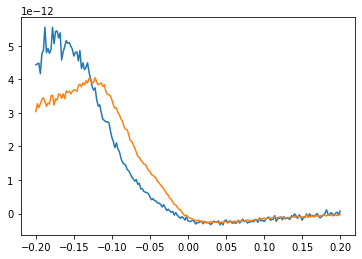

In [243]:
plt.plot(exp_z_axis, PCA1_C1a_didv)
plt.plot(exp_z_axis, PCA1_C1b_didv)

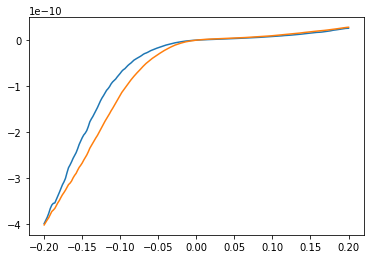

In [244]:
plt.plot(exp_z_axis, PCA1_C1a_iv)
plt.plot(exp_z_axis, PCA1_C1b_iv)

In [ ]:
# "fix up" the dI/dV and the IV

In [245]:
# Apply scaling factors to dI/dV (and slight offset to ensure non-zero @ zero) -- these factors are specific to this dataset

factor1 = 0.72    
offset1 = 0.25E-12

Ndidv_c1a = PCA1_C1a_didv*factor1 + offset1
Ndidv_c1b = PCA1_C1b_didv*factor1 + offset1
Ndidv_c2a = PCA1_C2a_didv*factor1 + offset1
Ndidv_c2b = PCA1_C2b_didv*factor1 + offset1
Ndidv_c4a = PCA1_C4a_didv*factor1 + offset1
Ndidv_c4b = PCA1_C4b_didv*factor1 + offset1
Ndidv_c5a = PCA1_C5a_didv*factor1 + offset1
Ndidv_c5b = PCA1_C5b_didv*factor1 + offset1

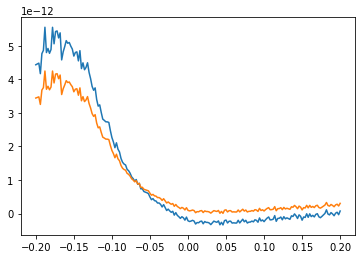

In [246]:
plt.plot(exp_z_axis, PCA1_C1a_didv)
plt.plot(exp_z_axis, Ndidv_c1a)

In [ ]:
# Now fix the IV.. by:

# 1) smoothing it
# 2) offseting everything by small value (idk where this value comes from either...)
# 3) also, I think in the voltage axis there is not a zero voltage, just a very small value there (0 becomes some small value ~ E-14 somehow)

# Why did we not smooth the dI/dV also??? what is going on here

In [ ]:
# No, not quite the offset here, but rather go to zero bias, which is value 100, and we should have a current of zero here. and it should be smoothly

In [247]:
def correct_zero(spectrum, smoothingfactor, v_axis):
  zero = np.argmin(np.abs(v_axis))
  p, n = zero+1, zero-1
  cp, cn = spectrum[p], spectrum[n]
  filtered_spectrum = ndimage.gaussian_filter(spectrum, smoothingfactor)
  corrected_spectrum = filtered_spectrum - cp +(cp-cn)/2

  return corrected_spectrum

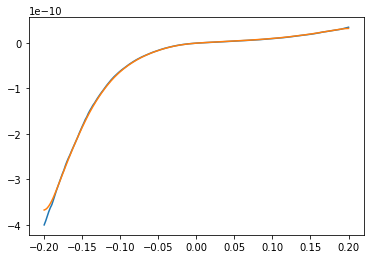

In [248]:
smoothing = 5
test_correction = correct_zero(PCA1_C2a_iv, smoothing, exp_z_axis)

plt.plot(exp_z_axis, PCA1_C2a_iv)
plt.plot(exp_z_axis, test_correction)

In [249]:
smoothing = 5

Niv_c1a = correct_zero(PCA1_C1a_iv, smoothing, exp_z_axis)
Niv_c1b = correct_zero(PCA1_C1b_iv, smoothing, exp_z_axis)
Niv_c2a = correct_zero(PCA1_C2a_iv, smoothing, exp_z_axis)
Niv_c2b = correct_zero(PCA1_C2b_iv, smoothing, exp_z_axis)
Niv_c4a = correct_zero(PCA1_C4a_iv, smoothing, exp_z_axis)
Niv_c4b = correct_zero(PCA1_C4b_iv, smoothing, exp_z_axis)
Niv_c5a = correct_zero(PCA1_C5a_iv, smoothing, exp_z_axis)
Niv_c5b = correct_zero(PCA1_C5b_iv, smoothing, exp_z_axis)

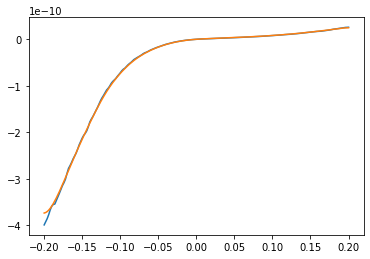

In [250]:
plt.plot(exp_z_axis, PCA1_C1a_iv)
plt.plot(exp_z_axis, Niv_c1a)

## Calculate DOS:

$DOS = dI/dV * (I / V)$

* Also, correct the singularity @ zero  
  * Just set the V = 0 (and nearby points) to NaN value

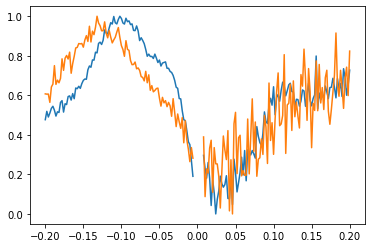

In [251]:
DOS_c1a_ = Ndidv_c1a / Niv_c1a * exp_z_axis
DOS_c1b_ = Ndidv_c1b / Niv_c1b * exp_z_axis
DOS_c2a_ = Ndidv_c2a / Niv_c2a * exp_z_axis
DOS_c2b_ = Ndidv_c2b / Niv_c2b * exp_z_axis
DOS_c4a_ = Ndidv_c4a / Niv_c4a * exp_z_axis
DOS_c4b_ = Ndidv_c4b / Niv_c4b * exp_z_axis
DOS_c5a_ = Ndidv_c5a / Niv_c5a * exp_z_axis
DOS_c5b_ = Ndidv_c5b / Niv_c5b * exp_z_axis

# Fix singularity effects

DOS_c1a_[98:104] = np.nan
DOS_c1b_[98:104] = np.nan
DOS_c2a_[98:104] = np.nan
DOS_c2b_[98:104] = np.nan
DOS_c4a_[98:104] = np.nan
DOS_c4b_[98:104] = np.nan
DOS_c5a_[98:104] = np.nan
DOS_c5b_[98:104] = np.nan

# Normalize to [0,1] scale

DOS_c1a = (DOS_c1a_ - np.nanmin(DOS_c1a_))/(np.nanmax(DOS_c1a_) - np.nanmin(DOS_c1a_))
DOS_c1b = (DOS_c1b_ - np.nanmin(DOS_c1b_))/(np.nanmax(DOS_c1b_) - np.nanmin(DOS_c1b_))
DOS_c2a = (DOS_c2a_ - np.nanmin(DOS_c2a_))/(np.nanmax(DOS_c2a_) - np.nanmin(DOS_c2a_))
DOS_c2b = (DOS_c2b_ - np.nanmin(DOS_c2b_))/(np.nanmax(DOS_c2b_) - np.nanmin(DOS_c2b_))
DOS_c4a = (DOS_c4a_ - np.nanmin(DOS_c4a_))/(np.nanmax(DOS_c4a_) - np.nanmin(DOS_c4a_))
DOS_c4b = (DOS_c4b_ - np.nanmin(DOS_c4b_))/(np.nanmax(DOS_c4b_) - np.nanmin(DOS_c4b_))
DOS_c5a = (DOS_c5a_ - np.nanmin(DOS_c5a_))/(np.nanmax(DOS_c5a_) - np.nanmin(DOS_c5a_))
DOS_c5b = (DOS_c5b_ - np.nanmin(DOS_c5b_))/(np.nanmax(DOS_c5b_) - np.nanmin(DOS_c5b_))

plt.plot(exp_z_axis, DOS_c1b)
plt.plot(exp_z_axis, DOS_c1a)

## Color definitions

# Compare ML spec and PDOS calcs

In [252]:
colors = ['DarkOrange', 'mediumseagreen', 'blueViolet', 'Crimson', 'dodgerblue', 'gold']

### Class 1 compare
* Can't really do comparison here because the class 1 ML stuff was just MISCLASSIFIED so shouldn't really analyze this.

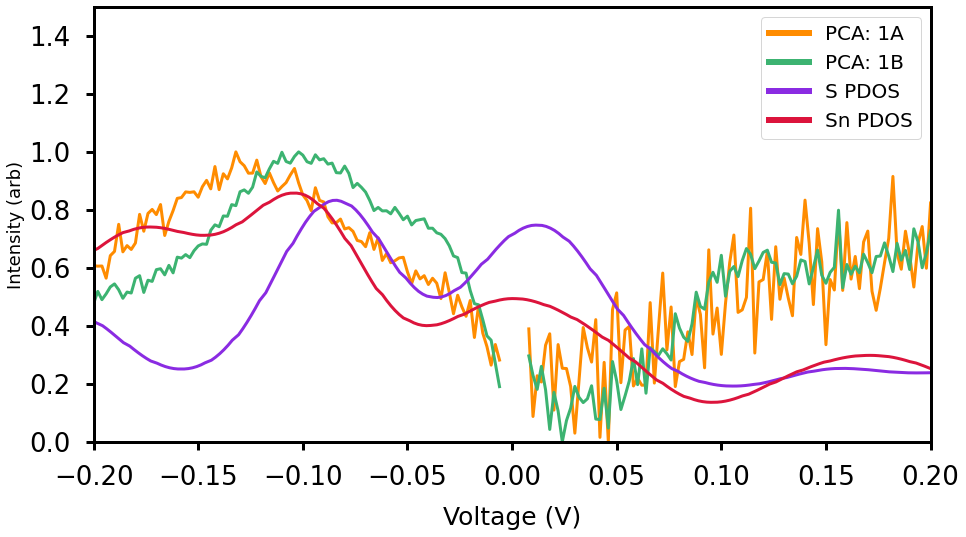

In [253]:
scale = 2

fig,ax = plt.subplots(1,figsize=(15,8))

ax.plot(exp_z_axis, DOS_c1a, label = 'PCA: 1A', color = colors[0], lw = 3)
ax.plot(exp_z_axis, DOS_c1b, label = 'PCA: 1B', color = colors[1], lw = 3)

ax.plot(Class1_S_x, Class1_S_y*scale, label = 'S PDOS', color = colors[2], lw = 3)
ax.plot(Class1_Sn_x, Class1_Sn_y*scale, label = 'Sn PDOS', color = colors[3], lw = 3)

ax.set_xlim(-0.2,0.2)
ax.set_ylim(0,1.5)

ax.axhline(0, color ='k')

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

ax.set_xlabel("Voltage (V)", fontsize = 25, labelpad = 15)
ax.set_ylabel("Intensity (arb)", fontsize = 18)
ax.tick_params(labelsize = 26, pad = 15, length = 8, width = 3)

leg = ax.legend(fontsize=20)
for line in leg.get_lines():
    line.set_linewidth(6)

### Class 2 compare

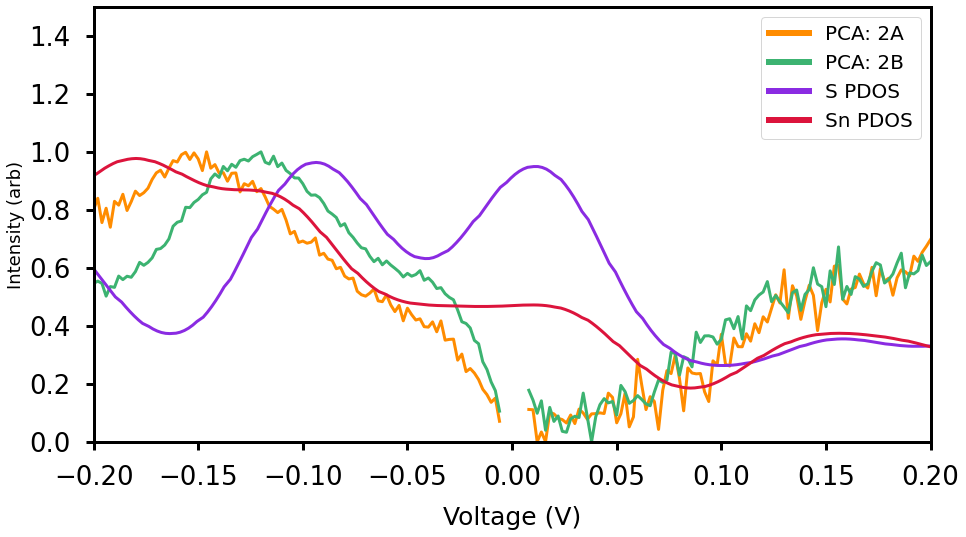

In [254]:
scale = 2.7

fig,ax = plt.subplots(1,figsize=(15,8))

ax.plot(exp_z_axis, DOS_c2a, label = 'PCA: 2A', color = colors[0], lw = 3)
ax.plot(exp_z_axis, DOS_c2b, label = 'PCA: 2B', color = colors[1], lw = 3)
ax.plot(Class2_S2_x, Class2_S2_y*scale, label = 'S PDOS', color = colors[2], lw = 3)
ax.plot(Class2_Sn2_x, Class2_Sn2_y*scale, label = 'Sn PDOS', color = colors[3], lw = 3)

ax.set_xlim(-0.2,0.2)
ax.set_ylim(0,1.5)

ax.axhline(0, color ='k')

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

ax.set_xlabel("Voltage (V)", fontsize = 25, labelpad = 15)
ax.set_ylabel("Intensity (arb)", fontsize = 18)
ax.tick_params(labelsize = 26, pad = 15, length = 8, width = 3)

leg = ax.legend(fontsize=20)
for line in leg.get_lines():
    line.set_linewidth(6)




### Class 3
*  there were only a few triangular configurations anyway. But, we can maybe try to say whether they are S or Sn?

In [255]:
colors = ['DarkOrange', 'mediumseagreen', 'blueViolet', 'Crimson', 'dodgerblue', 'gold']

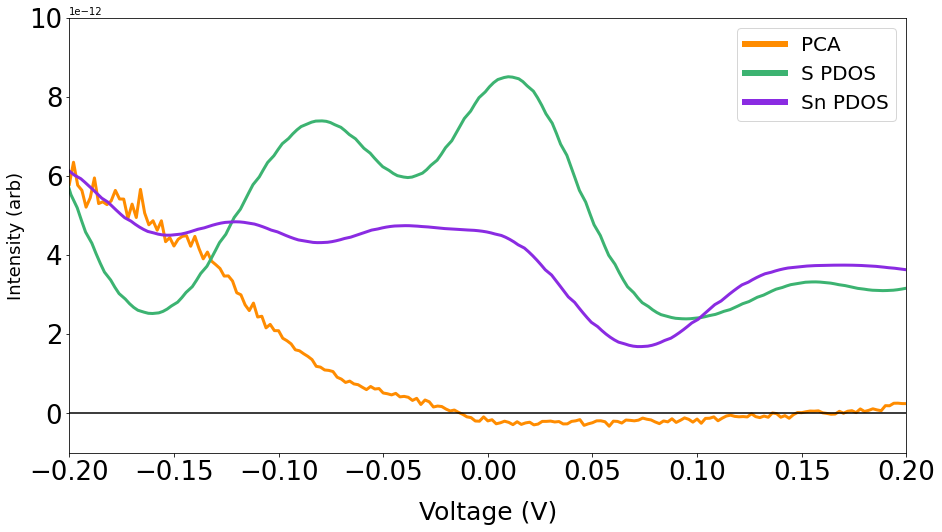

In [256]:
scale = 2.5E-11


plt.figure(figsize=(15,8))
# plt.plot(exp_z_axis, PCA0_C2_A)
# plt.plot(exp_z_axis, PCA0_C2_B)
plt.plot(exp_z_axis, PCA1_C3, label = 'PCA', color = colors[0], lw = 3)

plt.plot(Class3_S3_x, Class3_S3_y*scale, label = 'S PDOS', color = colors[1], lw = 3)
plt.plot(Class3_Sn3_x, Class3_Sn3_y*scale, label = 'Sn PDOS', color = colors[2], lw = 3)

plt.xlim(-0.2,0.2)
plt.ylim(-1E-12,1E-11)

plt.axhline(0, color ='k')

plt.xlabel("Voltage (V)", fontsize = 25, labelpad = 15)
plt.ylabel("Intensity (arb)", fontsize = 18)
plt.tick_params(labelsize = 26)

leg = plt.legend(fontsize=20)
for line in leg.get_lines():
    line.set_linewidth(6)

### Class 4 compare


* Remember I only want the CENTER ATOM IN THESE!!!

In [257]:
colors = ['DarkOrange', 'mediumseagreen', 'blueViolet', 'Crimson', 'dodgerblue', 'gold']

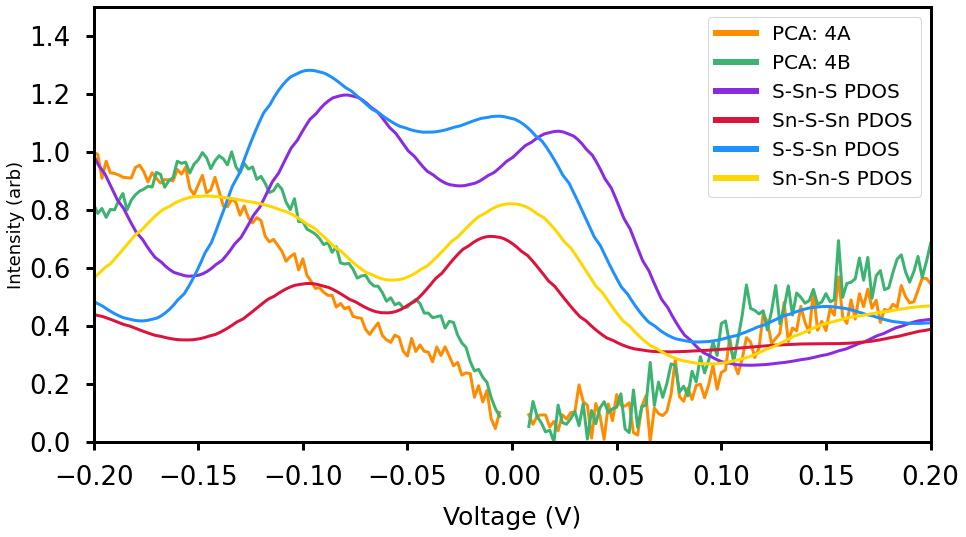

In [263]:
scale = 3.5

fig,ax = plt.subplots(1,figsize=(15,8))

ax.plot(exp_z_axis, DOS_c4a, label = 'PCA: 4A', color = colors[0], lw = 3)
ax.plot(exp_z_axis, DOS_c4b, label = 'PCA: 4B', color = colors[1], lw = 3)

ax.plot(Class4_conf1_S2Sn1_Sn_x,Class4_conf1_S2Sn1_Sn_y*scale, label = 'S-Sn-S PDOS', color = colors[2], lw = 3)
ax.plot(Class4_conf1_Sn2S1_S_x,Class4_conf1_Sn2S1_S_y*scale, label = 'Sn-S-Sn PDOS', color = colors[3], lw = 3)
ax.plot(Class4_conf2_S2Sn1_S2_x, Class4_conf2_S2Sn1_S2_y*scale, label = 'S-S-Sn PDOS', color = colors[4], lw = 3)
ax.plot(Class4_conf2_Sn2S1_Sn2_x,Class4_conf2_Sn2S1_Sn2_y*scale, label = 'Sn-Sn-S PDOS', color = colors[5], lw = 3)

ax.set_xlim(-0.2,0.2)
ax.set_ylim(0,1.5)

ax.axhline(0, color ='k')

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

ax.set_xlabel("Voltage (V)", fontsize = 25, labelpad = 15)
ax.set_ylabel("Intensity (arb)", fontsize = 18)
ax.tick_params(labelsize = 26, pad = 15, length = 8, width = 3)

leg = ax.legend(fontsize=20)
for line in leg.get_lines():
    line.set_linewidth(6)

### Class 5 compare

In [264]:
colors = ['DarkOrange', 'mediumseagreen', 'blueViolet', 'Crimson', 'dodgerblue', 'gold']

* Actually the ML analysis has nothing to do with "Ends" so only look at middles

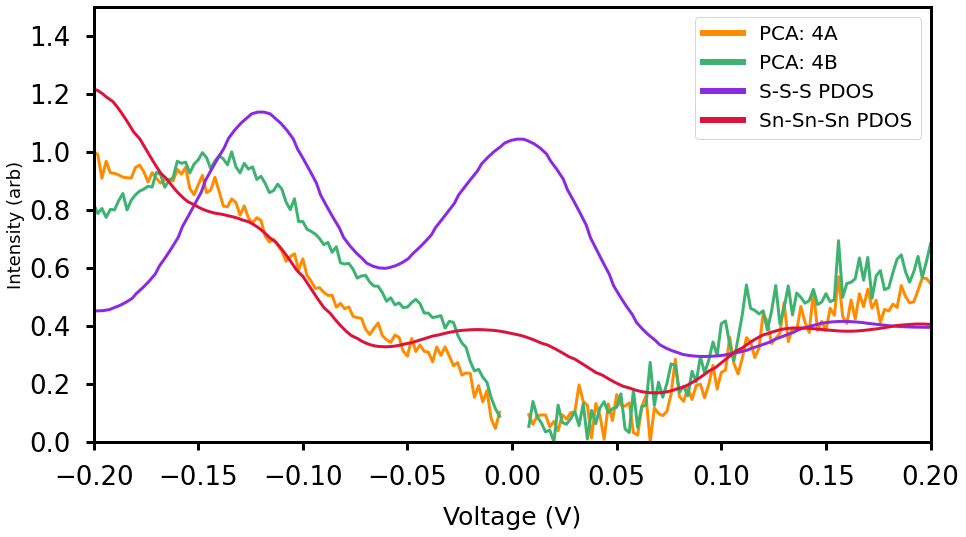

In [268]:

scale = 3.

fig,ax = plt.subplots(1,figsize=(15,8))

ax.plot(exp_z_axis, DOS_c4a, label = 'PCA: 4A', color = colors[0], lw = 3)
ax.plot(exp_z_axis, DOS_c4b, label = 'PCA: 4B', color = colors[1], lw = 3)

ax.plot(Class5_S3_MID_x, CLass5_S3_MID_y*scale, label = 'S-S-S PDOS', color = colors[2], lw = 3)
ax.plot(Class5_Sn3_MID_x, CLass5_Sn3_MID_y*scale, label = 'Sn-Sn-Sn PDOS', color = colors[3], lw = 3)

ax.set_xlim(-0.2,0.2)
ax.set_ylim(0,1.5)

ax.axhline(0, color ='k')

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

ax.set_xlabel("Voltage (V)", fontsize = 25, labelpad = 15)
ax.set_ylabel("Intensity (arb)", fontsize = 18)
ax.tick_params(labelsize = 26, pad = 15, length = 8, width = 3)

leg = ax.legend(fontsize=20)
for line in leg.get_lines():
    line.set_linewidth(6)











# PCA fitting / reconstructions

In [269]:
data = didv
energy_ax = exp_z_axis

In [270]:
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

X_vec = np.copy(data.reshape((data.shape[0]*data.shape[1],data.shape[2])))

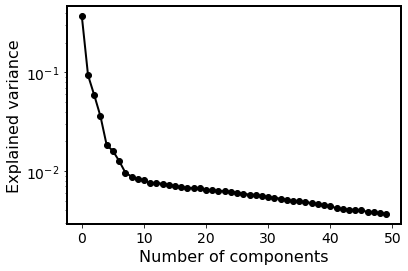

In [272]:
ax = plt.gca()

pca = decomposition.PCA()
pca.fit(X_vec)
#plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:50], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(2)

plt.yscale('log')

In [273]:
X_vec.max()

2.8983596e-10

## 2 Components

In [304]:
data = np.copy(didv)

data = (data - np.min(data))/np.ptp(data)   # NORMALIZE!
energy_ax = exp_z_axis
data.min(), data.max()

(0.0, 1.0)

In [305]:
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

X_vec = np.copy(data.reshape((data.shape[0]*data.shape[1],data.shape[2])))

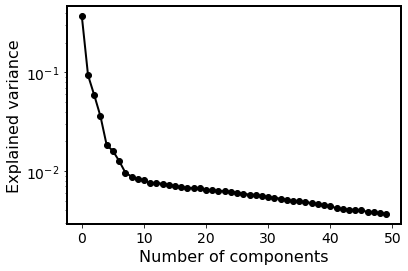

In [306]:
ax = plt.gca()

pca = decomposition.PCA()
pca.fit(X_vec)
#plt.figure(figsize=(6, 4), dpi = 96)
plt.plot(pca.explained_variance_ratio_[0:50], '-o', linewidth=2, c = 'black')
plt.xlabel('Number of components', fontsize = 16)
plt.ylabel('Explained variance', fontsize = 16)

plt.tick_params(labelsize = 14)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(2)

plt.yscale('log')

In [307]:
# Select number of components
nc = 2

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(2, 201) (16384, 2)


NUMBER OF COMPONENTS: 2
Components...


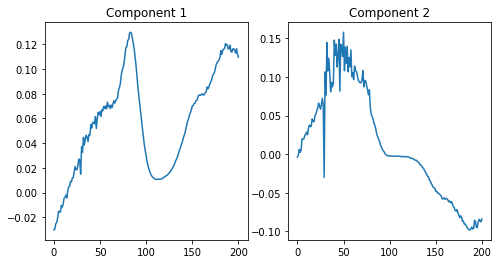

Abundance maps...


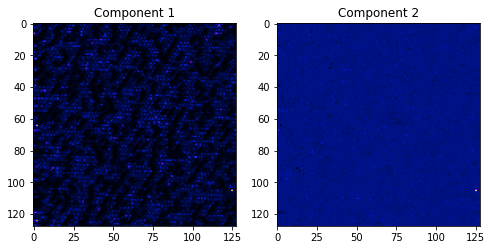

In [308]:
rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

print('NUMBER OF COMPONENTS: ' + str(nc))
print('Components...')
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(components[i])
    ax1.set_title('Component ' + str(i + 1))
plt.show()

print('Abundance maps...')
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = Cmap_Blackbody)
    ax2.set_title('Component ' + str(i + 1))
plt.show()

In [309]:
Reconstruction = np.zeros((d1,d2,d3))
Reconstruction.shape

(128, 128, 201)

In [310]:
abundancemaps = np.zeros((nc, d1, d2))
for L in range(nc):
  abundancemaps[L] = X_vec_t[:, L].reshape(d1, d2)

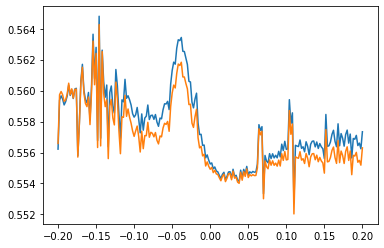

In [311]:
ii,jj = 0,0
res = data[ii,jj] - (abundancemaps[0][ii,jj]*components[0] + 
                     abundancemaps[1][ii,jj]*components[1])

plt.plot(exp_z_axis, res)
plt.plot(exp_z_axis, data[ii,jj])

In [312]:
for ii in range(Reconstruction.shape[0]):
  for jj in range(Reconstruction.shape[1]):
    res = data[ii,jj] - (abundancemaps[0][ii,jj]*components[0] + 
                         abundancemaps[1][ii,jj]*components[1])
    Reconstruction[ii,jj] = res

Get the Error:

* take MSE for EACH pixel's spectra (input and encoded), and create map

In [313]:
# Here is an example...
input_data = np.copy(data)

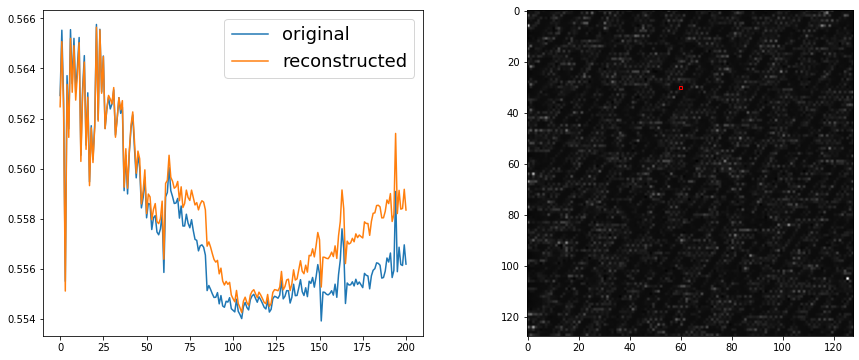

In [316]:
ii,jj = 30,60

fig,ax = plt.subplots(1,2,figsize=(15,6))

ax[0].plot(input_data[ii,jj,:], label = 'original')
ax[0].plot(Reconstruction[ii,jj,:], label = 'reconstructed')

ax[1].imshow(np.mean(input_data,axis=2), cmap = 'gray')
ax[1].add_patch(patches.Rectangle((jj-0.5,ii-0.5), 1,1, color = 'r', fill = False))

ax[0].legend(fontsize = 18)

In [319]:
error = np.zeros((Reconstruction.shape[0], Reconstruction.shape[1]))
for ii in range(error.shape[0]):
  for jj in range(error.shape[1]):
    error[ii,jj] = MSE(input_data[ii,jj], Reconstruction[ii,jj])

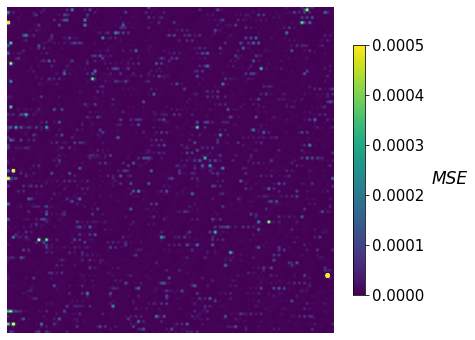

In [320]:
_,ax = plt.subplots(1,figsize=(7,6))
im = ax.imshow(error, vmin = 0, vmax = 0.0005)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.032, pad = 0.05)
cb.ax.tick_params(labelsize=15) 
cb.set_label("MSE", style = "italic", labelpad = 25, size = 17, rotation = 0)

## 3 Components

In [321]:
data = np.copy(didv)

# NORMALIZE!!!!!!

data = (data - np.min(data))/np.ptp(data)
energy_ax = exp_z_axis
data.min(), data.max()

(0.0, 1.0)

In [322]:
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

X_vec = np.copy(data.reshape((data.shape[0]*data.shape[1],data.shape[2])))

In [323]:
# Select number of components
nc = 3

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(3, 201) (16384, 3)


NUMBER OF COMPONENTS: 3
Components...


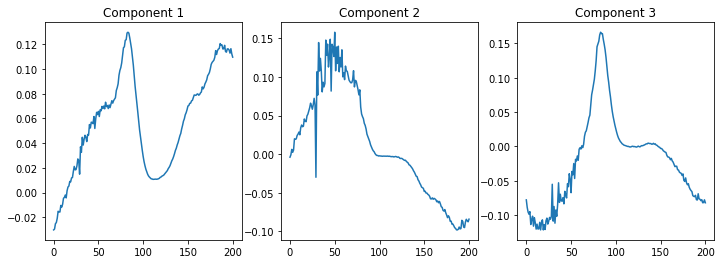

Abundance maps...


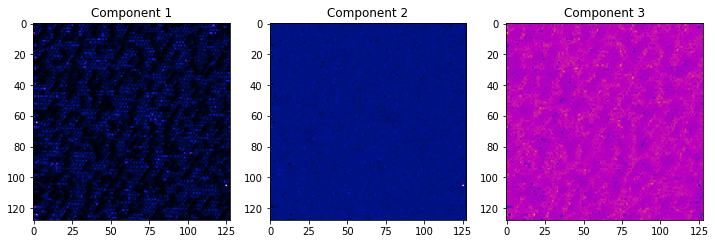

In [324]:
rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

print('NUMBER OF COMPONENTS: ' + str(nc))
print('Components...')
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(components[i])
    ax1.set_title('Component ' + str(i + 1))
plt.show()

print('Abundance maps...')
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = Cmap_Blackbody)
    ax2.set_title('Component ' + str(i + 1))
plt.show()

In [325]:
Reconstruction = np.zeros((d1,d2,d3))
Reconstruction.shape

(128, 128, 201)

In [326]:
abundancemaps = np.zeros((nc, d1, d2))
for L in range(nc):
  abundancemaps[L] = X_vec_t[:, L].reshape(d1, d2)

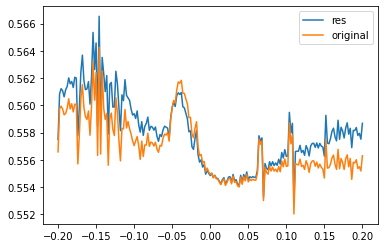

In [327]:
ii,jj = 0,0
res = data[ii,jj] - (abundancemaps[0][ii,jj]*components[0] + 
                     abundancemaps[1][ii,jj]*components[1] +
                     abundancemaps[2][ii,jj]*components[2])

plt.plot(exp_z_axis, res, label = 'res')
plt.plot(exp_z_axis, data[ii,jj], label = 'original')

plt.legend()

In [328]:
stuff = np.zeros((nc, data.shape[2]))
for L in range(nc):
  stuff[L] = abundancemaps[L][ii,jj]*components[L]
stuffsum = np.sum(stuff,axis=0)

In [329]:
# components[L]

In [330]:
stuffsum.shape

(201,)

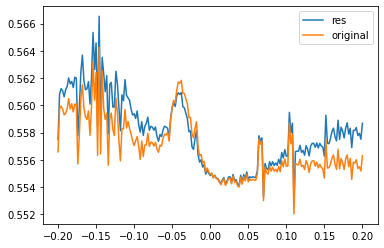

In [331]:
test = data[ii,jj] - stuffsum
plt.plot(exp_z_axis, test, label = 'res')
plt.plot(exp_z_axis, data[ii,jj], label = 'original')

plt.legend()

In [332]:
for ii in range(Reconstruction.shape[0]):
  for jj in range(Reconstruction.shape[1]):
    PC = np.zeros((nc, data.shape[2]))
    for L in range(nc):
      PC[L] = abundancemaps[L][ii,jj]*components[L]
    PCsum = np.sum(PC,axis=0)
    res = data[ii,jj] - PCsum
    Reconstruction[ii,jj] = res

In [333]:
Reconstruction.shape

(128, 128, 201)

Get the Error:

* take MSE for EACH pixel's spectra (input and encoded), and create map

In [334]:
# Here is an example...
input_data = np.copy(data)

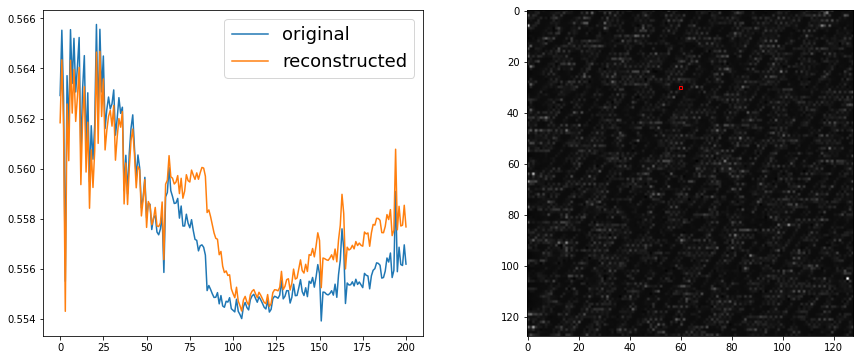

In [335]:
ii,jj = 30,60

fig,ax = plt.subplots(1,2,figsize=(15,6))

ax[0].plot(input_data[ii,jj,:], label = 'original')
ax[0].plot(Reconstruction[ii,jj,:], label = 'reconstructed')

ax[1].imshow(np.mean(input_data,axis=2), cmap = 'gray')
ax[1].add_patch(patches.Rectangle((jj-0.5,ii-0.5), 1,1, color = 'r', fill = False))

ax[0].legend(fontsize = 18)

In [337]:
error3 = np.zeros((Reconstruction.shape[0], Reconstruction.shape[1]))
for ii in range(error.shape[0]):
  for jj in range(error.shape[1]):
    error3[ii,jj] = MSE(input_data[ii,jj], Reconstruction[ii,jj])

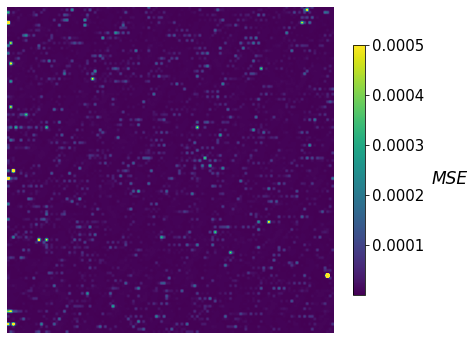

In [343]:
_,ax = plt.subplots(1,figsize=(7,6))
im = ax.imshow(error3, vmax = 0.0005)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.032, pad = 0.05)
cb.ax.tick_params(labelsize=15) 
cb.set_label("MSE", style = "italic", labelpad = 25, size = 17, rotation = 0)

## 4 Components

In [344]:
data = np.copy(didv)

# NORMALIZE!!!!!!

data = (data - np.min(data))/np.ptp(data)
energy_ax = exp_z_axis
data.min(), data.max()

(0.0, 1.0)

In [345]:
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

X_vec = np.copy(data.reshape((data.shape[0]*data.shape[1],data.shape[2])))

In [346]:
# Select number of components
nc = 4

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(4, 201) (16384, 4)


NUMBER OF COMPONENTS: 4
Components...


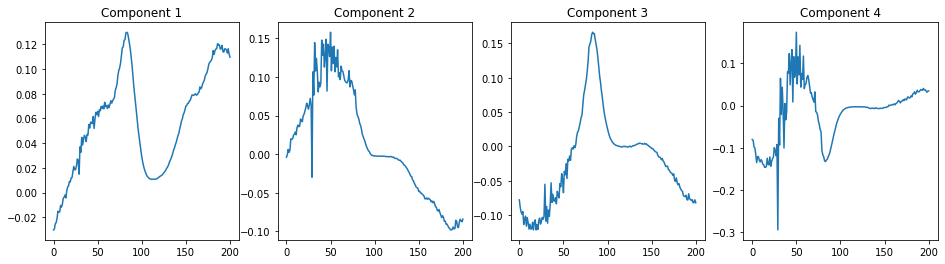

Abundance maps...


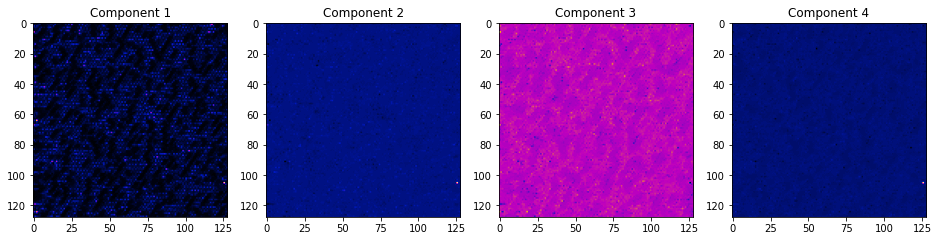

In [347]:
rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

print('NUMBER OF COMPONENTS: ' + str(nc))
print('Components...')
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(components[i])
    ax1.set_title('Component ' + str(i + 1))
plt.show()

print('Abundance maps...')
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = Cmap_Blackbody)
    ax2.set_title('Component ' + str(i + 1))
plt.show()

In [348]:
Reconstruction = np.zeros((d1,d2,d3))
Reconstruction.shape

(128, 128, 201)

In [349]:
abundancemaps = np.zeros((nc, d1, d2))
for L in range(nc):
  abundancemaps[L] = X_vec_t[:, L].reshape(d1, d2)
abundancemaps.shape

(4, 128, 128)

In [350]:
for ii in range(Reconstruction.shape[0]):
  for jj in range(Reconstruction.shape[1]):
    PC = np.zeros((nc, data.shape[2]))
    for L in range(nc):
      PC[L] = abundancemaps[L][ii,jj]*components[L]
    PCsum = np.sum(PC,axis=0)
    res = data[ii,jj] - PCsum
    Reconstruction[ii,jj] = res

In [351]:
Reconstruction.shape

(128, 128, 201)

Get the Error:

* take MSE for EACH pixel's spectra (input and encoded), and create map

In [352]:
# Here is an example...
input_data = np.copy(data)

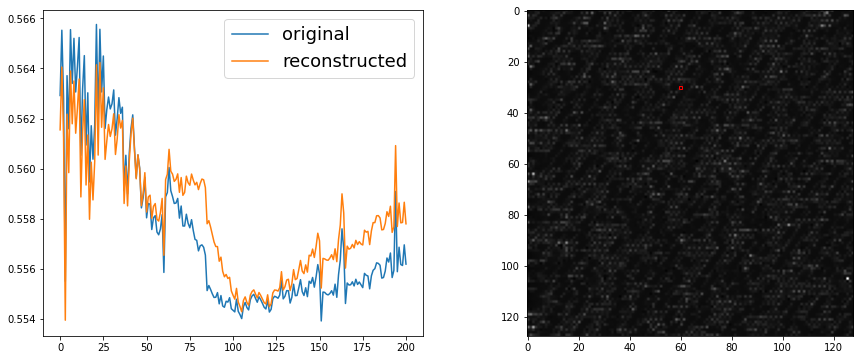

In [353]:
ii,jj = 30,60

fig,ax = plt.subplots(1,2,figsize=(15,6))

ax[0].plot(input_data[ii,jj,:], label = 'original')
ax[0].plot(Reconstruction[ii,jj,:], label = 'reconstructed')

ax[1].imshow(np.mean(input_data,axis=2), cmap = 'gray')
ax[1].add_patch(patches.Rectangle((jj-0.5,ii-0.5), 1,1, color = 'r', fill = False))

ax[0].legend(fontsize = 18)

In [354]:
error4 = np.zeros((Reconstruction.shape[0], Reconstruction.shape[1]))
for ii in range(error.shape[0]):
  for jj in range(error.shape[1]):
    error4[ii,jj] = MSE(input_data[ii,jj], Reconstruction[ii,jj])

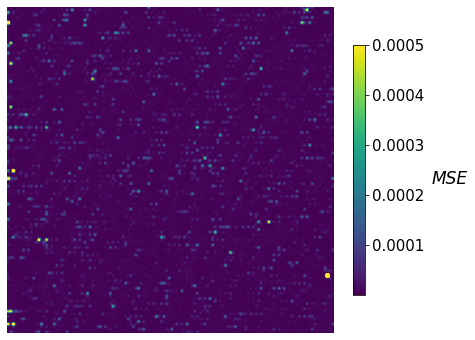

In [357]:
_,ax = plt.subplots(1,figsize=(7,6))
im = ax.imshow(error4, vmax = 0.0005)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.032, pad = 0.05)
cb.ax.tick_params(labelsize=15) 
cb.set_label("MSE", style = "italic", labelpad = 25, size = 17, rotation = 0)

## 5 Components

In [358]:
data = np.copy(didv)

# NORMALIZE!!!!!!

data = (data - np.min(data))/np.ptp(data)
energy_ax = exp_z_axis
data.min(), data.max()

(0.0, 1.0)

In [359]:
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

X_vec = np.copy(data.reshape((data.shape[0]*data.shape[1],data.shape[2])))

In [360]:
# Select number of components
nc = 5

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(5, 201) (16384, 5)


NUMBER OF COMPONENTS: 5
Components...


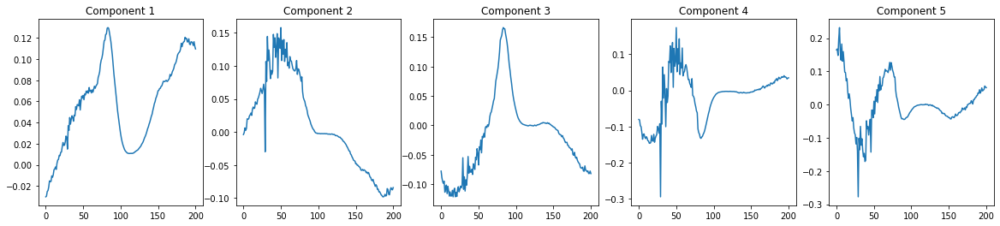

Abundance maps...


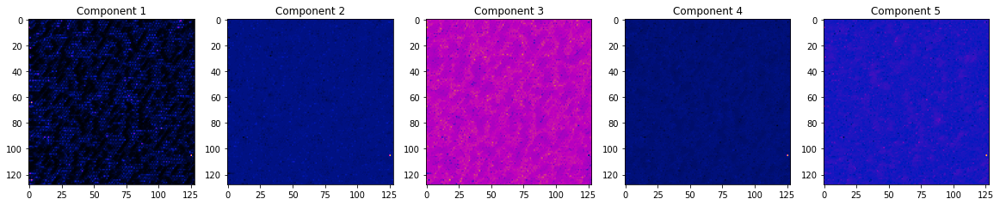

In [361]:
rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

print('NUMBER OF COMPONENTS: ' + str(nc))
print('Components...')
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(components[i])
    ax1.set_title('Component ' + str(i + 1))
plt.show()

print('Abundance maps...')
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = Cmap_Blackbody)
    ax2.set_title('Component ' + str(i + 1))
plt.show()

In [362]:
Reconstruction = np.zeros((d1,d2,d3))
Reconstruction.shape

(128, 128, 201)

In [363]:
abundancemaps = np.zeros((nc, d1, d2))
for L in range(nc):
  abundancemaps[L] = X_vec_t[:, L].reshape(d1, d2)
abundancemaps.shape

(5, 128, 128)

In [364]:
for ii in range(Reconstruction.shape[0]):
  for jj in range(Reconstruction.shape[1]):
    PC = np.zeros((nc, data.shape[2]))
    for L in range(nc):
      PC[L] = abundancemaps[L][ii,jj]*components[L]
    PCsum = np.sum(PC,axis=0)
    res = data[ii,jj] - PCsum
    Reconstruction[ii,jj] = res

In [365]:
Reconstruction.shape

(128, 128, 201)

Get the Error:

* take MSE for EACH pixel's spectra (input and encoded), and create map

In [366]:
# Here is an example...
input_data = np.copy(data)

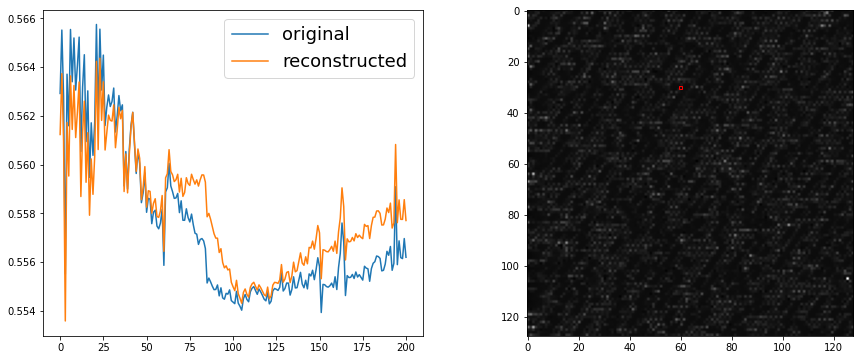

In [367]:
ii,jj = 30,60

fig,ax = plt.subplots(1,2,figsize=(15,6))

ax[0].plot(input_data[ii,jj,:], label = 'original')
ax[0].plot(Reconstruction[ii,jj,:], label = 'reconstructed')

ax[1].imshow(np.mean(input_data,axis=2), cmap = 'gray')
ax[1].add_patch(patches.Rectangle((jj-0.5,ii-0.5), 1,1, color = 'r', fill = False))

ax[0].legend(fontsize = 18)

In [368]:
error5 = np.zeros((Reconstruction.shape[0], Reconstruction.shape[1]))
for ii in range(error5.shape[0]):
  for jj in range(error5.shape[1]):
    error5[ii,jj] = MSE(input_data[ii,jj], Reconstruction[ii,jj])

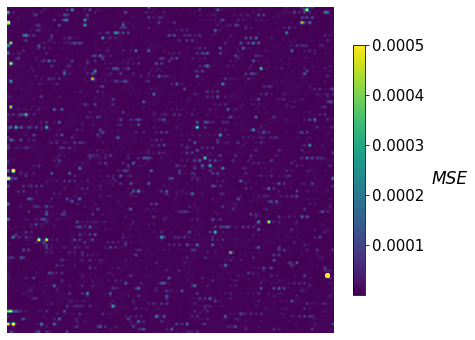

In [372]:
_,ax = plt.subplots(1,figsize=(7,6))
im = ax.imshow(error5, vmax = 0.0005)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.032, pad = 0.05)
cb.ax.tick_params(labelsize=15) 
cb.set_label("MSE", style = "italic", labelpad = 25, size = 17, rotation = 0)

## 6 Components

In [373]:
data = np.copy(didv)

# NORMALIZE!!!!!!

data = (data - np.min(data))/np.ptp(data)
energy_ax = exp_z_axis
data.min(), data.max()

(0.0, 1.0)

In [374]:
d1, d2, d3 = data.shape
X_vec = data.reshape(d1*d2, d3)

X_vec = np.copy(data.reshape((data.shape[0]*data.shape[1],data.shape[2])))

In [375]:
# Select number of components
nc = 6

# Select decomposition type ('PCA' or 'NMF')
decomposition_type = 'PCA'

# Run decomposition
if decomposition_type == 'NMF':
    clf = decomposition.NMF(n_components=nc, random_state=42)
elif decomposition_type == 'PCA':
    clf = decomposition.PCA(n_components=nc, random_state=42)
else:
    raise NotImplementedError('Available methods: "PCA", "NMF"')
    
X_vec_t = clf.fit_transform(X_vec)
components = clf.components_
components = components.reshape(nc, d3)
print(components.shape, X_vec_t.shape)

(6, 201) (16384, 6)


NUMBER OF COMPONENTS: 6
Components...


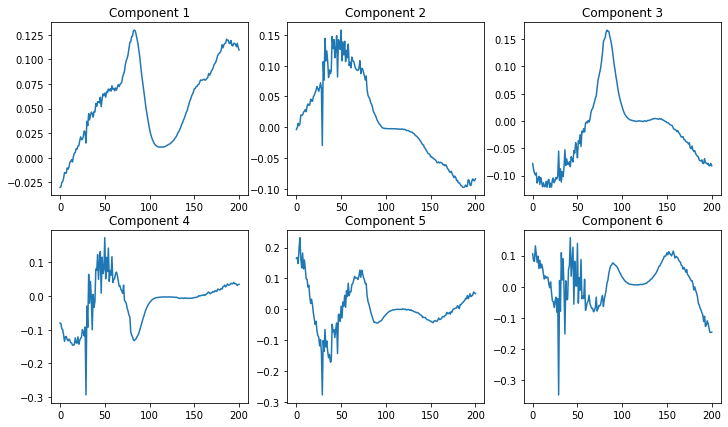

Abundance maps...


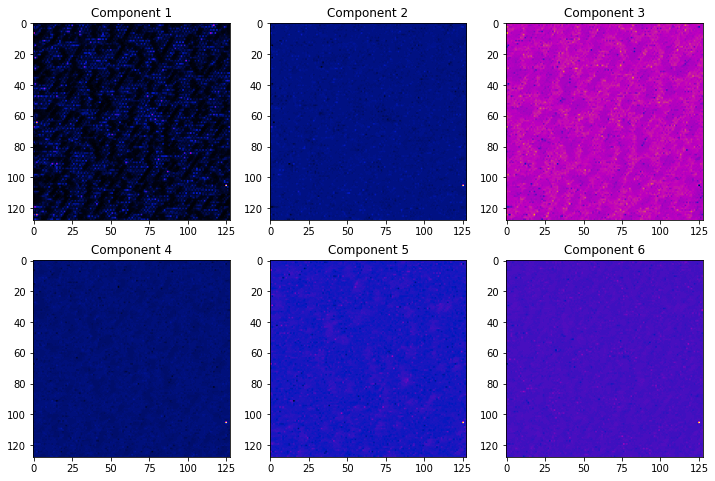

In [376]:
rows = int(np.ceil(float(nc)/5))
cols = int(np.ceil(float(nc)/rows))

print('NUMBER OF COMPONENTS: ' + str(nc))
print('Components...')
gs1 = gridspec.GridSpec(rows, cols)
fig1 = plt.figure(figsize = (4*cols, 3.5*(1+rows)//1.5))   
for i in range(nc):
    ax1 = fig1.add_subplot(gs1[i])
    j = 0
    ax1.plot(components[i])
    ax1.set_title('Component ' + str(i + 1))
plt.show()

print('Abundance maps...')
gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (4*cols, 4*(1+rows//1.5)))   
for i in range(nc):
    ax2 = fig2.add_subplot(gs2[i])
    ax2.imshow(X_vec_t[:, i].reshape(d1, d2), cmap = Cmap_Blackbody)
    ax2.set_title('Component ' + str(i + 1))
plt.show()

In [377]:
Reconstruction = np.zeros((d1,d2,d3))
Reconstruction.shape

(128, 128, 201)

In [378]:
abundancemaps = np.zeros((nc, d1, d2))
for L in range(nc):
  abundancemaps[L] = X_vec_t[:, L].reshape(d1, d2)
abundancemaps.shape

(6, 128, 128)

In [379]:
for ii in range(Reconstruction.shape[0]):
  for jj in range(Reconstruction.shape[1]):
    PC = np.zeros((nc, data.shape[2]))
    for L in range(nc):
      PC[L] = abundancemaps[L][ii,jj]*components[L]
    PCsum = np.sum(PC,axis=0)
    res = data[ii,jj] - PCsum
    Reconstruction[ii,jj] = res

In [380]:
Reconstruction.shape

(128, 128, 201)

Get the Error:

* take MSE for EACH pixel's spectra (input and encoded), and create map

In [381]:
# Here is an example...
input_data = np.copy(data)

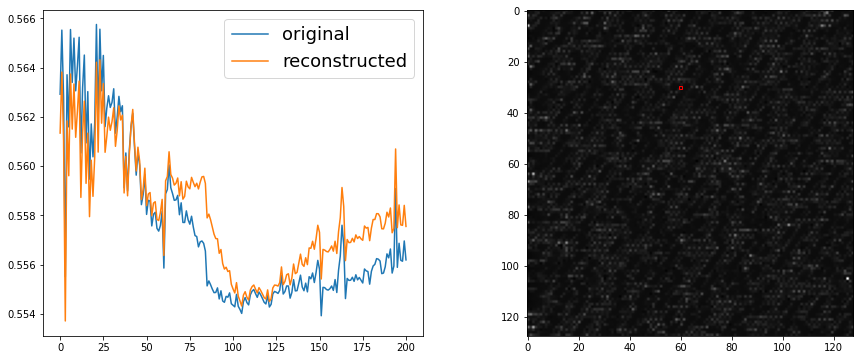

In [382]:
ii,jj = 30,60

fig,ax = plt.subplots(1,2,figsize=(15,6))

ax[0].plot(input_data[ii,jj,:], label = 'original')
ax[0].plot(Reconstruction[ii,jj,:], label = 'reconstructed')

ax[1].imshow(np.mean(input_data,axis=2), cmap = 'gray')
ax[1].add_patch(patches.Rectangle((jj-0.5,ii-0.5), 1,1, color = 'r', fill = False))

ax[0].legend(fontsize = 18)

In [383]:
error6 = np.zeros((Reconstruction.shape[0], Reconstruction.shape[1]))
for ii in range(error6.shape[0]):
  for jj in range(error6.shape[1]):
    error6[ii,jj] = MSE(input_data[ii,jj], Reconstruction[ii,jj])

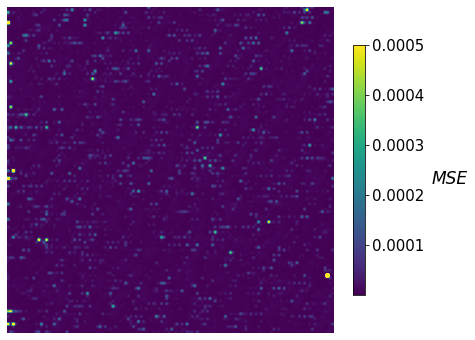

In [385]:
_,ax = plt.subplots(1,figsize=(7,6))
im = ax.imshow(error6, vmax = 0.0005)
ax.axis('off')
cb = plt.colorbar(im, ax=ax, fraction = 0.032, pad = 0.05)
cb.ax.tick_params(labelsize=15) 
cb.set_label("MSE", style = "italic", labelpad = 25, size = 17, rotation = 0)